# CELLPHONE PRICE RANGE PREDICTION CLASSIFICATION MODEL
A mobile phone, cell phone, cellphone, or hand phone, sometimes shortened to simply mobile, cell or just phone, is a portable telephone that can make and receive calls over a radio frequency link while the user is moving within a telephone service area.

The first handheld mobile phone was demonstrated by John F. Mitchell and Martin Cooper of Motorola in 1973, using a handset weighing c. 2 kilograms (4.4 lbs).

In 1979, Nippon Telegraph and Telephone (NTT) launched the world's first cellular network in Japan. In 1983, the DynaTAC 8000x was the first commercially available handheld mobile phone. From 1983 to 2014, worldwide mobile phone subscriptions grew to over seven billion—enough to provide one for every person on Earth.

In first quarter of 2016, the top smartphone developers worldwide were Samsung, Apple, and Huawei, and smartphone sales represented 78 percent of total mobile phone sales. For feature phones (or "dumbphones") as of 2016, the largest were Samsung, Nokia, and Alcatel.

source:https://en.wikipedia.org/wiki/Mobile_phone

# Evolution of Mobile Phone
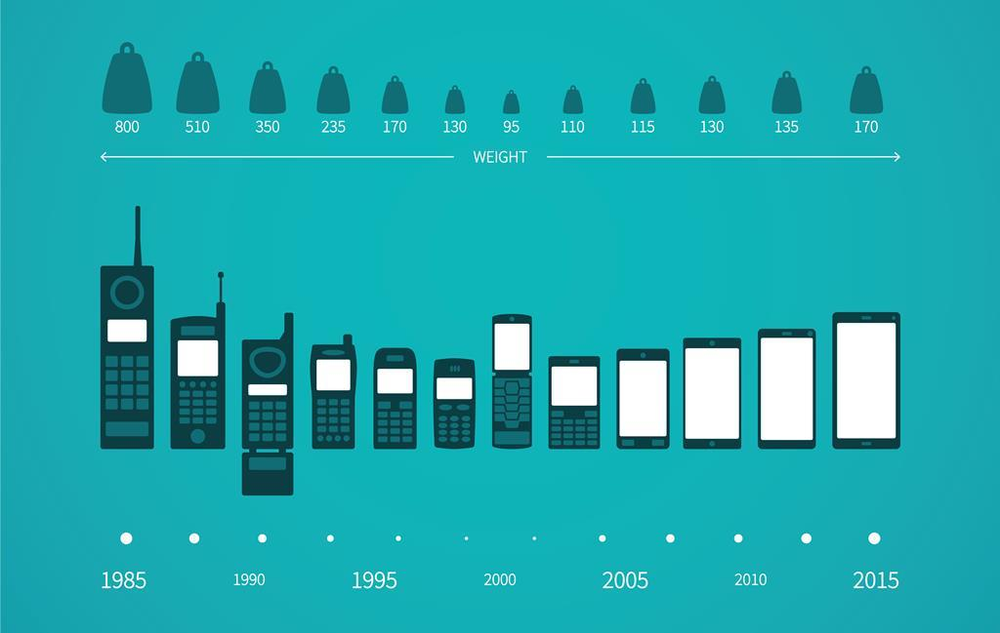

# Import all necessary Libraries

In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, auc, recall_score, precision_score, f1_score
from sklearn.metrics import roc_auc_score, mean_squared_error, confusion_matrix, classification_report
from sklearn.feature_selection import SelectKBest, chi2

from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from yellowbrick.model_selection import CVScores
from pycaret.classification import *

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode,iplot
import plotly as py
import cufflinks as cf
py.offline.init_notebook_mode(connected=True)
init_notebook_mode(connected=True)

init_notebook_mode(connected=True)
cf.go_offline()

import warnings
warnings.filterwarnings('ignore')

# Load Data

In [2]:
data=pd.read_csv("Cellphone Price Range.csv")

### In the following table, first 6 entries are shown.

In [3]:
data.head(6)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1
5,1859,0,0.5,1,3,0,22,0.7,164,1,7,1004,1654,1067,17,1,10,1,0,0,1


In [4]:
datahead=data.head(6)
table_fig = ff.create_table(datahead, height_constant=35)
table_fig.layout.width=2500
for i in range(len(table_fig.layout.annotations)):
    table_fig.layout.annotations[i].font.size = 15
iplot(table_fig)

## Profile Report of Data

In [5]:
data.profile_report()

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [7]:
data.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,9.916500,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,6.064315,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,5.000000,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [8]:
data.var()

battery_power    1.930884e+05
blue             2.501001e-01
clock_speed      6.658629e-01
dual_sim         2.500348e-01
fc               1.884813e+01
four_g           2.496626e-01
int_memory       3.292670e+02
m_dep            8.318353e-02
mobile_wt        1.253136e+03
n_cores          5.234197e+00
pc               3.677592e+01
px_height        1.969414e+05
px_width         1.867964e+05
ram              1.176644e+06
sc_h             1.775143e+01
sc_w             1.897820e+01
talk_time        2.985481e+01
three_g          1.817086e-01
touch_screen     2.501161e-01
wifi             2.500760e-01
price_range      1.250625e+00
dtype: float64

## Check Correlation of Data

<AxesSubplot:>

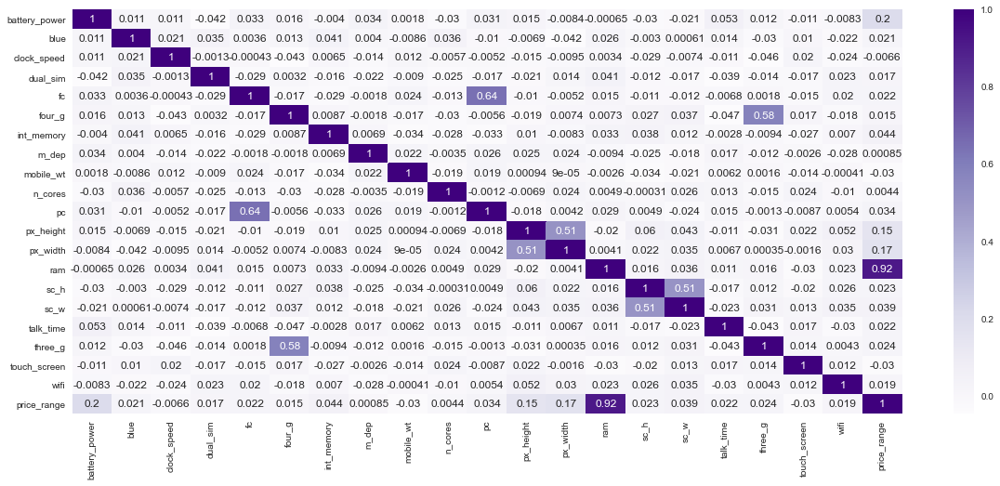

In [9]:
fig = plt.figure(figsize=(20, 8))

sns.heatmap(data.corr(), annot = True, cmap = "Purples")

### INSIGHT
- <h> target price range has highly positive correlation between ram.
- <h> 3G and 4G
- <h> px_weight(Pixel Resolution Width) and px_height(Pixel Resolution Height)
- <h> int_memory

features have highly positive correlation.

# Check Variance of Data

In [10]:
corr=data.corr()
corr.sort_values(by=['price_range'], ascending=False).iloc[0].sort_values(ascending=False)

price_range      1.000000
ram              0.917046
battery_power    0.200723
px_width         0.165818
px_height        0.148858
int_memory       0.044435
sc_w             0.038711
pc               0.033599
three_g          0.023611
sc_h             0.022986
fc               0.021998
talk_time        0.021859
blue             0.020573
wifi             0.018785
dual_sim         0.017444
four_g           0.014772
n_cores          0.004399
m_dep            0.000853
clock_speed     -0.006606
mobile_wt       -0.030302
touch_screen    -0.030411
Name: price_range, dtype: float64

# Battery Power- RAM and Price Range
### Following scatter plot shows battery power and ram values according to price range.

In [11]:
data_0=data[data.price_range==0]
data_1=data[data.price_range==1]
data_2=data[data.price_range==2]
data_3=data[data.price_range==3]

In [12]:
trace1=go.Scatter(
    x=data_0.ram, y=data_0.battery_power, mode='markers', name='Price Range: 0',
                  marker=dict(color='rgba(180, 74, 8,0.8)'), text=data_0.price_range)
trace2=go.Scatter(
    x=data_1.ram, y=data_1.battery_power, mode='markers', name='Price Range: 1',
                  marker=dict(color='rgba(9, 123, 52, 0.8)'), text=data_1.price_range)
trace3=go.Scatter(
    x=data_2.ram, y=data_2.battery_power, mode='markers', name='Price Range: 2',
                  marker=dict(color='rgba(237, 12, 79, 0.8)'), text=data_2.price_range)
trace4=go.Scatter(
    x=data_3.ram, y=data_3.battery_power, mode='markers', name='Price Range: 3',
                  marker=dict(color='rgba(50, 70, 190, 0.8)'), text=data_3.price_range)

trace = [trace1, trace2, trace3, trace4]

layout = dict(title = 'Ram - Battery Power - Price Range',
              xaxis= dict(title= 'Ram',
                          ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Battery Power',
                          ticklen= 5,zeroline= False),
             autosize=False,
             width=980,
             height=700,)
fig = dict(data = trace, layout = layout)
    
iplot(fig)

### Following Histogram and Violin plot shows ram data.

In [13]:
fig=px.histogram(data['ram'], title="RAM", marginal='violin', color_discrete_sequence=['green'])
fig.update_layout(xaxis_title_text='Ram', yaxis_title_text='Frequency', bargap=0.2, showlegend=False, autosize=False,
                 width=900, height=500)
iplot(fig)

# 3G - 4G - Price Range
### Following swarmplot plot shows relation between 3G according to Price Range and 4G according to Price Range distribution

<AxesSubplot:xlabel='three_g', ylabel='ram'>

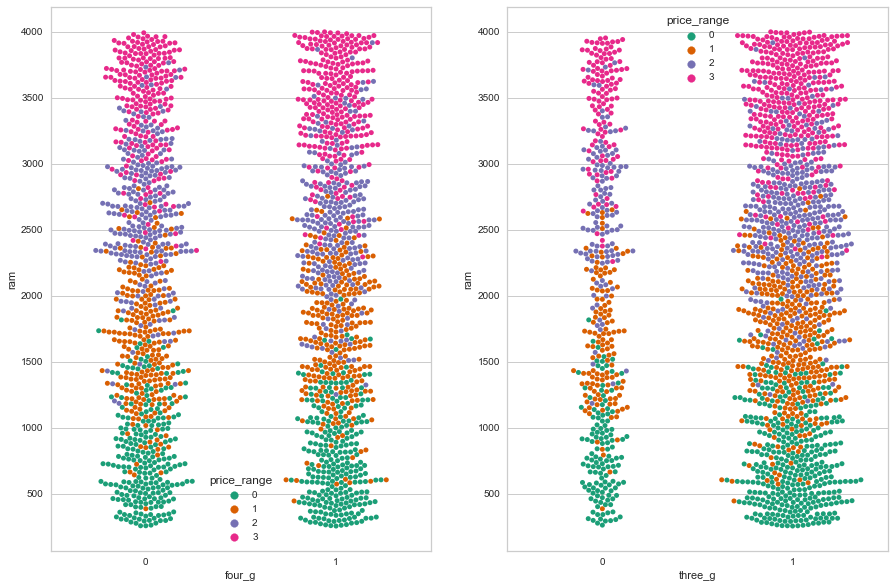

In [14]:
fig= plt.figure(figsize=(15, 10))
plt.subplot(1,2,1)
sns.swarmplot(x=data["four_g"], y=data["ram"], hue=data["price_range"], palette='Dark2')
plt.subplot(1,2,2)
sns.swarmplot(x=data["three_g"], y=data["ram"], hue=data["price_range"], palette='Dark2')

### Following Pie Plot show Percentage of mobile which has 3G and 4G or not

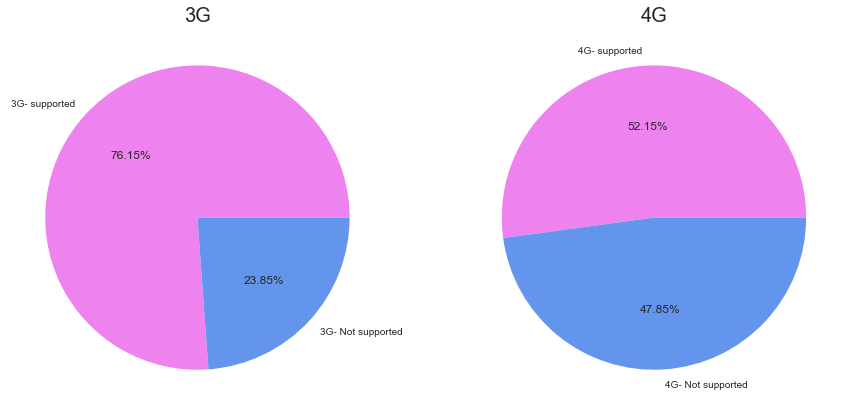

In [15]:
values_3g = data["three_g"].value_counts()
values_4g = data["four_g"].value_counts()

labels4g = ["4G- supported",'4G- Not supported']
labels3g = ["3G- supported",'3G- Not supported']

colors = ["violet", "cornflowerblue"]

fig = plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.pie(x= values_3g, autopct="%.2f%%",
        labels=labels3g, pctdistance=0.6,
        colors = colors)
plt.title('3G', size = 20)

plt.subplot(1,2,2)
plt.pie(x =values_4g,autopct="%.2f%%", 
        labels=labels4g, pctdistance=0.6, 
        colors = colors)
plt.title('4G', size = 20)
plt.show()

### Check price Range is balanced or not

In [16]:
price_range=data['price_range'].value_counts()
fig= px.bar(price_range, y='price_range', text='price_range', 
      color=["Price Range : 0", "Price Range : 1", "Price Range : 2", "Price Range : 3"],
      )
fig.update_layout(title="Price Range", showlegend=True,
                 xaxis=dict(zeroline=False, tickmode='linear', tick0=0, dtick=1), autosize=False, 
                 width=900, height=500, xaxis_title_text="Price Range",
                 yaxis_title_text="frequency")
fig.show()

### Following Bar shows n_cores (Number of cores of processor) distribution 

In [17]:
data['n_cores'].unique()

array([2, 3, 5, 6, 1, 8, 4, 7], dtype=int64)

In [18]:
n_cores=data['n_cores'].value_counts()
fig= px.bar(n_cores, y='n_cores', text='n_cores', 
      color=["2", "3", "5", "6", "1", "8", "4", "7"],
      )
fig.update_layout(title="N Cores", showlegend=True,
                 xaxis=dict(zeroline=False, tickmode='linear', tick0=0, dtick=1), autosize=False, 
                 width=900, height=500, xaxis_title_text="N Cores",
                 yaxis_title_text="frequency")
fig.show()

### Following Pie plot shows percentge of mobile which has Bluetooth or not

In [19]:
data['blue'].unique()

array([0, 1], dtype=int64)

In [20]:
fig=px.pie(data['blue'].value_counts().reset_index(), values='blue', names=['No Bluetooth', 'Bluetooth'])
fig.update_traces(textposition='inside', textinfo='percent+label', hole=0.5,
                  marker=dict(colors= ['#0D20A0','#5EA106'], line=dict(color="white", width=3)))
fig.update_layout(annotations=[dict(text="Bluetooth", x=0.5, y=0.5, font_size=24, 
                                    showarrow=False, font_family="roman", font_color='black')],
                  showlegend=True)
fig.show()

# Dual Sim - Ram - Price Range
### Following graph shows relation between Mobile which has dual sim or not with RAM accoring to price range

In [21]:
data['dual_sim'].unique()

array([0, 1], dtype=int64)

<Figure size 1296x504 with 0 Axes>

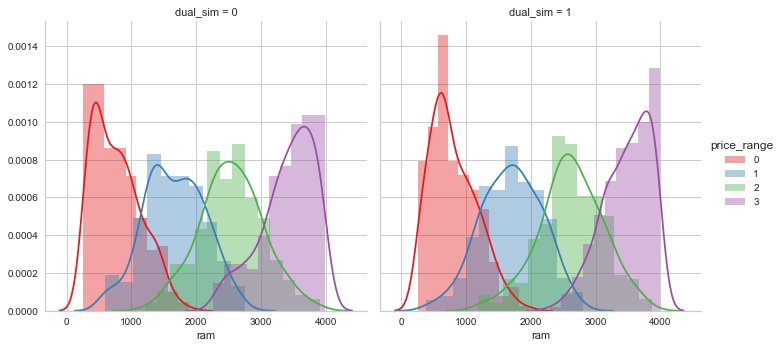

In [22]:
fig=plt.figure(figsize=(18,7))
show= sns.FacetGrid(data, col="dual_sim", hue="price_range", palette="Set1",height=5)
show = (show.map(sns.distplot, "ram").add_legend())

### Following Pie plot shows the percentge of Mobile which has Dual Sim Support or not

In [23]:
fig=px.pie(data['dual_sim'].value_counts().reset_index(), values='dual_sim', names=['No Dual Sim Support', 'Dual Sim Support'])
fig.update_traces(textposition='inside', textinfo='percent+label', hole=0.5,
                  marker=dict(colors= ['#ED0C2E','#ECCA08'], line=dict(color="white", width=3)))
fig.update_layout(annotations=[dict(text="Dual Sim", x=0.5, y=0.5, font_size=24, 
                                    showarrow=False, font_family="roman", font_color='black')],
                  showlegend=True)
fig.show()

### Following Pie plot shows percentage of Mobile which has Wifi or not

In [24]:
data['wifi'].unique()

array([1, 0], dtype=int64)

In [25]:
fig=px.pie(data['wifi'].value_counts().reset_index(), values='wifi', names=['No WiFi Support', 'WiFi Support'])
fig.update_traces(textposition='inside', textinfo='percent+label', hole=0.5,
                  marker=dict(colors= ['#E808EC','#F69031'], line=dict(color="white", width=3)))
fig.update_layout(annotations=[dict(text="WiFi", x=0.5, y=0.5, font_size=24, 
                                    showarrow=False, font_family="roman", font_color='black')],
                  showlegend=True)
fig.show()

# Price Range - Battery
### Following point plot shows the relation between Price range and Battery

<AxesSubplot:xlabel='price_range', ylabel='battery_power'>

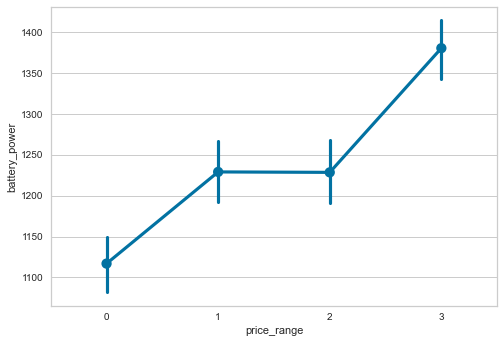

In [26]:
sns.pointplot(x=data['price_range'], y=data['battery_power'], join=True)

### Following Histogram and Violin plot shows the distribution of Battery data

In [27]:
fig=px.histogram(data['battery_power'], title="Battery Power", marginal='violin', color_discrete_sequence=['red'])
fig.update_layout(xaxis_title_text='Battery Power', yaxis_title_text='Frequency', 
                  bargap=0.2, showlegend=False, autosize=False,
                 width=900, height=500)
iplot(fig)

### Following Histogram and Violin plot shows the distribution of int_memory (Internal Memory) data

In [28]:
fig=px.histogram(data['int_memory'], title="Internal Memory", marginal='violin', color_discrete_sequence=['blue'])
fig.update_layout(xaxis_title_text="Internal Memory", yaxis_title_text='frequency',
                 bargap=0.2, showlegend=False, autosize=False, width=900, height=500)
iplot(fig)

## Following Violin plot shows the relation and distribution of Price range vary with RAM

In [29]:
trace1=go.Violin(
    y=data_0.ram, name='Price Range: 0',
                  marker=dict(color='rgba(180, 74, 8,0.8)'))
trace2=go.Violin(
    y=data_1.ram, name='Price Range: 1',
                  marker=dict(color='rgba(9, 123, 52, 0.8)'))
trace3=go.Violin(
    y=data_2.ram, name='Price Range: 2',
                  marker=dict(color='rgba(237, 12, 79, 0.8)'))
trace4=go.Violin(
    y=data_3.ram, name='Price Range: 3',
                  marker=dict(color='rgba(50, 70, 190, 0.8)'))

trace = [trace1, trace2, trace3, trace4]

layout = dict(title = 'Ram - Price Range',
              xaxis= dict(title= 'Price Range',
                          ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Ram',
                          ticklen= 5,zeroline= False),
             autosize=False,
             width=980,
             height=700,)
fig = dict(data = trace, layout = layout)
    
iplot(fig)

## Following Violin plot shows the relation and distribution of Price range vary with Battery Power

In [30]:
trace1=go.Violin(
    y=data_0.battery_power, name='Price Range: 0',
                  marker=dict(color='rgba(180, 74, 8,0.8)'))
trace2=go.Violin(
    y=data_1.battery_power, name='Price Range: 1',
                  marker=dict(color='rgba(9, 123, 52, 0.8)'))
trace3=go.Violin(
    y=data_2.battery_power, name='Price Range: 2',
                  marker=dict(color='rgba(237, 12, 79, 0.8)'))
trace4=go.Violin(
    y=data_3.battery_power, name='Price Range: 3',
                  marker=dict(color='rgba(50, 70, 190, 0.8)'))

trace = [trace1, trace2, trace3, trace4]

layout = dict(title = 'Battery Power - Price Range',
              xaxis= dict(title= 'Price Range',
                          ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Battery Power',
                          ticklen= 5,zeroline= False),
             autosize=False,
             width=980,
             height=700,)
fig = dict(data = trace, layout = layout)
    
iplot(fig)

# Following Histogram shows how price varies with px_height (Pixel Resolution Height)

In [31]:
fig=px.histogram(data, x='px_height', title="Phone Height - Price Range", color='price_range')
fig.update_layout(xaxis_title_text="Phone Height", yaxis_title_text='Price Range',
                 bargap=0.01,autosize=False, width=950, height=500)
iplot(fig)

# Following Histogram show how price varies with px_width (Pixel Resolution Width) 

In [32]:
fig=px.histogram(data, x='px_width', title="Phone Width - Price Range", color='price_range')
fig.update_layout(xaxis_title_text="Phone Width", yaxis_title_text='Price Range',
                 bargap=0.01,autosize=False, width=950, height=500)
iplot(fig)

In [33]:
data1=data.copy()

#### Remove Target features from datasets for further modeling

In [34]:
target = data1['price_range']
data1.drop(['price_range'], axis=1, inplace=True)

In [35]:
data2=data1.copy()
data2.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0


## Feature Scaling

In [36]:
scalar=StandardScaler()
scalar.fit(data2)

StandardScaler()

In [37]:
# Create Data frame of scaled data
data2 = pd.DataFrame(scalar.transform(data2), index=data2.index, columns=data2.columns)

In [38]:
data2.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,-0.902597,-0.990050,0.830779,-1.019184,-0.762495,-1.043966,-1.380644,0.340740,1.349249,-1.101971,-1.305750,-1.408949,-1.146784,0.391703,-0.784983,0.283103,1.462493,-1.786861,-1.006018,0.986097
1,-0.495139,1.010051,-1.253064,0.981177,-0.992890,0.957886,1.155024,0.687548,-0.120059,-0.664768,-0.645989,0.585778,1.704465,0.467317,1.114266,-0.635317,-0.734267,0.559641,0.994018,-1.014099
2,-1.537686,1.010051,-1.253064,0.981177,-0.532099,0.957886,0.493546,1.381165,0.134244,0.209639,-0.645989,1.392684,1.074968,0.441498,-0.310171,-0.864922,-0.368140,0.559641,0.994018,-1.014099
3,-1.419319,1.010051,1.198517,-1.019184,-0.992890,-1.043966,-1.215274,1.034357,-0.261339,0.646842,-0.151168,1.286750,1.236971,0.594569,0.876859,0.512708,-0.002014,0.559641,-1.006018,-1.014099
4,1.325906,1.010051,-0.395011,-1.019184,2.002254,0.957886,0.658915,0.340740,0.021220,-1.101971,0.673534,1.268718,-0.091452,-0.657666,-1.022389,-0.864922,0.730240,0.559641,0.994018,-1.014099


In [39]:
data3=data2.copy()
data3.head(2)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,-0.902597,-0.990050,0.830779,-1.019184,-0.762495,-1.043966,-1.380644,0.340740,1.349249,-1.101971,-1.305750,-1.408949,-1.146784,0.391703,-0.784983,0.283103,1.462493,-1.786861,-1.006018,0.986097
1,-0.495139,1.010051,-1.253064,0.981177,-0.992890,0.957886,1.155024,0.687548,-0.120059,-0.664768,-0.645989,0.585778,1.704465,0.467317,1.114266,-0.635317,-0.734267,0.559641,0.994018,-1.014099


# Spliting data into Train test split

In [40]:
x=data3
y=target

In [41]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42)

In [42]:
x_train.shape, y_train.shape

((1600, 20), (1600,))

In [43]:
x_test.shape, y_test.shape

((400, 20), (400,))

# Modelling - Algorithms selection
## For selecting which regression algorithm is best for model, used pycaret.
### For using pycaret we transform split data into Data-frame

In [44]:
x_train_T = pd.DataFrame(x_train)
y_train_T = pd.DataFrame(y_train)

In [45]:
setup(pd.concat([x_train_T, y_train_T], axis=1), target='price_range')

,Description,Value
0,session_id,1591
1,Target,price_range
2,Target Type,Multiclass
3,Label Encoded,"0: 0, 1: 1, 2: 2, 3: 3"
4,Original Data,"(1600, 21)"
5,Missing Values,False
6,Numeric Features,14
7,Categorical Features,6
8,Ordinal Features,False
9,High Cardinality Features,False


(1591,
       battery_power  clock_speed        fc  int_memory     m_dep  mobile_wt  \
 968        1.558089    -1.253064  0.619880    0.769162 -0.006069   1.434017   
 240       -1.378345     0.830779 -0.992890    0.934531 -1.393304  -0.035292   
 819       -0.005733    -0.762748 -0.532099    1.375517 -1.393304   1.349249   
 692       -1.041452    -0.517590 -0.532099    0.328176 -0.352878   1.631808   
 420        0.495054    -1.253064  0.619880   -1.380643 -0.352878  -0.995993   
 ...             ...          ...       ...         ...       ...        ...   
 1130       1.676457     0.463042 -0.532099   -0.057686  1.381166   0.303779   
 1294      -1.478503    -1.253064 -0.762495    1.485764  0.687548   0.162500   
 860        1.344116    -1.253064 -0.992890   -0.939658 -0.352878   0.558083   
 1459       1.567194    -0.762748 -0.301703   -1.160151 -0.352878   1.405761   
 1126      -1.373793    -1.130485 -0.762495    0.989655 -0.699686  -1.222041   
 
        n_cores        pc  px_h

In [46]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9366,0.9965,0.9368,0.9386,0.9364,0.9154,0.9162,3.1520
lda,Linear Discriminant Analysis,0.9348,0.9951,0.9347,0.9385,0.9352,0.9130,0.9139,0.1140
catboost,CatBoost Classifier,0.9223,0.9932,0.9225,0.9255,0.9225,0.8963,0.8973,14.2610
qda,Quadratic Discriminant Analysis,0.9071,0.9905,0.9072,0.9095,0.9068,0.8760,0.8770,0.0450
xgboost,Extreme Gradient Boosting,0.9017,0.9866,0.9021,0.9052,0.9017,0.8689,0.8701,1.7930
lightgbm,Light Gradient Boosting Machine,0.9008,0.9860,0.9011,0.9041,0.9009,0.8678,0.8688,2.0180
gbc,Gradient Boosting Classifier,0.8901,0.9824,0.8903,0.8934,0.8901,0.8534,0.8545,1.2840
rf,Random Forest Classifier,0.8535,0.9714,0.8540,0.8556,0.8534,0.8045,0.8052,0.5020
et,Extra Trees Classifier,0.8534,0.9672,0.8540,0.8553,0.8528,0.8045,0.8055,0.4130
dt,Decision Tree Classifier,0.8204,0.8801,0.8212,0.8241,0.8202,0.7605,0.7618,0.0290


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1591, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# Train the model using these top 10 algorithms

In [47]:
models = {
    "catboost": CatBoostClassifier(),
    "Logistic": LogisticRegression(),
    "LDA": LinearDiscriminantAnalysis(),
    "QDA": QuadraticDiscriminantAnalysis(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "Xgboost" : XGBClassifier(eval_metric='mlogloss'),
    "Lightgbm" : LGBMClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Decision Tree" : DecisionTreeClassifier(),
    "Support Vector" : SVC()
}

# Visualization for Training
# Cross validation test for Accuracy score and Mean square error

In [48]:
AccuracyScore = {'Accuracy':{},'Mean':{},'std':{}}
mse_results = {'MSE':{},'Mean':{},'std':{}}
n_folds = 5
kfold = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(x_train)

for name in models:
    model = models[name]
    Accuracy = cross_val_score(model, x_train, y_train, scoring='accuracy', cv=kfold)   #Accuracy
    mse = np.sqrt(-cross_val_score(model,x_train , y_train, cv=kfold,        #MSE
                                   scoring='neg_mean_squared_error'))
    
    #save the R-Squared reults
    AccuracyScore['Accuracy'][name] = Accuracy
    AccuracyScore['Mean'][name] = Accuracy.mean()
    AccuracyScore['std'][name] = Accuracy.std()
    
    #save the RMSE reults
    mse_results['MSE'][name] = mse
    mse_results['Mean'][name] = mse.mean()
    mse_results['std'][name] = mse.std()

Learning rate set to 0.080129
0:	learn: 1.2942642	total: 271ms	remaining: 4m 30s
1:	learn: 1.2255254	total: 378ms	remaining: 3m 8s
2:	learn: 1.1607166	total: 427ms	remaining: 2m 21s
3:	learn: 1.0988710	total: 461ms	remaining: 1m 54s
4:	learn: 1.0265580	total: 500ms	remaining: 1m 39s
5:	learn: 0.9613989	total: 534ms	remaining: 1m 28s
6:	learn: 0.9300374	total: 566ms	remaining: 1m 20s
7:	learn: 0.8867611	total: 609ms	remaining: 1m 15s
8:	learn: 0.8528848	total: 649ms	remaining: 1m 11s
9:	learn: 0.8203271	total: 696ms	remaining: 1m 8s
10:	learn: 0.7818477	total: 741ms	remaining: 1m 6s
11:	learn: 0.7438725	total: 797ms	remaining: 1m 5s
12:	learn: 0.7178045	total: 845ms	remaining: 1m 4s
13:	learn: 0.6852959	total: 891ms	remaining: 1m 2s
14:	learn: 0.6624731	total: 936ms	remaining: 1m 1s
15:	learn: 0.6380476	total: 981ms	remaining: 1m
16:	learn: 0.6207679	total: 1.02s	remaining: 58.9s
17:	learn: 0.6036066	total: 1.05s	remaining: 57.5s
18:	learn: 0.5868373	total: 1.09s	remaining: 56.6s
19:	le

163:	learn: 0.1287345	total: 4.72s	remaining: 24.1s
164:	learn: 0.1283114	total: 4.75s	remaining: 24s
165:	learn: 0.1274040	total: 4.77s	remaining: 24s
166:	learn: 0.1269107	total: 4.79s	remaining: 23.9s
167:	learn: 0.1259669	total: 4.81s	remaining: 23.8s
168:	learn: 0.1253765	total: 4.83s	remaining: 23.7s
169:	learn: 0.1250071	total: 4.84s	remaining: 23.6s
170:	learn: 0.1244371	total: 4.85s	remaining: 23.5s
171:	learn: 0.1239258	total: 4.88s	remaining: 23.5s
172:	learn: 0.1232820	total: 4.91s	remaining: 23.5s
173:	learn: 0.1223719	total: 4.94s	remaining: 23.4s
174:	learn: 0.1214656	total: 4.95s	remaining: 23.4s
175:	learn: 0.1210591	total: 4.97s	remaining: 23.3s
176:	learn: 0.1205218	total: 4.99s	remaining: 23.2s
177:	learn: 0.1201185	total: 5.01s	remaining: 23.1s
178:	learn: 0.1197965	total: 5.03s	remaining: 23.1s
179:	learn: 0.1190882	total: 5.05s	remaining: 23s
180:	learn: 0.1187613	total: 5.07s	remaining: 22.9s
181:	learn: 0.1180530	total: 5.08s	remaining: 22.8s
182:	learn: 0.1173

326:	learn: 0.0664886	total: 8.03s	remaining: 16.5s
327:	learn: 0.0662279	total: 8.05s	remaining: 16.5s
328:	learn: 0.0660022	total: 8.07s	remaining: 16.5s
329:	learn: 0.0658819	total: 8.08s	remaining: 16.4s
330:	learn: 0.0654352	total: 8.11s	remaining: 16.4s
331:	learn: 0.0652168	total: 8.13s	remaining: 16.4s
332:	learn: 0.0650324	total: 8.14s	remaining: 16.3s
333:	learn: 0.0647592	total: 8.16s	remaining: 16.3s
334:	learn: 0.0646129	total: 8.18s	remaining: 16.2s
335:	learn: 0.0644651	total: 8.2s	remaining: 16.2s
336:	learn: 0.0644028	total: 8.22s	remaining: 16.2s
337:	learn: 0.0642595	total: 8.24s	remaining: 16.1s
338:	learn: 0.0640464	total: 8.25s	remaining: 16.1s
339:	learn: 0.0638354	total: 8.27s	remaining: 16.1s
340:	learn: 0.0636843	total: 8.28s	remaining: 16s
341:	learn: 0.0635176	total: 8.3s	remaining: 16s
342:	learn: 0.0633127	total: 8.32s	remaining: 15.9s
343:	learn: 0.0631177	total: 8.34s	remaining: 15.9s
344:	learn: 0.0628853	total: 8.36s	remaining: 15.9s
345:	learn: 0.0627

489:	learn: 0.0430190	total: 11.6s	remaining: 12.1s
490:	learn: 0.0429071	total: 11.6s	remaining: 12s
491:	learn: 0.0428393	total: 11.7s	remaining: 12s
492:	learn: 0.0427247	total: 11.7s	remaining: 12s
493:	learn: 0.0426530	total: 11.7s	remaining: 12s
494:	learn: 0.0425988	total: 11.7s	remaining: 12s
495:	learn: 0.0425038	total: 11.7s	remaining: 11.9s
496:	learn: 0.0424371	total: 11.8s	remaining: 11.9s
497:	learn: 0.0423373	total: 11.8s	remaining: 11.9s
498:	learn: 0.0422799	total: 11.8s	remaining: 11.9s
499:	learn: 0.0421123	total: 11.8s	remaining: 11.8s
500:	learn: 0.0419991	total: 11.9s	remaining: 11.8s
501:	learn: 0.0418617	total: 11.9s	remaining: 11.8s
502:	learn: 0.0417816	total: 11.9s	remaining: 11.8s
503:	learn: 0.0416361	total: 11.9s	remaining: 11.7s
504:	learn: 0.0415466	total: 12s	remaining: 11.7s
505:	learn: 0.0414204	total: 12s	remaining: 11.7s
506:	learn: 0.0413281	total: 12s	remaining: 11.7s
507:	learn: 0.0411865	total: 12s	remaining: 11.6s
508:	learn: 0.0411023	total: 1

648:	learn: 0.0303522	total: 14.9s	remaining: 8.05s
649:	learn: 0.0302870	total: 14.9s	remaining: 8.02s
650:	learn: 0.0302453	total: 14.9s	remaining: 8s
651:	learn: 0.0301856	total: 14.9s	remaining: 7.97s
652:	learn: 0.0301453	total: 14.9s	remaining: 7.94s
653:	learn: 0.0300876	total: 15s	remaining: 7.91s
654:	learn: 0.0300287	total: 15s	remaining: 7.88s
655:	learn: 0.0299646	total: 15s	remaining: 7.86s
656:	learn: 0.0299026	total: 15s	remaining: 7.83s
657:	learn: 0.0298711	total: 15s	remaining: 7.8s
658:	learn: 0.0298197	total: 15s	remaining: 7.77s
659:	learn: 0.0297746	total: 15s	remaining: 7.74s
660:	learn: 0.0297061	total: 15s	remaining: 7.71s
661:	learn: 0.0296460	total: 15.1s	remaining: 7.69s
662:	learn: 0.0296183	total: 15.1s	remaining: 7.66s
663:	learn: 0.0295470	total: 15.1s	remaining: 7.64s
664:	learn: 0.0294630	total: 15.1s	remaining: 7.61s
665:	learn: 0.0294183	total: 15.1s	remaining: 7.58s
666:	learn: 0.0293713	total: 15.1s	remaining: 7.56s
667:	learn: 0.0293401	total: 15.

817:	learn: 0.0226359	total: 17.6s	remaining: 3.93s
818:	learn: 0.0225660	total: 17.7s	remaining: 3.9s
819:	learn: 0.0225393	total: 17.7s	remaining: 3.88s
820:	learn: 0.0225002	total: 17.7s	remaining: 3.86s
821:	learn: 0.0224705	total: 17.7s	remaining: 3.83s
822:	learn: 0.0224248	total: 17.7s	remaining: 3.81s
823:	learn: 0.0224032	total: 17.7s	remaining: 3.79s
824:	learn: 0.0223712	total: 17.7s	remaining: 3.76s
825:	learn: 0.0223206	total: 17.8s	remaining: 3.74s
826:	learn: 0.0222912	total: 17.8s	remaining: 3.72s
827:	learn: 0.0222633	total: 17.8s	remaining: 3.69s
828:	learn: 0.0222393	total: 17.8s	remaining: 3.67s
829:	learn: 0.0222052	total: 17.8s	remaining: 3.65s
830:	learn: 0.0221527	total: 17.8s	remaining: 3.63s
831:	learn: 0.0221260	total: 17.9s	remaining: 3.61s
832:	learn: 0.0220782	total: 17.9s	remaining: 3.58s
833:	learn: 0.0220580	total: 17.9s	remaining: 3.56s
834:	learn: 0.0220179	total: 17.9s	remaining: 3.54s
835:	learn: 0.0219706	total: 17.9s	remaining: 3.52s
836:	learn: 0

978:	learn: 0.0177140	total: 21.2s	remaining: 455ms
979:	learn: 0.0177037	total: 21.3s	remaining: 434ms
980:	learn: 0.0176830	total: 21.3s	remaining: 412ms
981:	learn: 0.0176426	total: 21.3s	remaining: 390ms
982:	learn: 0.0176130	total: 21.3s	remaining: 369ms
983:	learn: 0.0175885	total: 21.3s	remaining: 347ms
984:	learn: 0.0175621	total: 21.3s	remaining: 325ms
985:	learn: 0.0175498	total: 21.4s	remaining: 303ms
986:	learn: 0.0175352	total: 21.4s	remaining: 282ms
987:	learn: 0.0175193	total: 21.4s	remaining: 260ms
988:	learn: 0.0175094	total: 21.4s	remaining: 238ms
989:	learn: 0.0174899	total: 21.4s	remaining: 217ms
990:	learn: 0.0174760	total: 21.5s	remaining: 195ms
991:	learn: 0.0174534	total: 21.5s	remaining: 173ms
992:	learn: 0.0174332	total: 21.5s	remaining: 151ms
993:	learn: 0.0174207	total: 21.5s	remaining: 130ms
994:	learn: 0.0174047	total: 21.5s	remaining: 108ms
995:	learn: 0.0173744	total: 21.5s	remaining: 86.5ms
996:	learn: 0.0173471	total: 21.6s	remaining: 64.9ms
997:	learn

145:	learn: 0.1481914	total: 2.81s	remaining: 16.4s
146:	learn: 0.1469407	total: 2.84s	remaining: 16.5s
147:	learn: 0.1455548	total: 2.87s	remaining: 16.5s
148:	learn: 0.1449348	total: 2.88s	remaining: 16.5s
149:	learn: 0.1439462	total: 2.91s	remaining: 16.5s
150:	learn: 0.1425531	total: 2.92s	remaining: 16.4s
151:	learn: 0.1418096	total: 2.94s	remaining: 16.4s
152:	learn: 0.1412338	total: 2.96s	remaining: 16.4s
153:	learn: 0.1405291	total: 2.99s	remaining: 16.4s
154:	learn: 0.1397272	total: 3.02s	remaining: 16.5s
155:	learn: 0.1393768	total: 3.05s	remaining: 16.5s
156:	learn: 0.1385077	total: 3.08s	remaining: 16.5s
157:	learn: 0.1378106	total: 3.11s	remaining: 16.6s
158:	learn: 0.1370360	total: 3.13s	remaining: 16.6s
159:	learn: 0.1358956	total: 3.17s	remaining: 16.7s
160:	learn: 0.1349368	total: 3.2s	remaining: 16.7s
161:	learn: 0.1339486	total: 3.23s	remaining: 16.7s
162:	learn: 0.1330744	total: 3.26s	remaining: 16.7s
163:	learn: 0.1326276	total: 3.27s	remaining: 16.7s
164:	learn: 0

310:	learn: 0.0706634	total: 6.25s	remaining: 13.9s
311:	learn: 0.0704271	total: 6.28s	remaining: 13.8s
312:	learn: 0.0701153	total: 6.29s	remaining: 13.8s
313:	learn: 0.0697917	total: 6.31s	remaining: 13.8s
314:	learn: 0.0694289	total: 6.33s	remaining: 13.8s
315:	learn: 0.0691971	total: 6.34s	remaining: 13.7s
316:	learn: 0.0689704	total: 6.36s	remaining: 13.7s
317:	learn: 0.0687350	total: 6.38s	remaining: 13.7s
318:	learn: 0.0685042	total: 6.39s	remaining: 13.7s
319:	learn: 0.0683603	total: 6.41s	remaining: 13.6s
320:	learn: 0.0681666	total: 6.44s	remaining: 13.6s
321:	learn: 0.0679982	total: 6.46s	remaining: 13.6s
322:	learn: 0.0678293	total: 6.48s	remaining: 13.6s
323:	learn: 0.0676800	total: 6.49s	remaining: 13.5s
324:	learn: 0.0675950	total: 6.51s	remaining: 13.5s
325:	learn: 0.0673366	total: 6.53s	remaining: 13.5s
326:	learn: 0.0672040	total: 6.55s	remaining: 13.5s
327:	learn: 0.0669903	total: 6.56s	remaining: 13.4s
328:	learn: 0.0666369	total: 6.58s	remaining: 13.4s
329:	learn: 

471:	learn: 0.0456191	total: 9.53s	remaining: 10.7s
472:	learn: 0.0455011	total: 9.55s	remaining: 10.6s
473:	learn: 0.0453888	total: 9.58s	remaining: 10.6s
474:	learn: 0.0453039	total: 9.59s	remaining: 10.6s
475:	learn: 0.0451798	total: 9.61s	remaining: 10.6s
476:	learn: 0.0451297	total: 9.63s	remaining: 10.6s
477:	learn: 0.0448548	total: 9.65s	remaining: 10.5s
478:	learn: 0.0447241	total: 9.66s	remaining: 10.5s
479:	learn: 0.0446295	total: 9.69s	remaining: 10.5s
480:	learn: 0.0445748	total: 9.7s	remaining: 10.5s
481:	learn: 0.0444366	total: 9.71s	remaining: 10.4s
482:	learn: 0.0443226	total: 9.74s	remaining: 10.4s
483:	learn: 0.0442155	total: 9.76s	remaining: 10.4s
484:	learn: 0.0441420	total: 9.78s	remaining: 10.4s
485:	learn: 0.0440159	total: 9.79s	remaining: 10.4s
486:	learn: 0.0438955	total: 9.81s	remaining: 10.3s
487:	learn: 0.0437632	total: 9.82s	remaining: 10.3s
488:	learn: 0.0436702	total: 9.84s	remaining: 10.3s
489:	learn: 0.0435037	total: 9.86s	remaining: 10.3s
490:	learn: 0

634:	learn: 0.0316661	total: 12.7s	remaining: 7.3s
635:	learn: 0.0315917	total: 12.7s	remaining: 7.27s
636:	learn: 0.0315232	total: 12.7s	remaining: 7.26s
637:	learn: 0.0314748	total: 12.8s	remaining: 7.24s
638:	learn: 0.0314348	total: 12.8s	remaining: 7.22s
639:	learn: 0.0313057	total: 12.8s	remaining: 7.19s
640:	learn: 0.0312863	total: 12.8s	remaining: 7.17s
641:	learn: 0.0312063	total: 12.8s	remaining: 7.15s
642:	learn: 0.0311381	total: 12.8s	remaining: 7.13s
643:	learn: 0.0310616	total: 12.9s	remaining: 7.12s
644:	learn: 0.0309938	total: 12.9s	remaining: 7.11s
645:	learn: 0.0309559	total: 12.9s	remaining: 7.09s
646:	learn: 0.0309171	total: 12.9s	remaining: 7.07s
647:	learn: 0.0308186	total: 13s	remaining: 7.04s
648:	learn: 0.0307433	total: 13s	remaining: 7.02s
649:	learn: 0.0306997	total: 13s	remaining: 7.01s
650:	learn: 0.0306655	total: 13.1s	remaining: 7s
651:	learn: 0.0305868	total: 13.1s	remaining: 6.99s
652:	learn: 0.0305389	total: 13.1s	remaining: 6.97s
653:	learn: 0.0304606	

801:	learn: 0.0232436	total: 16.4s	remaining: 4.05s
802:	learn: 0.0232183	total: 16.4s	remaining: 4.03s
803:	learn: 0.0231899	total: 16.5s	remaining: 4.01s
804:	learn: 0.0231493	total: 16.5s	remaining: 3.99s
805:	learn: 0.0230924	total: 16.5s	remaining: 3.97s
806:	learn: 0.0230494	total: 16.5s	remaining: 3.95s
807:	learn: 0.0230160	total: 16.5s	remaining: 3.93s
808:	learn: 0.0229815	total: 16.5s	remaining: 3.9s
809:	learn: 0.0229477	total: 16.6s	remaining: 3.88s
810:	learn: 0.0228906	total: 16.6s	remaining: 3.87s
811:	learn: 0.0228641	total: 16.6s	remaining: 3.84s
812:	learn: 0.0228065	total: 16.6s	remaining: 3.82s
813:	learn: 0.0227856	total: 16.6s	remaining: 3.8s
814:	learn: 0.0227567	total: 16.7s	remaining: 3.78s
815:	learn: 0.0227461	total: 16.7s	remaining: 3.76s
816:	learn: 0.0227226	total: 16.7s	remaining: 3.74s
817:	learn: 0.0226988	total: 16.7s	remaining: 3.72s
818:	learn: 0.0226571	total: 16.7s	remaining: 3.7s
819:	learn: 0.0226330	total: 16.8s	remaining: 3.68s
820:	learn: 0.0

965:	learn: 0.0181272	total: 19.8s	remaining: 696ms
966:	learn: 0.0181044	total: 19.8s	remaining: 675ms
967:	learn: 0.0180847	total: 19.8s	remaining: 655ms
968:	learn: 0.0180423	total: 19.8s	remaining: 634ms
969:	learn: 0.0180207	total: 19.8s	remaining: 614ms
970:	learn: 0.0180113	total: 19.9s	remaining: 593ms
971:	learn: 0.0179823	total: 19.9s	remaining: 573ms
972:	learn: 0.0179547	total: 19.9s	remaining: 552ms
973:	learn: 0.0179278	total: 19.9s	remaining: 532ms
974:	learn: 0.0179126	total: 19.9s	remaining: 511ms
975:	learn: 0.0178913	total: 20s	remaining: 491ms
976:	learn: 0.0178795	total: 20s	remaining: 470ms
977:	learn: 0.0178549	total: 20s	remaining: 450ms
978:	learn: 0.0178386	total: 20s	remaining: 430ms
979:	learn: 0.0178179	total: 20.1s	remaining: 409ms
980:	learn: 0.0178092	total: 20.1s	remaining: 389ms
981:	learn: 0.0177777	total: 20.1s	remaining: 368ms
982:	learn: 0.0177568	total: 20.1s	remaining: 348ms
983:	learn: 0.0177439	total: 20.1s	remaining: 327ms
984:	learn: 0.017712

126:	learn: 0.1614866	total: 2.81s	remaining: 19.3s
127:	learn: 0.1600668	total: 2.84s	remaining: 19.4s
128:	learn: 0.1594402	total: 2.87s	remaining: 19.4s
129:	learn: 0.1583056	total: 2.89s	remaining: 19.3s
130:	learn: 0.1565376	total: 2.92s	remaining: 19.4s
131:	learn: 0.1549766	total: 2.94s	remaining: 19.3s
132:	learn: 0.1535028	total: 2.96s	remaining: 19.3s
133:	learn: 0.1518397	total: 2.99s	remaining: 19.3s
134:	learn: 0.1511807	total: 3.03s	remaining: 19.4s
135:	learn: 0.1502127	total: 3.06s	remaining: 19.4s
136:	learn: 0.1491395	total: 3.07s	remaining: 19.4s
137:	learn: 0.1483347	total: 3.1s	remaining: 19.3s
138:	learn: 0.1476821	total: 3.11s	remaining: 19.3s
139:	learn: 0.1462474	total: 3.13s	remaining: 19.2s
140:	learn: 0.1454399	total: 3.15s	remaining: 19.2s
141:	learn: 0.1445406	total: 3.16s	remaining: 19.1s
142:	learn: 0.1439647	total: 3.21s	remaining: 19.2s
143:	learn: 0.1428508	total: 3.22s	remaining: 19.1s
144:	learn: 0.1419363	total: 3.24s	remaining: 19.1s
145:	learn: 0

291:	learn: 0.0735233	total: 6.34s	remaining: 15.4s
292:	learn: 0.0732993	total: 6.37s	remaining: 15.4s
293:	learn: 0.0729967	total: 6.39s	remaining: 15.4s
294:	learn: 0.0727600	total: 6.42s	remaining: 15.3s
295:	learn: 0.0725152	total: 6.43s	remaining: 15.3s
296:	learn: 0.0722282	total: 6.46s	remaining: 15.3s
297:	learn: 0.0720345	total: 6.47s	remaining: 15.2s
298:	learn: 0.0718644	total: 6.49s	remaining: 15.2s
299:	learn: 0.0712622	total: 6.51s	remaining: 15.2s
300:	learn: 0.0710138	total: 6.54s	remaining: 15.2s
301:	learn: 0.0708515	total: 6.55s	remaining: 15.1s
302:	learn: 0.0705491	total: 6.58s	remaining: 15.1s
303:	learn: 0.0700993	total: 6.6s	remaining: 15.1s
304:	learn: 0.0698570	total: 6.62s	remaining: 15.1s
305:	learn: 0.0696617	total: 6.64s	remaining: 15.1s
306:	learn: 0.0693795	total: 6.65s	remaining: 15s
307:	learn: 0.0689696	total: 6.67s	remaining: 15s
308:	learn: 0.0688336	total: 6.69s	remaining: 15s
309:	learn: 0.0686144	total: 6.71s	remaining: 14.9s
310:	learn: 0.06837

454:	learn: 0.0445559	total: 9.61s	remaining: 11.5s
455:	learn: 0.0444174	total: 9.63s	remaining: 11.5s
456:	learn: 0.0442792	total: 9.66s	remaining: 11.5s
457:	learn: 0.0442060	total: 9.68s	remaining: 11.4s
458:	learn: 0.0440857	total: 9.7s	remaining: 11.4s
459:	learn: 0.0440056	total: 9.72s	remaining: 11.4s
460:	learn: 0.0438987	total: 9.73s	remaining: 11.4s
461:	learn: 0.0438002	total: 9.75s	remaining: 11.4s
462:	learn: 0.0436307	total: 9.77s	remaining: 11.3s
463:	learn: 0.0435424	total: 9.79s	remaining: 11.3s
464:	learn: 0.0433678	total: 9.82s	remaining: 11.3s
465:	learn: 0.0432176	total: 9.84s	remaining: 11.3s
466:	learn: 0.0431260	total: 9.86s	remaining: 11.3s
467:	learn: 0.0429463	total: 9.88s	remaining: 11.2s
468:	learn: 0.0428728	total: 9.89s	remaining: 11.2s
469:	learn: 0.0427807	total: 9.9s	remaining: 11.2s
470:	learn: 0.0427108	total: 9.93s	remaining: 11.1s
471:	learn: 0.0426750	total: 9.95s	remaining: 11.1s
472:	learn: 0.0425325	total: 9.97s	remaining: 11.1s
473:	learn: 0.

618:	learn: 0.0307589	total: 12.9s	remaining: 7.95s
619:	learn: 0.0307023	total: 12.9s	remaining: 7.93s
620:	learn: 0.0306631	total: 13s	remaining: 7.92s
621:	learn: 0.0305987	total: 13s	remaining: 7.89s
622:	learn: 0.0305622	total: 13s	remaining: 7.87s
623:	learn: 0.0305037	total: 13s	remaining: 7.84s
624:	learn: 0.0304472	total: 13s	remaining: 7.82s
625:	learn: 0.0303482	total: 13.1s	remaining: 7.8s
626:	learn: 0.0303146	total: 13.1s	remaining: 7.78s
627:	learn: 0.0302092	total: 13.1s	remaining: 7.75s
628:	learn: 0.0301372	total: 13.1s	remaining: 7.73s
629:	learn: 0.0300953	total: 13.1s	remaining: 7.71s
630:	learn: 0.0300493	total: 13.2s	remaining: 7.69s
631:	learn: 0.0299490	total: 13.2s	remaining: 7.67s
632:	learn: 0.0298938	total: 13.2s	remaining: 7.64s
633:	learn: 0.0298393	total: 13.2s	remaining: 7.62s
634:	learn: 0.0297648	total: 13.2s	remaining: 7.6s
635:	learn: 0.0297002	total: 13.2s	remaining: 7.58s
636:	learn: 0.0296251	total: 13.3s	remaining: 7.55s
637:	learn: 0.0296033	to

785:	learn: 0.0226638	total: 16.3s	remaining: 4.43s
786:	learn: 0.0226306	total: 16.3s	remaining: 4.41s
787:	learn: 0.0225847	total: 16.3s	remaining: 4.39s
788:	learn: 0.0225575	total: 16.3s	remaining: 4.37s
789:	learn: 0.0225363	total: 16.4s	remaining: 4.35s
790:	learn: 0.0225252	total: 16.4s	remaining: 4.33s
791:	learn: 0.0225040	total: 16.4s	remaining: 4.31s
792:	learn: 0.0224785	total: 16.4s	remaining: 4.29s
793:	learn: 0.0224561	total: 16.4s	remaining: 4.26s
794:	learn: 0.0224251	total: 16.5s	remaining: 4.24s
795:	learn: 0.0223953	total: 16.5s	remaining: 4.22s
796:	learn: 0.0223658	total: 16.5s	remaining: 4.2s
797:	learn: 0.0223378	total: 16.5s	remaining: 4.18s
798:	learn: 0.0222987	total: 16.5s	remaining: 4.16s
799:	learn: 0.0222749	total: 16.6s	remaining: 4.14s
800:	learn: 0.0222489	total: 16.6s	remaining: 4.12s
801:	learn: 0.0222060	total: 16.6s	remaining: 4.09s
802:	learn: 0.0221506	total: 16.6s	remaining: 4.07s
803:	learn: 0.0221067	total: 16.6s	remaining: 4.05s
804:	learn: 0

947:	learn: 0.0177886	total: 19.6s	remaining: 1.07s
948:	learn: 0.0177707	total: 19.6s	remaining: 1.05s
949:	learn: 0.0177408	total: 19.6s	remaining: 1.03s
950:	learn: 0.0176805	total: 19.6s	remaining: 1.01s
951:	learn: 0.0176579	total: 19.6s	remaining: 990ms
952:	learn: 0.0176436	total: 19.7s	remaining: 970ms
953:	learn: 0.0176275	total: 19.7s	remaining: 949ms
954:	learn: 0.0176073	total: 19.7s	remaining: 928ms
955:	learn: 0.0175896	total: 19.7s	remaining: 908ms
956:	learn: 0.0175706	total: 19.8s	remaining: 887ms
957:	learn: 0.0175521	total: 19.8s	remaining: 867ms
958:	learn: 0.0175271	total: 19.8s	remaining: 846ms
959:	learn: 0.0174876	total: 19.8s	remaining: 826ms
960:	learn: 0.0174797	total: 19.8s	remaining: 805ms
961:	learn: 0.0174684	total: 19.8s	remaining: 784ms
962:	learn: 0.0174294	total: 19.9s	remaining: 763ms
963:	learn: 0.0174199	total: 19.9s	remaining: 743ms
964:	learn: 0.0174135	total: 19.9s	remaining: 723ms
965:	learn: 0.0174004	total: 19.9s	remaining: 702ms
966:	learn: 

107:	learn: 0.1939622	total: 2.24s	remaining: 18.5s
108:	learn: 0.1919881	total: 2.26s	remaining: 18.5s
109:	learn: 0.1908918	total: 2.29s	remaining: 18.5s
110:	learn: 0.1893259	total: 2.31s	remaining: 18.5s
111:	learn: 0.1885388	total: 2.32s	remaining: 18.4s
112:	learn: 0.1873830	total: 2.34s	remaining: 18.4s
113:	learn: 0.1856079	total: 2.36s	remaining: 18.3s
114:	learn: 0.1847484	total: 2.38s	remaining: 18.3s
115:	learn: 0.1827890	total: 2.41s	remaining: 18.4s
116:	learn: 0.1817473	total: 2.43s	remaining: 18.3s
117:	learn: 0.1806859	total: 2.45s	remaining: 18.3s
118:	learn: 0.1790827	total: 2.47s	remaining: 18.3s
119:	learn: 0.1774755	total: 2.49s	remaining: 18.3s
120:	learn: 0.1765925	total: 2.5s	remaining: 18.2s
121:	learn: 0.1750847	total: 2.52s	remaining: 18.1s
122:	learn: 0.1738912	total: 2.54s	remaining: 18.1s
123:	learn: 0.1723631	total: 2.55s	remaining: 18s
124:	learn: 0.1713490	total: 2.58s	remaining: 18.1s
125:	learn: 0.1707988	total: 2.61s	remaining: 18.1s
126:	learn: 0.1

267:	learn: 0.0841312	total: 5.57s	remaining: 15.2s
268:	learn: 0.0838542	total: 5.59s	remaining: 15.2s
269:	learn: 0.0835592	total: 5.61s	remaining: 15.2s
270:	learn: 0.0832612	total: 5.64s	remaining: 15.2s
271:	learn: 0.0829870	total: 5.66s	remaining: 15.1s
272:	learn: 0.0826648	total: 5.67s	remaining: 15.1s
273:	learn: 0.0823699	total: 5.69s	remaining: 15.1s
274:	learn: 0.0818495	total: 5.71s	remaining: 15s
275:	learn: 0.0817061	total: 5.73s	remaining: 15s
276:	learn: 0.0815838	total: 5.75s	remaining: 15s
277:	learn: 0.0812592	total: 5.77s	remaining: 15s
278:	learn: 0.0806978	total: 5.79s	remaining: 15s
279:	learn: 0.0805187	total: 5.8s	remaining: 14.9s
280:	learn: 0.0802453	total: 5.82s	remaining: 14.9s
281:	learn: 0.0801068	total: 5.83s	remaining: 14.9s
282:	learn: 0.0799115	total: 5.86s	remaining: 14.8s
283:	learn: 0.0797196	total: 5.87s	remaining: 14.8s
284:	learn: 0.0795706	total: 5.89s	remaining: 14.8s
285:	learn: 0.0792134	total: 5.91s	remaining: 14.7s
286:	learn: 0.0790228	t

428:	learn: 0.0504860	total: 8.74s	remaining: 11.6s
429:	learn: 0.0503587	total: 8.77s	remaining: 11.6s
430:	learn: 0.0501855	total: 8.8s	remaining: 11.6s
431:	learn: 0.0500952	total: 8.82s	remaining: 11.6s
432:	learn: 0.0499858	total: 8.84s	remaining: 11.6s
433:	learn: 0.0498950	total: 8.87s	remaining: 11.6s
434:	learn: 0.0497928	total: 8.88s	remaining: 11.5s
435:	learn: 0.0496767	total: 8.9s	remaining: 11.5s
436:	learn: 0.0494378	total: 8.94s	remaining: 11.5s
437:	learn: 0.0493466	total: 8.96s	remaining: 11.5s
438:	learn: 0.0492437	total: 8.99s	remaining: 11.5s
439:	learn: 0.0491034	total: 9.02s	remaining: 11.5s
440:	learn: 0.0489277	total: 9.04s	remaining: 11.5s
441:	learn: 0.0487827	total: 9.07s	remaining: 11.4s
442:	learn: 0.0485677	total: 9.09s	remaining: 11.4s
443:	learn: 0.0484566	total: 9.11s	remaining: 11.4s
444:	learn: 0.0483588	total: 9.13s	remaining: 11.4s
445:	learn: 0.0482355	total: 9.15s	remaining: 11.4s
446:	learn: 0.0480699	total: 9.18s	remaining: 11.4s
447:	learn: 0.

595:	learn: 0.0333571	total: 13.5s	remaining: 9.17s
596:	learn: 0.0332859	total: 13.6s	remaining: 9.15s
597:	learn: 0.0331357	total: 13.6s	remaining: 9.13s
598:	learn: 0.0330215	total: 13.6s	remaining: 9.1s
599:	learn: 0.0329060	total: 13.6s	remaining: 9.08s
600:	learn: 0.0328399	total: 13.6s	remaining: 9.06s
601:	learn: 0.0327714	total: 13.7s	remaining: 9.04s
602:	learn: 0.0327261	total: 13.7s	remaining: 9.02s
603:	learn: 0.0326634	total: 13.7s	remaining: 8.99s
604:	learn: 0.0326046	total: 13.7s	remaining: 8.97s
605:	learn: 0.0325588	total: 13.8s	remaining: 8.95s
606:	learn: 0.0325061	total: 13.8s	remaining: 8.93s
607:	learn: 0.0324775	total: 13.8s	remaining: 8.91s
608:	learn: 0.0324223	total: 13.8s	remaining: 8.88s
609:	learn: 0.0323691	total: 13.9s	remaining: 8.86s
610:	learn: 0.0322607	total: 13.9s	remaining: 8.84s
611:	learn: 0.0322125	total: 13.9s	remaining: 8.82s
612:	learn: 0.0321883	total: 13.9s	remaining: 8.8s
613:	learn: 0.0321078	total: 14s	remaining: 8.78s
614:	learn: 0.03

754:	learn: 0.0246632	total: 17.5s	remaining: 5.68s
755:	learn: 0.0246100	total: 17.5s	remaining: 5.66s
756:	learn: 0.0245838	total: 17.6s	remaining: 5.64s
757:	learn: 0.0245237	total: 17.6s	remaining: 5.61s
758:	learn: 0.0244808	total: 17.6s	remaining: 5.6s
759:	learn: 0.0244179	total: 17.7s	remaining: 5.58s
760:	learn: 0.0243999	total: 17.7s	remaining: 5.55s
761:	learn: 0.0243702	total: 17.7s	remaining: 5.52s
762:	learn: 0.0243470	total: 17.7s	remaining: 5.5s
763:	learn: 0.0242913	total: 17.7s	remaining: 5.47s
764:	learn: 0.0242656	total: 17.7s	remaining: 5.45s
765:	learn: 0.0242443	total: 17.7s	remaining: 5.42s
766:	learn: 0.0241844	total: 17.8s	remaining: 5.4s
767:	learn: 0.0241339	total: 17.8s	remaining: 5.37s
768:	learn: 0.0241106	total: 17.8s	remaining: 5.35s
769:	learn: 0.0240801	total: 17.8s	remaining: 5.32s
770:	learn: 0.0240530	total: 17.8s	remaining: 5.3s
771:	learn: 0.0240037	total: 17.9s	remaining: 5.27s
772:	learn: 0.0239369	total: 17.9s	remaining: 5.25s
773:	learn: 0.02

919:	learn: 0.0188090	total: 20.8s	remaining: 1.81s
920:	learn: 0.0187865	total: 20.8s	remaining: 1.79s
921:	learn: 0.0187661	total: 20.9s	remaining: 1.76s
922:	learn: 0.0187372	total: 20.9s	remaining: 1.74s
923:	learn: 0.0187075	total: 20.9s	remaining: 1.72s
924:	learn: 0.0186879	total: 20.9s	remaining: 1.7s
925:	learn: 0.0186638	total: 21s	remaining: 1.67s
926:	learn: 0.0186438	total: 21s	remaining: 1.65s
927:	learn: 0.0186027	total: 21s	remaining: 1.63s
928:	learn: 0.0185698	total: 21s	remaining: 1.61s
929:	learn: 0.0185368	total: 21s	remaining: 1.58s
930:	learn: 0.0185209	total: 21.1s	remaining: 1.56s
931:	learn: 0.0184763	total: 21.1s	remaining: 1.54s
932:	learn: 0.0184534	total: 21.2s	remaining: 1.52s
933:	learn: 0.0184057	total: 21.2s	remaining: 1.5s
934:	learn: 0.0183735	total: 21.2s	remaining: 1.47s
935:	learn: 0.0183573	total: 21.3s	remaining: 1.45s
936:	learn: 0.0183207	total: 21.3s	remaining: 1.43s
937:	learn: 0.0182947	total: 21.3s	remaining: 1.41s
938:	learn: 0.0182787	to

87:	learn: 0.2271592	total: 1.68s	remaining: 17.4s
88:	learn: 0.2264481	total: 1.7s	remaining: 17.5s
89:	learn: 0.2238568	total: 1.73s	remaining: 17.5s
90:	learn: 0.2215963	total: 1.75s	remaining: 17.4s
91:	learn: 0.2209466	total: 1.76s	remaining: 17.4s
92:	learn: 0.2200327	total: 1.78s	remaining: 17.3s
93:	learn: 0.2176975	total: 1.8s	remaining: 17.3s
94:	learn: 0.2152254	total: 1.81s	remaining: 17.3s
95:	learn: 0.2132381	total: 1.83s	remaining: 17.2s
96:	learn: 0.2103257	total: 1.85s	remaining: 17.2s
97:	learn: 0.2083303	total: 1.88s	remaining: 17.3s
98:	learn: 0.2066492	total: 1.89s	remaining: 17.2s
99:	learn: 0.2055184	total: 1.91s	remaining: 17.2s
100:	learn: 0.2045676	total: 1.93s	remaining: 17.2s
101:	learn: 0.2034668	total: 1.95s	remaining: 17.2s
102:	learn: 0.2011247	total: 1.97s	remaining: 17.1s
103:	learn: 0.1995067	total: 1.98s	remaining: 17.1s
104:	learn: 0.1975114	total: 2s	remaining: 17s
105:	learn: 0.1962756	total: 2.03s	remaining: 17.1s
106:	learn: 0.1942365	total: 2.0

248:	learn: 0.0930580	total: 5.03s	remaining: 15.2s
249:	learn: 0.0928099	total: 5.05s	remaining: 15.2s
250:	learn: 0.0925611	total: 5.08s	remaining: 15.2s
251:	learn: 0.0920838	total: 5.1s	remaining: 15.1s
252:	learn: 0.0918133	total: 5.11s	remaining: 15.1s
253:	learn: 0.0916518	total: 5.13s	remaining: 15.1s
254:	learn: 0.0913314	total: 5.15s	remaining: 15.1s
255:	learn: 0.0908105	total: 5.17s	remaining: 15s
256:	learn: 0.0904421	total: 5.18s	remaining: 15s
257:	learn: 0.0902398	total: 5.2s	remaining: 15s
258:	learn: 0.0899299	total: 5.22s	remaining: 14.9s
259:	learn: 0.0896286	total: 5.24s	remaining: 14.9s
260:	learn: 0.0893117	total: 5.26s	remaining: 14.9s
261:	learn: 0.0888531	total: 5.27s	remaining: 14.9s
262:	learn: 0.0885056	total: 5.29s	remaining: 14.8s
263:	learn: 0.0882571	total: 5.31s	remaining: 14.8s
264:	learn: 0.0876801	total: 5.32s	remaining: 14.8s
265:	learn: 0.0873960	total: 5.34s	remaining: 14.7s
266:	learn: 0.0870707	total: 5.36s	remaining: 14.7s
267:	learn: 0.086785

412:	learn: 0.0541301	total: 8.14s	remaining: 11.6s
413:	learn: 0.0539958	total: 8.16s	remaining: 11.5s
414:	learn: 0.0538231	total: 8.18s	remaining: 11.5s
415:	learn: 0.0536802	total: 8.2s	remaining: 11.5s
416:	learn: 0.0535144	total: 8.22s	remaining: 11.5s
417:	learn: 0.0533946	total: 8.23s	remaining: 11.5s
418:	learn: 0.0531906	total: 8.25s	remaining: 11.4s
419:	learn: 0.0530059	total: 8.27s	remaining: 11.4s
420:	learn: 0.0528150	total: 8.28s	remaining: 11.4s
421:	learn: 0.0526119	total: 8.3s	remaining: 11.4s
422:	learn: 0.0524723	total: 8.32s	remaining: 11.3s
423:	learn: 0.0523522	total: 8.35s	remaining: 11.3s
424:	learn: 0.0521999	total: 8.37s	remaining: 11.3s
425:	learn: 0.0520369	total: 8.39s	remaining: 11.3s
426:	learn: 0.0518224	total: 8.41s	remaining: 11.3s
427:	learn: 0.0517043	total: 8.42s	remaining: 11.3s
428:	learn: 0.0516153	total: 8.44s	remaining: 11.2s
429:	learn: 0.0514829	total: 8.46s	remaining: 11.2s
430:	learn: 0.0512950	total: 8.47s	remaining: 11.2s
431:	learn: 0.

573:	learn: 0.0356542	total: 11.2s	remaining: 8.3s
574:	learn: 0.0355241	total: 11.2s	remaining: 8.29s
575:	learn: 0.0354323	total: 11.2s	remaining: 8.27s
576:	learn: 0.0353813	total: 11.3s	remaining: 8.26s
577:	learn: 0.0352614	total: 11.3s	remaining: 8.24s
578:	learn: 0.0351522	total: 11.3s	remaining: 8.22s
579:	learn: 0.0350927	total: 11.3s	remaining: 8.21s
580:	learn: 0.0350236	total: 11.4s	remaining: 8.19s
581:	learn: 0.0349536	total: 11.4s	remaining: 8.17s
582:	learn: 0.0348961	total: 11.4s	remaining: 8.17s
583:	learn: 0.0348508	total: 11.5s	remaining: 8.16s
584:	learn: 0.0347776	total: 11.5s	remaining: 8.14s
585:	learn: 0.0347396	total: 11.5s	remaining: 8.12s
586:	learn: 0.0346678	total: 11.5s	remaining: 8.1s
587:	learn: 0.0346186	total: 11.5s	remaining: 8.09s
588:	learn: 0.0345592	total: 11.6s	remaining: 8.07s
589:	learn: 0.0344599	total: 11.6s	remaining: 8.06s
590:	learn: 0.0343746	total: 11.6s	remaining: 8.05s
591:	learn: 0.0343344	total: 11.7s	remaining: 8.03s
592:	learn: 0.

741:	learn: 0.0256460	total: 14.6s	remaining: 5.07s
742:	learn: 0.0256213	total: 14.6s	remaining: 5.05s
743:	learn: 0.0255621	total: 14.6s	remaining: 5.04s
744:	learn: 0.0255305	total: 14.6s	remaining: 5.01s
745:	learn: 0.0255108	total: 14.7s	remaining: 4.99s
746:	learn: 0.0254874	total: 14.7s	remaining: 4.97s
747:	learn: 0.0254532	total: 14.7s	remaining: 4.95s
748:	learn: 0.0254210	total: 14.7s	remaining: 4.93s
749:	learn: 0.0253847	total: 14.7s	remaining: 4.91s
750:	learn: 0.0253626	total: 14.8s	remaining: 4.89s
751:	learn: 0.0253258	total: 14.8s	remaining: 4.88s
752:	learn: 0.0252694	total: 14.8s	remaining: 4.86s
753:	learn: 0.0252052	total: 14.8s	remaining: 4.83s
754:	learn: 0.0251603	total: 14.8s	remaining: 4.81s
755:	learn: 0.0251153	total: 14.9s	remaining: 4.79s
756:	learn: 0.0250823	total: 14.9s	remaining: 4.77s
757:	learn: 0.0250420	total: 14.9s	remaining: 4.75s
758:	learn: 0.0249911	total: 14.9s	remaining: 4.73s
759:	learn: 0.0249542	total: 14.9s	remaining: 4.71s
760:	learn: 

902:	learn: 0.0197965	total: 18.8s	remaining: 2.02s
903:	learn: 0.0197710	total: 18.8s	remaining: 2s
904:	learn: 0.0197524	total: 18.9s	remaining: 1.98s
905:	learn: 0.0197255	total: 18.9s	remaining: 1.96s
906:	learn: 0.0196931	total: 18.9s	remaining: 1.94s
907:	learn: 0.0196831	total: 18.9s	remaining: 1.92s
908:	learn: 0.0196468	total: 18.9s	remaining: 1.89s
909:	learn: 0.0196116	total: 18.9s	remaining: 1.87s
910:	learn: 0.0195935	total: 19s	remaining: 1.85s
911:	learn: 0.0195784	total: 19s	remaining: 1.83s
912:	learn: 0.0195446	total: 19s	remaining: 1.81s
913:	learn: 0.0195115	total: 19s	remaining: 1.79s
914:	learn: 0.0194870	total: 19s	remaining: 1.77s
915:	learn: 0.0194574	total: 19.1s	remaining: 1.75s
916:	learn: 0.0194052	total: 19.1s	remaining: 1.73s
917:	learn: 0.0193748	total: 19.1s	remaining: 1.71s
918:	learn: 0.0193574	total: 19.1s	remaining: 1.68s
919:	learn: 0.0193341	total: 19.1s	remaining: 1.66s
920:	learn: 0.0193115	total: 19.1s	remaining: 1.64s
921:	learn: 0.0192974	tot

62:	learn: 0.2801365	total: 1.27s	remaining: 18.9s
63:	learn: 0.2773127	total: 1.29s	remaining: 18.9s
64:	learn: 0.2719987	total: 1.32s	remaining: 19s
65:	learn: 0.2696668	total: 1.33s	remaining: 18.9s
66:	learn: 0.2667004	total: 1.35s	remaining: 18.9s
67:	learn: 0.2650256	total: 1.37s	remaining: 18.7s
68:	learn: 0.2614849	total: 1.39s	remaining: 18.8s
69:	learn: 0.2586366	total: 1.4s	remaining: 18.6s
70:	learn: 0.2564880	total: 1.42s	remaining: 18.6s
71:	learn: 0.2547064	total: 1.45s	remaining: 18.7s
72:	learn: 0.2531538	total: 1.47s	remaining: 18.7s
73:	learn: 0.2516241	total: 1.49s	remaining: 18.6s
74:	learn: 0.2491877	total: 1.51s	remaining: 18.6s
75:	learn: 0.2467761	total: 1.53s	remaining: 18.6s
76:	learn: 0.2461334	total: 1.55s	remaining: 18.5s
77:	learn: 0.2450642	total: 1.57s	remaining: 18.5s
78:	learn: 0.2441761	total: 1.58s	remaining: 18.4s
79:	learn: 0.2429215	total: 1.59s	remaining: 18.3s
80:	learn: 0.2421183	total: 1.62s	remaining: 18.3s
81:	learn: 0.2406415	total: 1.64s	

224:	learn: 0.0977488	total: 4.69s	remaining: 16.2s
225:	learn: 0.0974401	total: 4.72s	remaining: 16.2s
226:	learn: 0.0971235	total: 4.75s	remaining: 16.2s
227:	learn: 0.0966692	total: 4.77s	remaining: 16.1s
228:	learn: 0.0962719	total: 4.79s	remaining: 16.1s
229:	learn: 0.0960436	total: 4.8s	remaining: 16.1s
230:	learn: 0.0957285	total: 4.83s	remaining: 16.1s
231:	learn: 0.0953942	total: 4.84s	remaining: 16s
232:	learn: 0.0948588	total: 4.87s	remaining: 16s
233:	learn: 0.0942050	total: 4.88s	remaining: 16s
234:	learn: 0.0938260	total: 4.91s	remaining: 16s
235:	learn: 0.0934928	total: 4.94s	remaining: 16s
236:	learn: 0.0930869	total: 4.95s	remaining: 15.9s
237:	learn: 0.0927728	total: 4.97s	remaining: 15.9s
238:	learn: 0.0924743	total: 4.99s	remaining: 15.9s
239:	learn: 0.0919581	total: 5s	remaining: 15.8s
240:	learn: 0.0914274	total: 5.02s	remaining: 15.8s
241:	learn: 0.0911094	total: 5.04s	remaining: 15.8s
242:	learn: 0.0907705	total: 5.06s	remaining: 15.8s
243:	learn: 0.0903979	tota

390:	learn: 0.0557924	total: 7.99s	remaining: 12.5s
391:	learn: 0.0557207	total: 8.02s	remaining: 12.4s
392:	learn: 0.0555544	total: 8.04s	remaining: 12.4s
393:	learn: 0.0553794	total: 8.06s	remaining: 12.4s
394:	learn: 0.0552287	total: 8.07s	remaining: 12.4s
395:	learn: 0.0549961	total: 8.1s	remaining: 12.3s
396:	learn: 0.0549154	total: 8.11s	remaining: 12.3s
397:	learn: 0.0547048	total: 8.13s	remaining: 12.3s
398:	learn: 0.0545530	total: 8.14s	remaining: 12.3s
399:	learn: 0.0544595	total: 8.16s	remaining: 12.2s
400:	learn: 0.0543267	total: 8.19s	remaining: 12.2s
401:	learn: 0.0542111	total: 8.22s	remaining: 12.2s
402:	learn: 0.0541640	total: 8.23s	remaining: 12.2s
403:	learn: 0.0540920	total: 8.25s	remaining: 12.2s
404:	learn: 0.0540145	total: 8.27s	remaining: 12.1s
405:	learn: 0.0539296	total: 8.29s	remaining: 12.1s
406:	learn: 0.0537441	total: 8.3s	remaining: 12.1s
407:	learn: 0.0536652	total: 8.32s	remaining: 12.1s
408:	learn: 0.0535552	total: 8.34s	remaining: 12s
409:	learn: 0.05

549:	learn: 0.0371556	total: 11.5s	remaining: 9.38s
550:	learn: 0.0370532	total: 11.5s	remaining: 9.37s
551:	learn: 0.0369783	total: 11.5s	remaining: 9.35s
552:	learn: 0.0368817	total: 11.5s	remaining: 9.33s
553:	learn: 0.0368091	total: 11.6s	remaining: 9.31s
554:	learn: 0.0366413	total: 11.6s	remaining: 9.28s
555:	learn: 0.0365329	total: 11.6s	remaining: 9.26s
556:	learn: 0.0364463	total: 11.6s	remaining: 9.24s
557:	learn: 0.0363890	total: 11.6s	remaining: 9.21s
558:	learn: 0.0362979	total: 11.7s	remaining: 9.19s
559:	learn: 0.0361536	total: 11.7s	remaining: 9.18s
560:	learn: 0.0360735	total: 11.7s	remaining: 9.15s
561:	learn: 0.0359274	total: 11.7s	remaining: 9.13s
562:	learn: 0.0358590	total: 11.7s	remaining: 9.1s
563:	learn: 0.0357460	total: 11.7s	remaining: 9.08s
564:	learn: 0.0356748	total: 11.8s	remaining: 9.06s
565:	learn: 0.0355996	total: 11.8s	remaining: 9.03s
566:	learn: 0.0355428	total: 11.8s	remaining: 9.01s
567:	learn: 0.0354856	total: 11.8s	remaining: 8.99s
568:	learn: 0

708:	learn: 0.0272249	total: 14.6s	remaining: 5.99s
709:	learn: 0.0271937	total: 14.6s	remaining: 5.96s
710:	learn: 0.0271196	total: 14.6s	remaining: 5.94s
711:	learn: 0.0270929	total: 14.6s	remaining: 5.92s
712:	learn: 0.0270455	total: 14.7s	remaining: 5.9s
713:	learn: 0.0270225	total: 14.7s	remaining: 5.88s
714:	learn: 0.0269865	total: 14.7s	remaining: 5.86s
715:	learn: 0.0269051	total: 14.7s	remaining: 5.84s
716:	learn: 0.0268211	total: 14.7s	remaining: 5.82s
717:	learn: 0.0267831	total: 14.8s	remaining: 5.79s
718:	learn: 0.0267464	total: 14.8s	remaining: 5.78s
719:	learn: 0.0267033	total: 14.8s	remaining: 5.76s
720:	learn: 0.0266649	total: 14.8s	remaining: 5.73s
721:	learn: 0.0266349	total: 14.8s	remaining: 5.71s
722:	learn: 0.0265973	total: 14.9s	remaining: 5.69s
723:	learn: 0.0265557	total: 14.9s	remaining: 5.67s
724:	learn: 0.0264941	total: 14.9s	remaining: 5.65s
725:	learn: 0.0264403	total: 14.9s	remaining: 5.62s
726:	learn: 0.0264060	total: 14.9s	remaining: 5.61s
727:	learn: 0

872:	learn: 0.0206389	total: 18s	remaining: 2.61s
873:	learn: 0.0206007	total: 18s	remaining: 2.59s
874:	learn: 0.0205641	total: 18s	remaining: 2.57s
875:	learn: 0.0205123	total: 18s	remaining: 2.55s
876:	learn: 0.0204729	total: 18.1s	remaining: 2.53s
877:	learn: 0.0204488	total: 18.1s	remaining: 2.51s
878:	learn: 0.0204050	total: 18.1s	remaining: 2.49s
879:	learn: 0.0203842	total: 18.1s	remaining: 2.47s
880:	learn: 0.0203567	total: 18.1s	remaining: 2.45s
881:	learn: 0.0203179	total: 18.1s	remaining: 2.43s
882:	learn: 0.0202617	total: 18.2s	remaining: 2.41s
883:	learn: 0.0202306	total: 18.2s	remaining: 2.39s
884:	learn: 0.0201881	total: 18.2s	remaining: 2.37s
885:	learn: 0.0201582	total: 18.2s	remaining: 2.35s
886:	learn: 0.0201309	total: 18.3s	remaining: 2.33s
887:	learn: 0.0201149	total: 18.3s	remaining: 2.31s
888:	learn: 0.0200890	total: 18.3s	remaining: 2.28s
889:	learn: 0.0200435	total: 18.3s	remaining: 2.26s
890:	learn: 0.0200134	total: 18.3s	remaining: 2.24s
891:	learn: 0.019991

38:	learn: 0.3755350	total: 756ms	remaining: 18.6s
39:	learn: 0.3695983	total: 780ms	remaining: 18.7s
40:	learn: 0.3647340	total: 802ms	remaining: 18.8s
41:	learn: 0.3604501	total: 822ms	remaining: 18.7s
42:	learn: 0.3545554	total: 846ms	remaining: 18.8s
43:	learn: 0.3510851	total: 861ms	remaining: 18.7s
44:	learn: 0.3469553	total: 884ms	remaining: 18.8s
45:	learn: 0.3416865	total: 898ms	remaining: 18.6s
46:	learn: 0.3364045	total: 924ms	remaining: 18.7s
47:	learn: 0.3332398	total: 952ms	remaining: 18.9s
48:	learn: 0.3267316	total: 972ms	remaining: 18.9s
49:	learn: 0.3216944	total: 993ms	remaining: 18.9s
50:	learn: 0.3156609	total: 1.01s	remaining: 18.8s
51:	learn: 0.3129634	total: 1.04s	remaining: 19s
52:	learn: 0.3103070	total: 1.08s	remaining: 19.3s
53:	learn: 0.3079112	total: 1.09s	remaining: 19.2s
54:	learn: 0.3052622	total: 1.12s	remaining: 19.2s
55:	learn: 0.3016098	total: 1.14s	remaining: 19.2s
56:	learn: 0.2967928	total: 1.16s	remaining: 19.3s
57:	learn: 0.2940192	total: 1.18s

199:	learn: 0.1116085	total: 5.66s	remaining: 22.6s
200:	learn: 0.1108061	total: 5.68s	remaining: 22.6s
201:	learn: 0.1103411	total: 5.7s	remaining: 22.5s
202:	learn: 0.1099625	total: 5.73s	remaining: 22.5s
203:	learn: 0.1095867	total: 5.75s	remaining: 22.4s
204:	learn: 0.1091960	total: 5.77s	remaining: 22.4s
205:	learn: 0.1085121	total: 5.78s	remaining: 22.3s
206:	learn: 0.1081560	total: 5.8s	remaining: 22.2s
207:	learn: 0.1075586	total: 5.82s	remaining: 22.2s
208:	learn: 0.1068960	total: 5.85s	remaining: 22.1s
209:	learn: 0.1064604	total: 5.87s	remaining: 22.1s
210:	learn: 0.1058341	total: 5.89s	remaining: 22s
211:	learn: 0.1054002	total: 5.9s	remaining: 21.9s
212:	learn: 0.1050204	total: 5.93s	remaining: 21.9s
213:	learn: 0.1045412	total: 5.94s	remaining: 21.8s
214:	learn: 0.1041349	total: 5.96s	remaining: 21.8s
215:	learn: 0.1036933	total: 5.98s	remaining: 21.7s
216:	learn: 0.1033920	total: 6s	remaining: 21.6s
217:	learn: 0.1030947	total: 6.02s	remaining: 21.6s
218:	learn: 0.102609

358:	learn: 0.0610040	total: 8.95s	remaining: 16s
359:	learn: 0.0608419	total: 8.97s	remaining: 15.9s
360:	learn: 0.0606837	total: 8.99s	remaining: 15.9s
361:	learn: 0.0605867	total: 9.01s	remaining: 15.9s
362:	learn: 0.0604524	total: 9.03s	remaining: 15.8s
363:	learn: 0.0602871	total: 9.05s	remaining: 15.8s
364:	learn: 0.0601734	total: 9.06s	remaining: 15.8s
365:	learn: 0.0598839	total: 9.09s	remaining: 15.7s
366:	learn: 0.0596648	total: 9.11s	remaining: 15.7s
367:	learn: 0.0594911	total: 9.13s	remaining: 15.7s
368:	learn: 0.0593849	total: 9.16s	remaining: 15.7s
369:	learn: 0.0592887	total: 9.17s	remaining: 15.6s
370:	learn: 0.0591389	total: 9.2s	remaining: 15.6s
371:	learn: 0.0590117	total: 9.21s	remaining: 15.5s
372:	learn: 0.0589197	total: 9.23s	remaining: 15.5s
373:	learn: 0.0588367	total: 9.24s	remaining: 15.5s
374:	learn: 0.0587062	total: 9.26s	remaining: 15.4s
375:	learn: 0.0585123	total: 9.28s	remaining: 15.4s
376:	learn: 0.0583728	total: 9.35s	remaining: 15.4s
377:	learn: 0.0

525:	learn: 0.0397331	total: 12.5s	remaining: 11.3s
526:	learn: 0.0396814	total: 12.5s	remaining: 11.3s
527:	learn: 0.0396365	total: 12.6s	remaining: 11.3s
528:	learn: 0.0395650	total: 12.7s	remaining: 11.3s
529:	learn: 0.0394573	total: 12.7s	remaining: 11.2s
530:	learn: 0.0393609	total: 12.7s	remaining: 11.2s
531:	learn: 0.0392545	total: 12.8s	remaining: 11.2s
532:	learn: 0.0391053	total: 12.8s	remaining: 11.2s
533:	learn: 0.0390563	total: 12.8s	remaining: 11.2s
534:	learn: 0.0389281	total: 12.8s	remaining: 11.1s
535:	learn: 0.0388826	total: 12.8s	remaining: 11.1s
536:	learn: 0.0387997	total: 12.9s	remaining: 11.1s
537:	learn: 0.0387365	total: 12.9s	remaining: 11.1s
538:	learn: 0.0386939	total: 12.9s	remaining: 11s
539:	learn: 0.0386342	total: 12.9s	remaining: 11s
540:	learn: 0.0385957	total: 13s	remaining: 11s
541:	learn: 0.0385139	total: 13s	remaining: 11s
542:	learn: 0.0384461	total: 13s	remaining: 10.9s
543:	learn: 0.0383391	total: 13s	remaining: 10.9s
544:	learn: 0.0382643	total:

688:	learn: 0.0283463	total: 17.3s	remaining: 7.8s
689:	learn: 0.0282933	total: 17.3s	remaining: 7.78s
690:	learn: 0.0282416	total: 17.3s	remaining: 7.75s
691:	learn: 0.0282027	total: 17.4s	remaining: 7.72s
692:	learn: 0.0281635	total: 17.4s	remaining: 7.7s
693:	learn: 0.0280871	total: 17.4s	remaining: 7.67s
694:	learn: 0.0280584	total: 17.4s	remaining: 7.64s
695:	learn: 0.0280289	total: 17.4s	remaining: 7.61s
696:	learn: 0.0279865	total: 17.4s	remaining: 7.58s
697:	learn: 0.0279693	total: 17.5s	remaining: 7.55s
698:	learn: 0.0279064	total: 17.5s	remaining: 7.52s
699:	learn: 0.0278406	total: 17.5s	remaining: 7.49s
700:	learn: 0.0277547	total: 17.5s	remaining: 7.47s
701:	learn: 0.0277082	total: 17.5s	remaining: 7.44s
702:	learn: 0.0276573	total: 17.5s	remaining: 7.41s
703:	learn: 0.0276398	total: 17.6s	remaining: 7.38s
704:	learn: 0.0275911	total: 17.6s	remaining: 7.35s
705:	learn: 0.0275553	total: 17.6s	remaining: 7.33s
706:	learn: 0.0274962	total: 17.6s	remaining: 7.3s
707:	learn: 0.0

847:	learn: 0.0215864	total: 21.2s	remaining: 3.8s
848:	learn: 0.0215590	total: 21.2s	remaining: 3.78s
849:	learn: 0.0215376	total: 21.3s	remaining: 3.76s
850:	learn: 0.0215080	total: 21.3s	remaining: 3.74s
851:	learn: 0.0214852	total: 21.4s	remaining: 3.73s
852:	learn: 0.0214591	total: 21.5s	remaining: 3.7s
853:	learn: 0.0214204	total: 21.5s	remaining: 3.68s
854:	learn: 0.0213853	total: 21.6s	remaining: 3.66s
855:	learn: 0.0213434	total: 21.6s	remaining: 3.63s
856:	learn: 0.0213096	total: 21.7s	remaining: 3.61s
857:	learn: 0.0212960	total: 21.7s	remaining: 3.59s
858:	learn: 0.0212654	total: 21.7s	remaining: 3.57s
859:	learn: 0.0212446	total: 21.8s	remaining: 3.54s
860:	learn: 0.0212157	total: 21.8s	remaining: 3.52s
861:	learn: 0.0211675	total: 21.9s	remaining: 3.5s
862:	learn: 0.0211481	total: 21.9s	remaining: 3.47s
863:	learn: 0.0211180	total: 21.9s	remaining: 3.45s
864:	learn: 0.0210459	total: 22s	remaining: 3.43s
865:	learn: 0.0209974	total: 22s	remaining: 3.41s
866:	learn: 0.02098

8:	learn: 0.7954743	total: 196ms	remaining: 21.6s
9:	learn: 0.7647699	total: 215ms	remaining: 21.2s
10:	learn: 0.7315111	total: 236ms	remaining: 21.2s
11:	learn: 0.7000272	total: 254ms	remaining: 20.9s
12:	learn: 0.6752462	total: 271ms	remaining: 20.6s
13:	learn: 0.6521175	total: 288ms	remaining: 20.3s
14:	learn: 0.6270667	total: 302ms	remaining: 19.9s
15:	learn: 0.6026333	total: 317ms	remaining: 19.5s
16:	learn: 0.5866548	total: 333ms	remaining: 19.3s
17:	learn: 0.5704880	total: 350ms	remaining: 19.1s
18:	learn: 0.5549359	total: 371ms	remaining: 19.1s
19:	learn: 0.5390991	total: 392ms	remaining: 19.2s
20:	learn: 0.5213792	total: 409ms	remaining: 19.1s
21:	learn: 0.5110650	total: 424ms	remaining: 18.8s
22:	learn: 0.4963048	total: 441ms	remaining: 18.7s
23:	learn: 0.4861796	total: 455ms	remaining: 18.5s
24:	learn: 0.4761657	total: 471ms	remaining: 18.4s
25:	learn: 0.4664882	total: 487ms	remaining: 18.2s
26:	learn: 0.4566086	total: 503ms	remaining: 18.1s
27:	learn: 0.4474309	total: 520ms

176:	learn: 0.1165134	total: 3.07s	remaining: 14.3s
177:	learn: 0.1160152	total: 3.09s	remaining: 14.3s
178:	learn: 0.1154146	total: 3.11s	remaining: 14.3s
179:	learn: 0.1148643	total: 3.13s	remaining: 14.2s
180:	learn: 0.1143743	total: 3.14s	remaining: 14.2s
181:	learn: 0.1134797	total: 3.15s	remaining: 14.2s
182:	learn: 0.1128952	total: 3.17s	remaining: 14.1s
183:	learn: 0.1123842	total: 3.18s	remaining: 14.1s
184:	learn: 0.1121726	total: 3.2s	remaining: 14.1s
185:	learn: 0.1119576	total: 3.21s	remaining: 14.1s
186:	learn: 0.1111420	total: 3.23s	remaining: 14s
187:	learn: 0.1107169	total: 3.24s	remaining: 14s
188:	learn: 0.1102724	total: 3.26s	remaining: 14s
189:	learn: 0.1096016	total: 3.28s	remaining: 14s
190:	learn: 0.1090482	total: 3.29s	remaining: 13.9s
191:	learn: 0.1086351	total: 3.31s	remaining: 13.9s
192:	learn: 0.1082329	total: 3.32s	remaining: 13.9s
193:	learn: 0.1077401	total: 3.33s	remaining: 13.8s
194:	learn: 0.1072722	total: 3.35s	remaining: 13.8s
195:	learn: 0.1063012

342:	learn: 0.0617505	total: 6.8s	remaining: 13s
343:	learn: 0.0614878	total: 6.83s	remaining: 13s
344:	learn: 0.0613314	total: 6.85s	remaining: 13s
345:	learn: 0.0610932	total: 6.87s	remaining: 13s
346:	learn: 0.0607421	total: 6.89s	remaining: 13s
347:	learn: 0.0605116	total: 6.91s	remaining: 12.9s
348:	learn: 0.0602131	total: 6.93s	remaining: 12.9s
349:	learn: 0.0601205	total: 6.96s	remaining: 12.9s
350:	learn: 0.0598970	total: 6.99s	remaining: 12.9s
351:	learn: 0.0597160	total: 7.02s	remaining: 12.9s
352:	learn: 0.0595909	total: 7.03s	remaining: 12.9s
353:	learn: 0.0594025	total: 7.05s	remaining: 12.9s
354:	learn: 0.0592576	total: 7.07s	remaining: 12.8s
355:	learn: 0.0591532	total: 7.09s	remaining: 12.8s
356:	learn: 0.0589438	total: 7.15s	remaining: 12.9s
357:	learn: 0.0588493	total: 7.2s	remaining: 12.9s
358:	learn: 0.0586807	total: 7.22s	remaining: 12.9s
359:	learn: 0.0585539	total: 7.24s	remaining: 12.9s
360:	learn: 0.0584650	total: 7.26s	remaining: 12.9s
361:	learn: 0.0584056	to

501:	learn: 0.0397277	total: 11.1s	remaining: 11s
502:	learn: 0.0396949	total: 11.1s	remaining: 11s
503:	learn: 0.0396072	total: 11.1s	remaining: 10.9s
504:	learn: 0.0395262	total: 11.1s	remaining: 10.9s
505:	learn: 0.0394255	total: 11.2s	remaining: 10.9s
506:	learn: 0.0393048	total: 11.2s	remaining: 10.9s
507:	learn: 0.0392137	total: 11.2s	remaining: 10.9s
508:	learn: 0.0391686	total: 11.3s	remaining: 10.9s
509:	learn: 0.0390631	total: 11.3s	remaining: 10.8s
510:	learn: 0.0389581	total: 11.3s	remaining: 10.8s
511:	learn: 0.0388859	total: 11.3s	remaining: 10.8s
512:	learn: 0.0387921	total: 11.3s	remaining: 10.8s
513:	learn: 0.0386350	total: 11.4s	remaining: 10.7s
514:	learn: 0.0385930	total: 11.4s	remaining: 10.7s
515:	learn: 0.0385177	total: 11.4s	remaining: 10.7s
516:	learn: 0.0384299	total: 11.4s	remaining: 10.7s
517:	learn: 0.0383188	total: 11.5s	remaining: 10.7s
518:	learn: 0.0382494	total: 11.5s	remaining: 10.6s
519:	learn: 0.0381417	total: 11.5s	remaining: 10.6s
520:	learn: 0.03

667:	learn: 0.0280115	total: 14.6s	remaining: 7.25s
668:	learn: 0.0279756	total: 14.6s	remaining: 7.24s
669:	learn: 0.0279369	total: 14.6s	remaining: 7.21s
670:	learn: 0.0278489	total: 14.7s	remaining: 7.19s
671:	learn: 0.0277950	total: 14.7s	remaining: 7.17s
672:	learn: 0.0277637	total: 14.7s	remaining: 7.14s
673:	learn: 0.0276959	total: 14.7s	remaining: 7.12s
674:	learn: 0.0276389	total: 14.7s	remaining: 7.09s
675:	learn: 0.0275878	total: 14.7s	remaining: 7.07s
676:	learn: 0.0275155	total: 14.8s	remaining: 7.05s
677:	learn: 0.0274554	total: 14.8s	remaining: 7.03s
678:	learn: 0.0274149	total: 14.8s	remaining: 7.01s
679:	learn: 0.0273624	total: 14.8s	remaining: 6.99s
680:	learn: 0.0273166	total: 14.9s	remaining: 6.96s
681:	learn: 0.0272863	total: 14.9s	remaining: 6.94s
682:	learn: 0.0272332	total: 14.9s	remaining: 6.91s
683:	learn: 0.0271833	total: 14.9s	remaining: 6.89s
684:	learn: 0.0271169	total: 14.9s	remaining: 6.87s
685:	learn: 0.0270535	total: 15s	remaining: 6.84s
686:	learn: 0.

832:	learn: 0.0210976	total: 18.5s	remaining: 3.71s
833:	learn: 0.0210573	total: 18.5s	remaining: 3.69s
834:	learn: 0.0210327	total: 18.6s	remaining: 3.67s
835:	learn: 0.0210118	total: 18.6s	remaining: 3.65s
836:	learn: 0.0209801	total: 18.6s	remaining: 3.62s
837:	learn: 0.0209456	total: 18.6s	remaining: 3.6s
838:	learn: 0.0209121	total: 18.6s	remaining: 3.58s
839:	learn: 0.0208975	total: 18.7s	remaining: 3.55s
840:	learn: 0.0208631	total: 18.7s	remaining: 3.53s
841:	learn: 0.0208336	total: 18.7s	remaining: 3.51s
842:	learn: 0.0208063	total: 18.7s	remaining: 3.49s
843:	learn: 0.0207906	total: 18.7s	remaining: 3.46s
844:	learn: 0.0207703	total: 18.8s	remaining: 3.44s
845:	learn: 0.0207513	total: 18.8s	remaining: 3.42s
846:	learn: 0.0207227	total: 18.8s	remaining: 3.4s
847:	learn: 0.0206875	total: 18.8s	remaining: 3.37s
848:	learn: 0.0206451	total: 18.8s	remaining: 3.35s
849:	learn: 0.0206074	total: 18.9s	remaining: 3.33s
850:	learn: 0.0205638	total: 18.9s	remaining: 3.31s
851:	learn: 0.

993:	learn: 0.0166605	total: 21.7s	remaining: 131ms
994:	learn: 0.0166397	total: 21.7s	remaining: 109ms
995:	learn: 0.0166168	total: 21.7s	remaining: 87.3ms
996:	learn: 0.0165995	total: 21.8s	remaining: 65.5ms
997:	learn: 0.0165880	total: 21.8s	remaining: 43.7ms
998:	learn: 0.0165556	total: 21.8s	remaining: 21.8ms
999:	learn: 0.0165346	total: 21.8s	remaining: 0us
Learning rate set to 0.080129
0:	learn: 1.2872648	total: 25.3ms	remaining: 25.3s
1:	learn: 1.1967021	total: 40.3ms	remaining: 20.1s
2:	learn: 1.1205159	total: 63.1ms	remaining: 21s
3:	learn: 1.0511546	total: 77.1ms	remaining: 19.2s
4:	learn: 1.0039382	total: 98.7ms	remaining: 19.6s
5:	learn: 0.9426190	total: 113ms	remaining: 18.7s
6:	learn: 0.8987860	total: 138ms	remaining: 19.6s
7:	learn: 0.8562150	total: 152ms	remaining: 18.8s
8:	learn: 0.8190834	total: 170ms	remaining: 18.7s
9:	learn: 0.7862462	total: 192ms	remaining: 19s
10:	learn: 0.7513445	total: 215ms	remaining: 19.3s
11:	learn: 0.7205204	total: 231ms	remaining: 19s
12:

158:	learn: 0.1374621	total: 2.97s	remaining: 15.7s
159:	learn: 0.1366658	total: 2.99s	remaining: 15.7s
160:	learn: 0.1362737	total: 3.01s	remaining: 15.7s
161:	learn: 0.1352658	total: 3.03s	remaining: 15.7s
162:	learn: 0.1346728	total: 3.05s	remaining: 15.7s
163:	learn: 0.1336741	total: 3.06s	remaining: 15.6s
164:	learn: 0.1328726	total: 3.08s	remaining: 15.6s
165:	learn: 0.1318385	total: 3.1s	remaining: 15.6s
166:	learn: 0.1309932	total: 3.11s	remaining: 15.5s
167:	learn: 0.1302717	total: 3.12s	remaining: 15.5s
168:	learn: 0.1293106	total: 3.14s	remaining: 15.4s
169:	learn: 0.1287197	total: 3.16s	remaining: 15.4s
170:	learn: 0.1277932	total: 3.18s	remaining: 15.4s
171:	learn: 0.1270804	total: 3.2s	remaining: 15.4s
172:	learn: 0.1265563	total: 3.21s	remaining: 15.4s
173:	learn: 0.1255263	total: 3.23s	remaining: 15.4s
174:	learn: 0.1245968	total: 3.25s	remaining: 15.3s
175:	learn: 0.1238317	total: 3.27s	remaining: 15.3s
176:	learn: 0.1229977	total: 3.28s	remaining: 15.3s
177:	learn: 0.

322:	learn: 0.0700702	total: 7.71s	remaining: 16.2s
323:	learn: 0.0698697	total: 7.73s	remaining: 16.1s
324:	learn: 0.0696771	total: 7.74s	remaining: 16.1s
325:	learn: 0.0694843	total: 7.76s	remaining: 16.1s
326:	learn: 0.0693430	total: 7.78s	remaining: 16s
327:	learn: 0.0692063	total: 7.84s	remaining: 16.1s
328:	learn: 0.0689888	total: 7.89s	remaining: 16.1s
329:	learn: 0.0687330	total: 7.98s	remaining: 16.2s
330:	learn: 0.0684831	total: 8.01s	remaining: 16.2s
331:	learn: 0.0683167	total: 8.03s	remaining: 16.2s
332:	learn: 0.0679617	total: 8.05s	remaining: 16.1s
333:	learn: 0.0677855	total: 8.07s	remaining: 16.1s
334:	learn: 0.0675553	total: 8.1s	remaining: 16.1s
335:	learn: 0.0673462	total: 8.13s	remaining: 16.1s
336:	learn: 0.0671658	total: 8.15s	remaining: 16s
337:	learn: 0.0668022	total: 8.17s	remaining: 16s
338:	learn: 0.0665999	total: 8.19s	remaining: 16s
339:	learn: 0.0664439	total: 8.2s	remaining: 15.9s
340:	learn: 0.0661970	total: 8.22s	remaining: 15.9s
341:	learn: 0.0659303	

483:	learn: 0.0439217	total: 11.1s	remaining: 11.8s
484:	learn: 0.0438404	total: 11.1s	remaining: 11.8s
485:	learn: 0.0436644	total: 11.2s	remaining: 11.8s
486:	learn: 0.0435437	total: 11.2s	remaining: 11.8s
487:	learn: 0.0434180	total: 11.2s	remaining: 11.8s
488:	learn: 0.0432505	total: 11.3s	remaining: 11.8s
489:	learn: 0.0431318	total: 11.3s	remaining: 11.8s
490:	learn: 0.0430335	total: 11.3s	remaining: 11.7s
491:	learn: 0.0428953	total: 11.3s	remaining: 11.7s
492:	learn: 0.0427376	total: 11.4s	remaining: 11.7s
493:	learn: 0.0425708	total: 11.4s	remaining: 11.7s
494:	learn: 0.0424640	total: 11.4s	remaining: 11.7s
495:	learn: 0.0422999	total: 11.4s	remaining: 11.6s
496:	learn: 0.0422068	total: 11.5s	remaining: 11.6s
497:	learn: 0.0420527	total: 11.5s	remaining: 11.6s
498:	learn: 0.0419866	total: 11.5s	remaining: 11.6s
499:	learn: 0.0418899	total: 11.6s	remaining: 11.6s
500:	learn: 0.0417889	total: 11.6s	remaining: 11.5s
501:	learn: 0.0416580	total: 11.6s	remaining: 11.5s
502:	learn: 

647:	learn: 0.0299377	total: 14.5s	remaining: 7.88s
648:	learn: 0.0298739	total: 14.5s	remaining: 7.86s
649:	learn: 0.0297567	total: 14.6s	remaining: 7.83s
650:	learn: 0.0296783	total: 14.6s	remaining: 7.81s
651:	learn: 0.0295815	total: 14.6s	remaining: 7.78s
652:	learn: 0.0295328	total: 14.6s	remaining: 7.76s
653:	learn: 0.0294683	total: 14.6s	remaining: 7.74s
654:	learn: 0.0294293	total: 14.6s	remaining: 7.71s
655:	learn: 0.0293747	total: 14.7s	remaining: 7.69s
656:	learn: 0.0293409	total: 14.7s	remaining: 7.66s
657:	learn: 0.0292797	total: 14.7s	remaining: 7.64s
658:	learn: 0.0292414	total: 14.7s	remaining: 7.62s
659:	learn: 0.0291709	total: 14.7s	remaining: 7.59s
660:	learn: 0.0290608	total: 14.8s	remaining: 7.57s
661:	learn: 0.0289839	total: 14.8s	remaining: 7.55s
662:	learn: 0.0289177	total: 14.8s	remaining: 7.52s
663:	learn: 0.0288641	total: 14.8s	remaining: 7.5s
664:	learn: 0.0288189	total: 14.8s	remaining: 7.47s
665:	learn: 0.0287655	total: 14.9s	remaining: 7.45s
666:	learn: 0

813:	learn: 0.0223544	total: 17.8s	remaining: 4.07s
814:	learn: 0.0223121	total: 17.8s	remaining: 4.04s
815:	learn: 0.0222270	total: 17.9s	remaining: 4.03s
816:	learn: 0.0221909	total: 17.9s	remaining: 4.01s
817:	learn: 0.0221677	total: 17.9s	remaining: 3.99s
818:	learn: 0.0221280	total: 18s	remaining: 3.97s
819:	learn: 0.0221025	total: 18s	remaining: 3.95s
820:	learn: 0.0220792	total: 18s	remaining: 3.93s
821:	learn: 0.0220520	total: 18s	remaining: 3.91s
822:	learn: 0.0220052	total: 18.1s	remaining: 3.88s
823:	learn: 0.0219386	total: 18.1s	remaining: 3.86s
824:	learn: 0.0219092	total: 18.1s	remaining: 3.84s
825:	learn: 0.0218597	total: 18.1s	remaining: 3.82s
826:	learn: 0.0218350	total: 18.2s	remaining: 3.8s
827:	learn: 0.0218108	total: 18.2s	remaining: 3.77s
828:	learn: 0.0217903	total: 18.2s	remaining: 3.75s
829:	learn: 0.0217482	total: 18.2s	remaining: 3.73s
830:	learn: 0.0216857	total: 18.2s	remaining: 3.71s
831:	learn: 0.0216760	total: 18.2s	remaining: 3.68s
832:	learn: 0.0216393

976:	learn: 0.0173546	total: 21.3s	remaining: 501ms
977:	learn: 0.0173257	total: 21.3s	remaining: 480ms
978:	learn: 0.0173110	total: 21.3s	remaining: 458ms
979:	learn: 0.0172844	total: 21.4s	remaining: 437ms
980:	learn: 0.0172628	total: 21.5s	remaining: 416ms
981:	learn: 0.0172324	total: 21.5s	remaining: 394ms
982:	learn: 0.0172172	total: 21.6s	remaining: 373ms
983:	learn: 0.0171989	total: 21.6s	remaining: 352ms
984:	learn: 0.0171778	total: 21.7s	remaining: 330ms
985:	learn: 0.0171591	total: 21.7s	remaining: 309ms
986:	learn: 0.0171416	total: 21.8s	remaining: 287ms
987:	learn: 0.0171202	total: 21.8s	remaining: 265ms
988:	learn: 0.0171004	total: 21.9s	remaining: 243ms
989:	learn: 0.0170828	total: 22s	remaining: 222ms
990:	learn: 0.0170635	total: 22.1s	remaining: 201ms
991:	learn: 0.0170344	total: 22.2s	remaining: 179ms
992:	learn: 0.0170209	total: 22.2s	remaining: 157ms
993:	learn: 0.0169803	total: 22.2s	remaining: 134ms
994:	learn: 0.0169640	total: 22.3s	remaining: 112ms
995:	learn: 0.

138:	learn: 0.1564296	total: 3.51s	remaining: 21.8s
139:	learn: 0.1560634	total: 3.55s	remaining: 21.8s
140:	learn: 0.1548641	total: 3.59s	remaining: 21.9s
141:	learn: 0.1542704	total: 3.61s	remaining: 21.8s
142:	learn: 0.1533885	total: 3.63s	remaining: 21.7s
143:	learn: 0.1522901	total: 3.66s	remaining: 21.7s
144:	learn: 0.1513328	total: 3.68s	remaining: 21.7s
145:	learn: 0.1499817	total: 3.71s	remaining: 21.7s
146:	learn: 0.1492951	total: 3.74s	remaining: 21.7s
147:	learn: 0.1489756	total: 3.76s	remaining: 21.7s
148:	learn: 0.1482548	total: 3.78s	remaining: 21.6s
149:	learn: 0.1470753	total: 3.79s	remaining: 21.5s
150:	learn: 0.1454627	total: 3.81s	remaining: 21.4s
151:	learn: 0.1448626	total: 3.83s	remaining: 21.4s
152:	learn: 0.1441551	total: 3.85s	remaining: 21.3s
153:	learn: 0.1427669	total: 3.87s	remaining: 21.2s
154:	learn: 0.1415655	total: 3.89s	remaining: 21.2s
155:	learn: 0.1413424	total: 3.92s	remaining: 21.2s
156:	learn: 0.1403467	total: 3.93s	remaining: 21.1s
157:	learn: 

298:	learn: 0.0776119	total: 6.83s	remaining: 16s
299:	learn: 0.0773558	total: 6.86s	remaining: 16s
300:	learn: 0.0771776	total: 6.88s	remaining: 16s
301:	learn: 0.0769060	total: 6.91s	remaining: 16s
302:	learn: 0.0766049	total: 6.92s	remaining: 15.9s
303:	learn: 0.0762626	total: 6.94s	remaining: 15.9s
304:	learn: 0.0759584	total: 6.96s	remaining: 15.9s
305:	learn: 0.0756284	total: 6.98s	remaining: 15.8s
306:	learn: 0.0754404	total: 6.99s	remaining: 15.8s
307:	learn: 0.0750395	total: 7.01s	remaining: 15.8s
308:	learn: 0.0747772	total: 7.04s	remaining: 15.7s
309:	learn: 0.0744886	total: 7.05s	remaining: 15.7s
310:	learn: 0.0742675	total: 7.07s	remaining: 15.7s
311:	learn: 0.0740344	total: 7.09s	remaining: 15.6s
312:	learn: 0.0738923	total: 7.11s	remaining: 15.6s
313:	learn: 0.0737805	total: 7.13s	remaining: 15.6s
314:	learn: 0.0735277	total: 7.14s	remaining: 15.5s
315:	learn: 0.0733690	total: 7.16s	remaining: 15.5s
316:	learn: 0.0731243	total: 7.18s	remaining: 15.5s
317:	learn: 0.072934

460:	learn: 0.0469481	total: 10.2s	remaining: 11.9s
461:	learn: 0.0468312	total: 10.2s	remaining: 11.9s
462:	learn: 0.0467489	total: 10.2s	remaining: 11.9s
463:	learn: 0.0466798	total: 10.2s	remaining: 11.8s
464:	learn: 0.0465404	total: 10.3s	remaining: 11.8s
465:	learn: 0.0463834	total: 10.3s	remaining: 11.8s
466:	learn: 0.0462587	total: 10.3s	remaining: 11.8s
467:	learn: 0.0460221	total: 10.3s	remaining: 11.7s
468:	learn: 0.0459534	total: 10.3s	remaining: 11.7s
469:	learn: 0.0458308	total: 10.3s	remaining: 11.7s
470:	learn: 0.0457340	total: 10.4s	remaining: 11.7s
471:	learn: 0.0456334	total: 10.4s	remaining: 11.6s
472:	learn: 0.0455026	total: 10.4s	remaining: 11.6s
473:	learn: 0.0454539	total: 10.4s	remaining: 11.6s
474:	learn: 0.0453264	total: 10.5s	remaining: 11.6s
475:	learn: 0.0452646	total: 10.5s	remaining: 11.5s
476:	learn: 0.0451677	total: 10.5s	remaining: 11.5s
477:	learn: 0.0450549	total: 10.5s	remaining: 11.5s
478:	learn: 0.0449484	total: 10.5s	remaining: 11.5s
479:	learn: 

623:	learn: 0.0323343	total: 13.5s	remaining: 8.12s
624:	learn: 0.0322735	total: 13.5s	remaining: 8.11s
625:	learn: 0.0322060	total: 13.5s	remaining: 8.09s
626:	learn: 0.0321535	total: 13.6s	remaining: 8.06s
627:	learn: 0.0320922	total: 13.6s	remaining: 8.04s
628:	learn: 0.0320664	total: 13.6s	remaining: 8.02s
629:	learn: 0.0320414	total: 13.6s	remaining: 7.99s
630:	learn: 0.0320034	total: 13.6s	remaining: 7.97s
631:	learn: 0.0319594	total: 13.6s	remaining: 7.94s
632:	learn: 0.0319196	total: 13.7s	remaining: 7.92s
633:	learn: 0.0318248	total: 13.7s	remaining: 7.91s
634:	learn: 0.0317520	total: 13.7s	remaining: 7.88s
635:	learn: 0.0317109	total: 13.7s	remaining: 7.86s
636:	learn: 0.0316294	total: 13.8s	remaining: 7.84s
637:	learn: 0.0315691	total: 13.8s	remaining: 7.82s
638:	learn: 0.0314420	total: 13.8s	remaining: 7.8s
639:	learn: 0.0313703	total: 13.8s	remaining: 7.78s
640:	learn: 0.0312646	total: 13.8s	remaining: 7.75s
641:	learn: 0.0312034	total: 13.9s	remaining: 7.73s
642:	learn: 0

782:	learn: 0.0238971	total: 17s	remaining: 4.72s
783:	learn: 0.0238576	total: 17.1s	remaining: 4.7s
784:	learn: 0.0238284	total: 17.1s	remaining: 4.68s
785:	learn: 0.0237864	total: 17.1s	remaining: 4.66s
786:	learn: 0.0237584	total: 17.1s	remaining: 4.63s
787:	learn: 0.0237222	total: 17.1s	remaining: 4.61s
788:	learn: 0.0236723	total: 17.1s	remaining: 4.59s
789:	learn: 0.0236476	total: 17.2s	remaining: 4.56s
790:	learn: 0.0236297	total: 17.2s	remaining: 4.54s
791:	learn: 0.0235999	total: 17.2s	remaining: 4.52s
792:	learn: 0.0235638	total: 17.2s	remaining: 4.49s
793:	learn: 0.0235259	total: 17.2s	remaining: 4.47s
794:	learn: 0.0234621	total: 17.3s	remaining: 4.45s
795:	learn: 0.0233882	total: 17.3s	remaining: 4.43s
796:	learn: 0.0233562	total: 17.3s	remaining: 4.4s
797:	learn: 0.0233310	total: 17.3s	remaining: 4.38s
798:	learn: 0.0232932	total: 17.3s	remaining: 4.36s
799:	learn: 0.0232484	total: 17.3s	remaining: 4.33s
800:	learn: 0.0232191	total: 17.4s	remaining: 4.31s
801:	learn: 0.02

947:	learn: 0.0186916	total: 20.6s	remaining: 1.13s
948:	learn: 0.0186785	total: 20.6s	remaining: 1.11s
949:	learn: 0.0186642	total: 20.6s	remaining: 1.09s
950:	learn: 0.0186497	total: 20.7s	remaining: 1.06s
951:	learn: 0.0186177	total: 20.7s	remaining: 1.04s
952:	learn: 0.0185944	total: 20.7s	remaining: 1.02s
953:	learn: 0.0185677	total: 20.7s	remaining: 999ms
954:	learn: 0.0185373	total: 20.7s	remaining: 977ms
955:	learn: 0.0185095	total: 20.8s	remaining: 955ms
956:	learn: 0.0184909	total: 20.8s	remaining: 934ms
957:	learn: 0.0184620	total: 20.8s	remaining: 912ms
958:	learn: 0.0184331	total: 20.8s	remaining: 890ms
959:	learn: 0.0184006	total: 20.8s	remaining: 868ms
960:	learn: 0.0183776	total: 20.9s	remaining: 847ms
961:	learn: 0.0183590	total: 20.9s	remaining: 825ms
962:	learn: 0.0183372	total: 20.9s	remaining: 803ms
963:	learn: 0.0183250	total: 20.9s	remaining: 781ms
964:	learn: 0.0182901	total: 20.9s	remaining: 759ms
965:	learn: 0.0182626	total: 20.9s	remaining: 737ms
966:	learn: 

In [49]:
AccuracyScoreCV = pd.DataFrame(index=AccuracyScore['Accuracy'].keys())

AccuracyScoreCV['Max'] = [AccuracyScore['Accuracy'][m].max() for m in AccuracyScore['Accuracy'].keys()]
    #append the max R-Squared for each model to the dataframe
AccuracyScoreCV['Mean'] = [AccuracyScore['Mean'][m] for m in AccuracyScore['Mean'].keys()]
    #append the mean of all R-Squared for each model to the dataframe

AccuracyScoreCV['Min'] = [AccuracyScore['Accuracy'][m].min() for m in AccuracyScore['Accuracy'].keys()]
    #append the min R-Squared for each model to the dataframe
    
AccuracyScoreCV['std'] = [AccuracyScore['std'][m] for m in AccuracyScore['std'].keys()]
    #append the std of all R-Squared for each model to the dataframe

AccuracyScoreCV = AccuracyScoreCV.sort_values(by='Mean',ascending=False)

AccuracyScoreCV

,Max,Mean,Min,std
Logistic,0.968750,0.950000,0.934375,0.011004
LDA,0.956250,0.942500,0.931250,0.009803
catboost,0.943750,0.933125,0.915625,0.009601
QDA,0.928125,0.915000,0.893750,0.011592
Lightgbm,0.912500,0.904375,0.887500,0.009601
Xgboost,0.918750,0.900625,0.881250,0.013317
Gradient Boosting,0.912500,0.891875,0.884375,0.010570
Random Forest,0.906250,0.874375,0.840625,0.026766
Support Vector,0.893750,0.864375,0.846875,0.018392
Decision Tree,0.850000,0.825625,0.800000,0.016933


In [50]:
AccuracyScoreCV.iplot(kind='bar',
                 title='Max, Min, Mean, and standard deviation <br>For R-Squared values for each model',
                     text='Mean')

In [51]:
mse_cv_results = pd.DataFrame(index=mse_results['MSE'].keys())


mse_cv_results['Max'] = [mse_results['MSE'][m].max() for m in mse_results['MSE'].keys()]
    #append the max RMSE for each model to the dataframe

mse_cv_results['Mean'] = [mse_results['Mean'][m] for m in mse_results['Mean'].keys()]
    #append the mean of all RMSE for each model to the dataframe

mse_cv_results['Min'] = [mse_results['MSE'][m].min() for m in mse_results['MSE'].keys()]
    #append the min RMSE for each model to the dataframe
    
mse_cv_results['std'] = [mse_results['std'][m] for m in mse_results['std'].keys()]
    #append the std of all RMSE for each model to the dataframe


mse_cv_results = mse_cv_results.sort_values(by='Mean',ascending=False)
mse_cv_results

,Max,Mean,Min,std
Decision Tree,0.440170,0.407156,0.383243,0.021779
Random Forest,0.391312,0.373729,0.340037,0.018077
Support Vector,0.391312,0.367384,0.325960,0.025576
Gradient Boosting,0.344601,0.328389,0.295804,0.016904
Xgboost,0.344601,0.314530,0.285044,0.021112
Lightgbm,0.335410,0.308857,0.295804,0.015240
QDA,0.325960,0.290902,0.268095,0.019388
catboost,0.290474,0.257969,0.237171,0.018078
LDA,0.262202,0.238909,0.209165,0.020551
Logistic,0.256174,0.222131,0.176777,0.025652


In [52]:
mse_cv_results.iplot(kind='bar',
                 title='Max, Min, Mean, and standard deviation <br>For R-Squared values for each model',
                     text='Mean')

# Testing of model and Visualization
## Calculating Accuracy score, Recall, Precision, F1 Score and Mean square error

In [53]:
# Preprocessing, fitting, making predictions and scoring for every model:
# We used without tuning Algorithm,For prediction:
models_data = {'Accuracy':{},
               'Recall':{},
               'Precision':{},
               'F1 Score':{},
              'MSE':{}}

for name in models:
    #fitting the model
    model = models[name].fit(x_train, y_train)    
    y_pred = model.predict(x_test)
    
    #calculate the Accuracy of model with all algorithm
    AccuracyScore = accuracy_score(y_test,y_pred)
    models_data['Accuracy'][name]= AccuracyScore
    
#      #calculate the AUC of model with all algorithm
#     AUC_value= auc(y_test,y_pred)
#     models_data['(AUC)'][name] = AUC_value
    
    #calculate the RecallScore of model with all algorithm
    RecallScore = recall_score(y_test, y_pred, pos_label='positive', average='weighted')         
    models_data['Recall'][name] = RecallScore
               
    #calculate Precision Score of model with all algorithm
    PrecisionScore= precision_score(y_test, y_pred, pos_label='positive', average='weighted')
    models_data['Precision'][name]= PrecisionScore

    #calculate F1 Score of model with all algorithm    
    F1_Score = f1_score(y_test, y_pred, pos_label='positive', average='weighted')
    models_data['F1 Score'][name]= F1_Score
    
    #calculate Mean Squared Error of model with all algorithm    
    MSE_value = mean_squared_error(y_test, y_pred)
    models_data['MSE'][name]= MSE_value
        
    print('\n========================={}========================='.format(name))
    print('******************************************************')
    print('Accuracy    : ',AccuracyScore)
#     print('AUC    : ',AUC_value) 
    print('Recall: ',RecallScore) 
    print('Precision    : ',PrecisionScore) 
    print('F1 Score    : ',F1_Score) 
    print('MSE   : ',MSE_value)   
    


Learning rate set to 0.081046
0:	learn: 1.2788941	total: 26ms	remaining: 25.9s
1:	learn: 1.2057327	total: 99.3ms	remaining: 49.5s
2:	learn: 1.1290153	total: 180ms	remaining: 60s
3:	learn: 1.0583421	total: 235ms	remaining: 58.4s
4:	learn: 0.9925644	total: 341ms	remaining: 1m 7s
5:	learn: 0.9314291	total: 437ms	remaining: 1m 12s
6:	learn: 0.8883743	total: 471ms	remaining: 1m 6s
7:	learn: 0.8408217	total: 560ms	remaining: 1m 9s
8:	learn: 0.8033550	total: 632ms	remaining: 1m 9s
9:	learn: 0.7695214	total: 751ms	remaining: 1m 14s
10:	learn: 0.7308919	total: 808ms	remaining: 1m 12s
11:	learn: 0.6927241	total: 873ms	remaining: 1m 11s
12:	learn: 0.6681121	total: 913ms	remaining: 1m 9s
13:	learn: 0.6418404	total: 939ms	remaining: 1m 6s
14:	learn: 0.6180011	total: 972ms	remaining: 1m 3s
15:	learn: 0.5954276	total: 992ms	remaining: 1m 1s
16:	learn: 0.5803917	total: 1.02s	remaining: 58.9s
17:	learn: 0.5617804	total: 1.04s	remaining: 56.7s
18:	learn: 0.5466936	total: 1.08s	remaining: 55.9s
19:	learn

164:	learn: 0.1306184	total: 4.7s	remaining: 23.8s
165:	learn: 0.1301964	total: 4.73s	remaining: 23.8s
166:	learn: 0.1295325	total: 4.75s	remaining: 23.7s
167:	learn: 0.1289999	total: 4.77s	remaining: 23.6s
168:	learn: 0.1279651	total: 4.79s	remaining: 23.6s
169:	learn: 0.1270967	total: 4.81s	remaining: 23.5s
170:	learn: 0.1262963	total: 4.82s	remaining: 23.4s
171:	learn: 0.1256657	total: 4.84s	remaining: 23.3s
172:	learn: 0.1251741	total: 4.85s	remaining: 23.2s
173:	learn: 0.1248133	total: 4.88s	remaining: 23.1s
174:	learn: 0.1242495	total: 4.89s	remaining: 23.1s
175:	learn: 0.1234523	total: 4.92s	remaining: 23s
176:	learn: 0.1227344	total: 4.93s	remaining: 22.9s
177:	learn: 0.1223008	total: 4.96s	remaining: 22.9s
178:	learn: 0.1217501	total: 4.97s	remaining: 22.8s
179:	learn: 0.1212796	total: 5s	remaining: 22.8s
180:	learn: 0.1207907	total: 5.02s	remaining: 22.7s
181:	learn: 0.1202444	total: 5.03s	remaining: 22.6s
182:	learn: 0.1200158	total: 5.04s	remaining: 22.5s
183:	learn: 0.1192

327:	learn: 0.0697233	total: 7.82s	remaining: 16s
328:	learn: 0.0695088	total: 7.85s	remaining: 16s
329:	learn: 0.0692425	total: 7.88s	remaining: 16s
330:	learn: 0.0689366	total: 7.89s	remaining: 15.9s
331:	learn: 0.0687288	total: 7.91s	remaining: 15.9s
332:	learn: 0.0686199	total: 7.92s	remaining: 15.9s
333:	learn: 0.0683944	total: 7.94s	remaining: 15.8s
334:	learn: 0.0682294	total: 7.96s	remaining: 15.8s
335:	learn: 0.0680671	total: 7.97s	remaining: 15.8s
336:	learn: 0.0679169	total: 8s	remaining: 15.7s
337:	learn: 0.0676843	total: 8.03s	remaining: 15.7s
338:	learn: 0.0674391	total: 8.04s	remaining: 15.7s
339:	learn: 0.0672252	total: 8.06s	remaining: 15.6s
340:	learn: 0.0669959	total: 8.08s	remaining: 15.6s
341:	learn: 0.0668396	total: 8.09s	remaining: 15.6s
342:	learn: 0.0666917	total: 8.12s	remaining: 15.5s
343:	learn: 0.0664336	total: 8.13s	remaining: 15.5s
344:	learn: 0.0662980	total: 8.15s	remaining: 15.5s
345:	learn: 0.0660686	total: 8.17s	remaining: 15.4s
346:	learn: 0.0659266

491:	learn: 0.0444363	total: 11.3s	remaining: 11.7s
492:	learn: 0.0443433	total: 11.4s	remaining: 11.7s
493:	learn: 0.0442162	total: 11.4s	remaining: 11.7s
494:	learn: 0.0441405	total: 11.4s	remaining: 11.6s
495:	learn: 0.0440363	total: 11.4s	remaining: 11.6s
496:	learn: 0.0439311	total: 11.4s	remaining: 11.6s
497:	learn: 0.0438063	total: 11.5s	remaining: 11.6s
498:	learn: 0.0437002	total: 11.5s	remaining: 11.6s
499:	learn: 0.0435951	total: 11.5s	remaining: 11.5s
500:	learn: 0.0434753	total: 11.6s	remaining: 11.5s
501:	learn: 0.0434027	total: 11.6s	remaining: 11.5s
502:	learn: 0.0433067	total: 11.6s	remaining: 11.5s
503:	learn: 0.0431465	total: 11.6s	remaining: 11.5s
504:	learn: 0.0430543	total: 11.7s	remaining: 11.5s
505:	learn: 0.0429480	total: 11.7s	remaining: 11.4s
506:	learn: 0.0428479	total: 11.7s	remaining: 11.4s
507:	learn: 0.0427099	total: 11.8s	remaining: 11.4s
508:	learn: 0.0425880	total: 11.8s	remaining: 11.4s
509:	learn: 0.0424679	total: 11.8s	remaining: 11.3s
510:	learn: 

656:	learn: 0.0312174	total: 15s	remaining: 7.84s
657:	learn: 0.0311536	total: 15s	remaining: 7.82s
658:	learn: 0.0311033	total: 15.1s	remaining: 7.79s
659:	learn: 0.0310494	total: 15.1s	remaining: 7.77s
660:	learn: 0.0310190	total: 15.1s	remaining: 7.74s
661:	learn: 0.0308808	total: 15.1s	remaining: 7.72s
662:	learn: 0.0308338	total: 15.1s	remaining: 7.69s
663:	learn: 0.0307579	total: 15.1s	remaining: 7.66s
664:	learn: 0.0306883	total: 15.2s	remaining: 7.64s
665:	learn: 0.0306541	total: 15.2s	remaining: 7.61s
666:	learn: 0.0306073	total: 15.2s	remaining: 7.59s
667:	learn: 0.0305614	total: 15.2s	remaining: 7.57s
668:	learn: 0.0305048	total: 15.2s	remaining: 7.54s
669:	learn: 0.0304747	total: 15.3s	remaining: 7.52s
670:	learn: 0.0304306	total: 15.3s	remaining: 7.49s
671:	learn: 0.0303624	total: 15.3s	remaining: 7.47s
672:	learn: 0.0303094	total: 15.3s	remaining: 7.44s
673:	learn: 0.0302537	total: 15.3s	remaining: 7.41s
674:	learn: 0.0301612	total: 15.4s	remaining: 7.39s
675:	learn: 0.03

815:	learn: 0.0235156	total: 18.3s	remaining: 4.13s
816:	learn: 0.0234580	total: 18.3s	remaining: 4.11s
817:	learn: 0.0234258	total: 18.4s	remaining: 4.08s
818:	learn: 0.0234011	total: 18.4s	remaining: 4.06s
819:	learn: 0.0233682	total: 18.4s	remaining: 4.04s
820:	learn: 0.0233234	total: 18.4s	remaining: 4.01s
821:	learn: 0.0233110	total: 18.4s	remaining: 3.99s
822:	learn: 0.0232680	total: 18.4s	remaining: 3.97s
823:	learn: 0.0232249	total: 18.5s	remaining: 3.94s
824:	learn: 0.0231745	total: 18.5s	remaining: 3.92s
825:	learn: 0.0231446	total: 18.5s	remaining: 3.9s
826:	learn: 0.0231246	total: 18.5s	remaining: 3.88s
827:	learn: 0.0230728	total: 18.6s	remaining: 3.85s
828:	learn: 0.0230413	total: 18.6s	remaining: 3.83s
829:	learn: 0.0229732	total: 18.6s	remaining: 3.81s
830:	learn: 0.0229391	total: 18.6s	remaining: 3.78s
831:	learn: 0.0228884	total: 18.6s	remaining: 3.76s
832:	learn: 0.0228588	total: 18.6s	remaining: 3.74s
833:	learn: 0.0228033	total: 18.7s	remaining: 3.71s
834:	learn: 0

977:	learn: 0.0185243	total: 22.1s	remaining: 496ms
978:	learn: 0.0185098	total: 22.1s	remaining: 474ms
979:	learn: 0.0184730	total: 22.1s	remaining: 451ms
980:	learn: 0.0184540	total: 22.1s	remaining: 429ms
981:	learn: 0.0184291	total: 22.1s	remaining: 406ms
982:	learn: 0.0183990	total: 22.2s	remaining: 383ms
983:	learn: 0.0183627	total: 22.2s	remaining: 361ms
984:	learn: 0.0183378	total: 22.2s	remaining: 338ms
985:	learn: 0.0183048	total: 22.2s	remaining: 316ms
986:	learn: 0.0182814	total: 22.2s	remaining: 293ms
987:	learn: 0.0182570	total: 22.3s	remaining: 270ms
988:	learn: 0.0182216	total: 22.3s	remaining: 248ms
989:	learn: 0.0182081	total: 22.3s	remaining: 225ms
990:	learn: 0.0181869	total: 22.3s	remaining: 203ms
991:	learn: 0.0181636	total: 22.3s	remaining: 180ms
992:	learn: 0.0181357	total: 22.4s	remaining: 158ms
993:	learn: 0.0181033	total: 22.4s	remaining: 135ms
994:	learn: 0.0180936	total: 22.4s	remaining: 113ms
995:	learn: 0.0180578	total: 22.4s	remaining: 90ms
996:	learn: 0

In [54]:
Score_value = pd.DataFrame(models_data)

In [55]:
Score_value

,Accuracy,Recall,Precision,F1 Score,MSE
catboost,0.9425,0.9425,0.943013,0.942221,0.0575
Logistic,0.9775,0.9775,0.978169,0.977490,0.0225
LDA,0.9450,0.9450,0.948592,0.945538,0.0550
QDA,0.9400,0.9400,0.941327,0.939864,0.0600
Gradient Boosting,0.9050,0.9050,0.906225,0.905385,0.0950
Xgboost,0.9025,0.9025,0.904919,0.902837,0.0975
Lightgbm,0.9025,0.9025,0.904081,0.902613,0.0975
Random Forest,0.8875,0.8875,0.887897,0.887581,0.1125
Decision Tree,0.8250,0.8250,0.829872,0.825425,0.1750
Support Vector,0.8925,0.8925,0.895561,0.893296,0.1075


In [56]:
fig = px.bar(Score_value, title="Evaluation of Models")
fig.update_layout(xaxis_title_text="Models name", yaxis_title_text='value',
                 bargap=0.1, autosize=False, width=950, height=600)
iplot(fig)

# Evaluation Matrix
## Confusion matrix and Classification report

In [57]:
# Preprocessing, fitting, making predictions and scoring for every model:
# We used without tuning Algorithm,For prediction:
models_Evaluation_matrix = {'confusion_matrix':{},
                          'classification_report':{}} 
p = data2.shape[1]
train_n = x_train.shape[0]

for name in models:
    #fitting the model
    model = models[name].fit(x_train, y_train)    
    y_pred = model.predict(x_test)
    
    #calculate the Confusion matrix of model with all algorithm
    ConfusionMatrix = confusion_matrix(y_test,y_pred)
    models_Evaluation_matrix['confusion_matrix'][name]= ConfusionMatrix
    
    #calculate the Confusion matrix of model with all algorithm
    ClassificationReport = classification_report(y_test,y_pred)
    models_Evaluation_matrix['classification_report'][name]= ClassificationReport
        
    print('\n========================={}========================='.format(name))
    print('******************************************************')
    print('confusion_matrix    : \n',ConfusionMatrix)
    print("")
    print('classification_report    : \n',ClassificationReport)

Learning rate set to 0.081046
0:	learn: 1.2788941	total: 16ms	remaining: 16s
1:	learn: 1.2057327	total: 46.7ms	remaining: 23.3s
2:	learn: 1.1290153	total: 76.9ms	remaining: 25.6s
3:	learn: 1.0583421	total: 92.6ms	remaining: 23.1s
4:	learn: 0.9925644	total: 121ms	remaining: 24.1s
5:	learn: 0.9314291	total: 153ms	remaining: 25.3s
6:	learn: 0.8883743	total: 169ms	remaining: 23.9s
7:	learn: 0.8408217	total: 199ms	remaining: 24.7s
8:	learn: 0.8033550	total: 228ms	remaining: 25.1s
9:	learn: 0.7695214	total: 256ms	remaining: 25.3s
10:	learn: 0.7308919	total: 278ms	remaining: 25s
11:	learn: 0.6927241	total: 300ms	remaining: 24.7s
12:	learn: 0.6681121	total: 319ms	remaining: 24.2s
13:	learn: 0.6418404	total: 344ms	remaining: 24.2s
14:	learn: 0.6180011	total: 364ms	remaining: 23.9s
15:	learn: 0.5954276	total: 394ms	remaining: 24.2s
16:	learn: 0.5803917	total: 435ms	remaining: 25.1s
17:	learn: 0.5617804	total: 455ms	remaining: 24.8s
18:	learn: 0.5466936	total: 475ms	remaining: 24.5s
19:	learn: 0.

164:	learn: 0.1306184	total: 4.01s	remaining: 20.3s
165:	learn: 0.1301964	total: 4.03s	remaining: 20.3s
166:	learn: 0.1295325	total: 4.05s	remaining: 20.2s
167:	learn: 0.1289999	total: 4.08s	remaining: 20.2s
168:	learn: 0.1279651	total: 4.09s	remaining: 20.1s
169:	learn: 0.1270967	total: 4.11s	remaining: 20.1s
170:	learn: 0.1262963	total: 4.13s	remaining: 20s
171:	learn: 0.1256657	total: 4.14s	remaining: 19.9s
172:	learn: 0.1251741	total: 4.16s	remaining: 19.9s
173:	learn: 0.1248133	total: 4.19s	remaining: 19.9s
174:	learn: 0.1242495	total: 4.21s	remaining: 19.8s
175:	learn: 0.1234523	total: 4.23s	remaining: 19.8s
176:	learn: 0.1227344	total: 4.24s	remaining: 19.7s
177:	learn: 0.1223008	total: 4.26s	remaining: 19.7s
178:	learn: 0.1217501	total: 4.29s	remaining: 19.7s
179:	learn: 0.1212796	total: 4.3s	remaining: 19.6s
180:	learn: 0.1207907	total: 4.31s	remaining: 19.5s
181:	learn: 0.1202444	total: 4.33s	remaining: 19.5s
182:	learn: 0.1200158	total: 4.34s	remaining: 19.4s
183:	learn: 0.1

328:	learn: 0.0695088	total: 8.02s	remaining: 16.3s
329:	learn: 0.0692425	total: 8.04s	remaining: 16.3s
330:	learn: 0.0689366	total: 8.07s	remaining: 16.3s
331:	learn: 0.0687288	total: 8.11s	remaining: 16.3s
332:	learn: 0.0686199	total: 8.13s	remaining: 16.3s
333:	learn: 0.0683944	total: 8.15s	remaining: 16.2s
334:	learn: 0.0682294	total: 8.17s	remaining: 16.2s
335:	learn: 0.0680671	total: 8.19s	remaining: 16.2s
336:	learn: 0.0679169	total: 8.22s	remaining: 16.2s
337:	learn: 0.0676843	total: 8.23s	remaining: 16.1s
338:	learn: 0.0674391	total: 8.26s	remaining: 16.1s
339:	learn: 0.0672252	total: 8.27s	remaining: 16.1s
340:	learn: 0.0669959	total: 8.29s	remaining: 16s
341:	learn: 0.0668396	total: 8.32s	remaining: 16s
342:	learn: 0.0666917	total: 8.33s	remaining: 16s
343:	learn: 0.0664336	total: 8.35s	remaining: 15.9s
344:	learn: 0.0662980	total: 8.37s	remaining: 15.9s
345:	learn: 0.0660686	total: 8.4s	remaining: 15.9s
346:	learn: 0.0659266	total: 8.41s	remaining: 15.8s
347:	learn: 0.06573

489:	learn: 0.0446992	total: 12.2s	remaining: 12.7s
490:	learn: 0.0445636	total: 12.2s	remaining: 12.7s
491:	learn: 0.0444363	total: 12.3s	remaining: 12.7s
492:	learn: 0.0443433	total: 12.3s	remaining: 12.6s
493:	learn: 0.0442162	total: 12.3s	remaining: 12.6s
494:	learn: 0.0441405	total: 12.3s	remaining: 12.6s
495:	learn: 0.0440363	total: 12.3s	remaining: 12.5s
496:	learn: 0.0439311	total: 12.3s	remaining: 12.5s
497:	learn: 0.0438063	total: 12.4s	remaining: 12.5s
498:	learn: 0.0437002	total: 12.4s	remaining: 12.4s
499:	learn: 0.0435951	total: 12.4s	remaining: 12.4s
500:	learn: 0.0434753	total: 12.4s	remaining: 12.4s
501:	learn: 0.0434027	total: 12.4s	remaining: 12.4s
502:	learn: 0.0433067	total: 12.5s	remaining: 12.3s
503:	learn: 0.0431465	total: 12.5s	remaining: 12.3s
504:	learn: 0.0430543	total: 12.5s	remaining: 12.3s
505:	learn: 0.0429480	total: 12.5s	remaining: 12.2s
506:	learn: 0.0428479	total: 12.5s	remaining: 12.2s
507:	learn: 0.0427099	total: 12.6s	remaining: 12.2s
508:	learn: 

652:	learn: 0.0314411	total: 15.5s	remaining: 8.24s
653:	learn: 0.0313820	total: 15.5s	remaining: 8.22s
654:	learn: 0.0312761	total: 15.6s	remaining: 8.21s
655:	learn: 0.0312608	total: 15.6s	remaining: 8.18s
656:	learn: 0.0312174	total: 15.6s	remaining: 8.15s
657:	learn: 0.0311536	total: 15.6s	remaining: 8.13s
658:	learn: 0.0311033	total: 15.7s	remaining: 8.1s
659:	learn: 0.0310494	total: 15.7s	remaining: 8.07s
660:	learn: 0.0310190	total: 15.7s	remaining: 8.05s
661:	learn: 0.0308808	total: 15.7s	remaining: 8.02s
662:	learn: 0.0308338	total: 15.7s	remaining: 8s
663:	learn: 0.0307579	total: 15.8s	remaining: 7.97s
664:	learn: 0.0306883	total: 15.8s	remaining: 7.95s
665:	learn: 0.0306541	total: 15.8s	remaining: 7.92s
666:	learn: 0.0306073	total: 15.8s	remaining: 7.89s
667:	learn: 0.0305614	total: 15.8s	remaining: 7.87s
668:	learn: 0.0305048	total: 15.8s	remaining: 7.84s
669:	learn: 0.0304747	total: 15.9s	remaining: 7.82s
670:	learn: 0.0304306	total: 15.9s	remaining: 7.79s
671:	learn: 0.03

814:	learn: 0.0235468	total: 18.6s	remaining: 4.23s
815:	learn: 0.0235156	total: 18.7s	remaining: 4.21s
816:	learn: 0.0234580	total: 18.7s	remaining: 4.19s
817:	learn: 0.0234258	total: 18.7s	remaining: 4.16s
818:	learn: 0.0234011	total: 18.7s	remaining: 4.14s
819:	learn: 0.0233682	total: 18.8s	remaining: 4.12s
820:	learn: 0.0233234	total: 18.8s	remaining: 4.11s
821:	learn: 0.0233110	total: 18.9s	remaining: 4.09s
822:	learn: 0.0232680	total: 19s	remaining: 4.08s
823:	learn: 0.0232249	total: 19s	remaining: 4.05s
824:	learn: 0.0231745	total: 19s	remaining: 4.03s
825:	learn: 0.0231446	total: 19s	remaining: 4.01s
826:	learn: 0.0231246	total: 19s	remaining: 3.98s
827:	learn: 0.0230728	total: 19.1s	remaining: 3.96s
828:	learn: 0.0230413	total: 19.1s	remaining: 3.94s
829:	learn: 0.0229732	total: 19.1s	remaining: 3.91s
830:	learn: 0.0229391	total: 19.1s	remaining: 3.89s
831:	learn: 0.0228884	total: 19.1s	remaining: 3.86s
832:	learn: 0.0228588	total: 19.1s	remaining: 3.84s
833:	learn: 0.0228033	

973:	learn: 0.0186203	total: 22s	remaining: 587ms
974:	learn: 0.0186023	total: 22s	remaining: 565ms
975:	learn: 0.0185572	total: 22s	remaining: 542ms
976:	learn: 0.0185436	total: 22.1s	remaining: 519ms
977:	learn: 0.0185243	total: 22.1s	remaining: 496ms
978:	learn: 0.0185098	total: 22.1s	remaining: 474ms
979:	learn: 0.0184730	total: 22.1s	remaining: 451ms
980:	learn: 0.0184540	total: 22.1s	remaining: 429ms
981:	learn: 0.0184291	total: 22.1s	remaining: 406ms
982:	learn: 0.0183990	total: 22.2s	remaining: 383ms
983:	learn: 0.0183627	total: 22.2s	remaining: 361ms
984:	learn: 0.0183378	total: 22.2s	remaining: 338ms
985:	learn: 0.0183048	total: 22.2s	remaining: 316ms
986:	learn: 0.0182814	total: 22.2s	remaining: 293ms
987:	learn: 0.0182570	total: 22.3s	remaining: 270ms
988:	learn: 0.0182216	total: 22.3s	remaining: 248ms
989:	learn: 0.0182081	total: 22.3s	remaining: 225ms
990:	learn: 0.0181869	total: 22.3s	remaining: 203ms
991:	learn: 0.0181636	total: 22.3s	remaining: 180ms
992:	learn: 0.0181

# FEATURE SELECTION


### SelectKBest : removes all but the highest scoring features

For classification generally these methods are used: chi2, f_classif, mutual_info_classif

- <h> chi2: Computes chi-squared stats between each non-negative feature and class. This score can be used to select the n_features features with the highest values for the test chi-squared statistic from X, which must contain only non-negative features such as booleans or frequencies (e.g., term counts in document classification), relative to the classes.

In [58]:
data1.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0


In [59]:
a=data1
b=target

In [60]:
#apply selectkbest class to select top ten k best feature
bestfeature= SelectKBest(score_func=chi2,k=10)
fit=(bestfeature.fit(a,b))

In [61]:
DataScores=pd.DataFrame(fit.scores_)
DataColumns=pd.DataFrame(a.columns)

In [62]:
featureScores=pd.concat([DataColumns,DataScores],axis=1)
featureScores.columns=['Features Name','Score']

In [63]:
featureScores= featureScores.sort_values(by='Score', ascending=False)
featureScores

,Features Name,Score
13,ram,931267.519053
11,px_height,17363.569536
0,battery_power,14129.866576
12,px_width,9810.586750
8,mobile_wt,95.972863
6,int_memory,89.839124
15,sc_w,16.480319
16,talk_time,13.236400
4,fc,10.135166
14,sc_h,9.614878


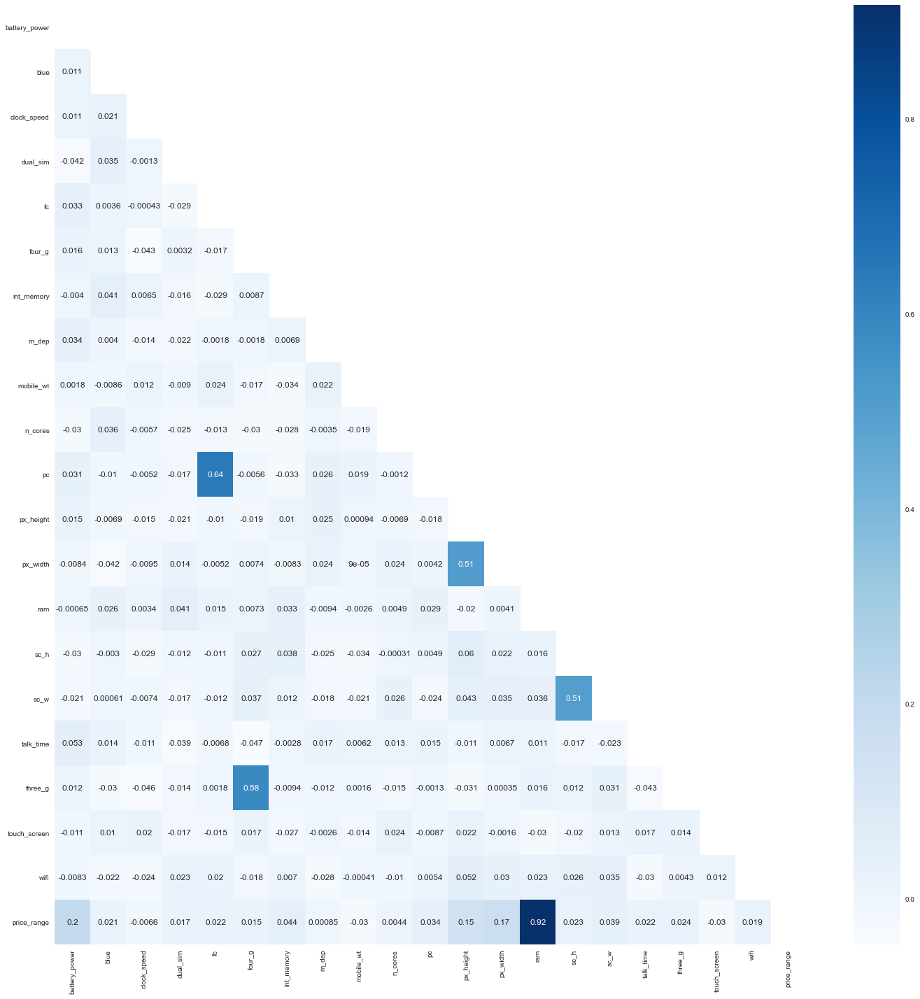

In [64]:
fig=plt.figure(figsize=(20,20))
corr = data.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)]=True
sns.heatmap(data.corr(), annot = True, mask=mask,cmap = "Blues").figure.tight_layout()

In [65]:
#On basis of feature importancee
model=ExtraTreesClassifier()
model.fit(a,b)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100,
                     n_jobs=None, oob_score=False, random_state=None, verbose=0,
                     warm_start=False)

In [66]:
model.feature_importances_

array([0.06088886, 0.02003665, 0.03349525, 0.01992447, 0.03193007,
       0.01831681, 0.03510104, 0.03368366, 0.03728626, 0.03417265,
       0.0337705 , 0.04559641, 0.049839  , 0.38908339, 0.03449126,
       0.03480642, 0.03470561, 0.01440531, 0.01860255, 0.01986382])

In [67]:
#2. using ExtraTreesClassifier on basis of feature importance
feat_importances=pd.Series(model.feature_importances_,index=a.columns)

In [68]:
feat_importances.nlargest(20).iplot(kind='scatter',
                 title='On basis of ExtraTreesClassifier Visualize feature importance')

In the graph above, we can see 5 or 6 features gives higher train accuracies.

### These are the features has high correclationa "battery_power,int_memory,px_height,px_width,mobile_wt,ram"

# Again we perform modeling with selected features and check all value

In [69]:
X_features=data3[["battery_power","int_memory","px_height","px_width","mobile_wt","ram"]]

In [70]:
X_features.head()

,battery_power,int_memory,px_height,px_width,mobile_wt,ram
0,-0.902597,-1.380644,-1.408949,-1.146784,1.349249,0.391703
1,-0.495139,1.155024,0.585778,1.704465,-0.120059,0.467317
2,-1.537686,0.493546,1.392684,1.074968,0.134244,0.441498
3,-1.419319,-1.215274,1.286750,1.236971,-0.261339,0.594569
4,1.325906,0.658915,1.268718,-0.091452,0.021220,-0.657666


In [71]:
X=X_features
Y=target

In [72]:
X_train, X_test, Y_train, Y_test=train_test_split(X,Y, test_size=0.2, random_state=42)

In [73]:
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((1600, 6), (400, 6), (1600,), (400,))

# Visualization for Training model (With Selected Features)
## Cross validation test for Accuracy score and Mean square error¶

In [74]:
AccuracyScoreFeaturesSelection = {'Accuracy':{},'Mean':{},'std':{}}
mse_results_Features_Selection = {'MSE':{},'Mean':{},'std':{}}
n_folds = 5
kfold = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(X_train)

for name in models:
    model = models[name]
    Accuracy = cross_val_score(model, X_train, Y_train, scoring='accuracy', cv=kfold)   #Accuracy
    mse = np.sqrt(-cross_val_score(model,X_train , Y_train, cv=kfold,        #MSE
                                   scoring='neg_mean_squared_error'))
    
    #save the R-Squared reults
    AccuracyScoreFeaturesSelection['Accuracy'][name] = Accuracy
    AccuracyScoreFeaturesSelection['Mean'][name] = Accuracy.mean()
    AccuracyScoreFeaturesSelection['std'][name] = Accuracy.std()
    
    #save the RMSE reults
    mse_results_Features_Selection['MSE'][name] = mse
    mse_results_Features_Selection['Mean'][name] = mse.mean()
    mse_results_Features_Selection['std'][name] = mse.std()

Learning rate set to 0.080129
0:	learn: 1.2819392	total: 14.6ms	remaining: 14.6s
1:	learn: 1.2046877	total: 24.7ms	remaining: 12.3s
2:	learn: 1.1145070	total: 40.5ms	remaining: 13.5s
3:	learn: 1.0473473	total: 54.1ms	remaining: 13.5s
4:	learn: 0.9860199	total: 65.1ms	remaining: 13s
5:	learn: 0.9294699	total: 82.8ms	remaining: 13.7s
6:	learn: 0.8761281	total: 95.7ms	remaining: 13.6s
7:	learn: 0.8318018	total: 107ms	remaining: 13.2s
8:	learn: 0.7880431	total: 123ms	remaining: 13.6s
9:	learn: 0.7494177	total: 134ms	remaining: 13.3s
10:	learn: 0.7175689	total: 145ms	remaining: 13.1s
11:	learn: 0.6831781	total: 166ms	remaining: 13.6s
12:	learn: 0.6541279	total: 176ms	remaining: 13.4s
13:	learn: 0.6287627	total: 193ms	remaining: 13.6s
14:	learn: 0.6020984	total: 207ms	remaining: 13.6s
15:	learn: 0.5825402	total: 218ms	remaining: 13.4s
16:	learn: 0.5630736	total: 236ms	remaining: 13.6s
17:	learn: 0.5434181	total: 249ms	remaining: 13.6s
18:	learn: 0.5264985	total: 260ms	remaining: 13.4s
19:	le

164:	learn: 0.1211486	total: 3.81s	remaining: 19.3s
165:	learn: 0.1207214	total: 3.82s	remaining: 19.2s
166:	learn: 0.1203030	total: 3.85s	remaining: 19.2s
167:	learn: 0.1199567	total: 3.86s	remaining: 19.1s
168:	learn: 0.1195438	total: 3.88s	remaining: 19.1s
169:	learn: 0.1188495	total: 3.9s	remaining: 19s
170:	learn: 0.1184339	total: 3.92s	remaining: 19s
171:	learn: 0.1179087	total: 3.94s	remaining: 19s
172:	learn: 0.1171349	total: 3.97s	remaining: 19s
173:	learn: 0.1167295	total: 4.02s	remaining: 19.1s
174:	learn: 0.1164417	total: 4.05s	remaining: 19.1s
175:	learn: 0.1159249	total: 4.09s	remaining: 19.1s
176:	learn: 0.1155082	total: 4.1s	remaining: 19.1s
177:	learn: 0.1149777	total: 4.12s	remaining: 19s
178:	learn: 0.1145507	total: 4.13s	remaining: 19s
179:	learn: 0.1142030	total: 4.16s	remaining: 18.9s
180:	learn: 0.1134243	total: 4.17s	remaining: 18.9s
181:	learn: 0.1130497	total: 4.19s	remaining: 18.8s
182:	learn: 0.1126968	total: 4.21s	remaining: 18.8s
183:	learn: 0.1124530	tota

327:	learn: 0.0705305	total: 6.91s	remaining: 14.2s
328:	learn: 0.0703108	total: 6.94s	remaining: 14.2s
329:	learn: 0.0702105	total: 6.96s	remaining: 14.1s
330:	learn: 0.0700374	total: 6.98s	remaining: 14.1s
331:	learn: 0.0697363	total: 6.99s	remaining: 14.1s
332:	learn: 0.0695009	total: 7.02s	remaining: 14.1s
333:	learn: 0.0694018	total: 7.03s	remaining: 14s
334:	learn: 0.0691803	total: 7.05s	remaining: 14s
335:	learn: 0.0688334	total: 7.07s	remaining: 14s
336:	learn: 0.0686112	total: 7.08s	remaining: 13.9s
337:	learn: 0.0685324	total: 7.1s	remaining: 13.9s
338:	learn: 0.0683426	total: 7.13s	remaining: 13.9s
339:	learn: 0.0681636	total: 7.15s	remaining: 13.9s
340:	learn: 0.0679380	total: 7.17s	remaining: 13.9s
341:	learn: 0.0678561	total: 7.18s	remaining: 13.8s
342:	learn: 0.0677193	total: 7.2s	remaining: 13.8s
343:	learn: 0.0674464	total: 7.22s	remaining: 13.8s
344:	learn: 0.0673174	total: 7.24s	remaining: 13.8s
345:	learn: 0.0671717	total: 7.25s	remaining: 13.7s
346:	learn: 0.067001

491:	learn: 0.0478316	total: 10s	remaining: 10.4s
492:	learn: 0.0477228	total: 10.1s	remaining: 10.4s
493:	learn: 0.0476451	total: 10.1s	remaining: 10.3s
494:	learn: 0.0475718	total: 10.1s	remaining: 10.3s
495:	learn: 0.0474448	total: 10.1s	remaining: 10.3s
496:	learn: 0.0473799	total: 10.1s	remaining: 10.3s
497:	learn: 0.0473381	total: 10.2s	remaining: 10.3s
498:	learn: 0.0471732	total: 10.2s	remaining: 10.2s
499:	learn: 0.0470662	total: 10.2s	remaining: 10.2s
500:	learn: 0.0469672	total: 10.2s	remaining: 10.2s
501:	learn: 0.0469030	total: 10.3s	remaining: 10.2s
502:	learn: 0.0467911	total: 10.3s	remaining: 10.2s
503:	learn: 0.0466027	total: 10.3s	remaining: 10.1s
504:	learn: 0.0465614	total: 10.3s	remaining: 10.1s
505:	learn: 0.0464853	total: 10.3s	remaining: 10.1s
506:	learn: 0.0463501	total: 10.4s	remaining: 10.1s
507:	learn: 0.0462638	total: 10.4s	remaining: 10.1s
508:	learn: 0.0461127	total: 10.4s	remaining: 10s
509:	learn: 0.0460728	total: 10.4s	remaining: 10s
510:	learn: 0.0459

658:	learn: 0.0352648	total: 13.4s	remaining: 6.93s
659:	learn: 0.0352274	total: 13.5s	remaining: 6.94s
660:	learn: 0.0351805	total: 13.5s	remaining: 6.94s
661:	learn: 0.0351078	total: 13.6s	remaining: 6.94s
662:	learn: 0.0350561	total: 13.6s	remaining: 6.93s
663:	learn: 0.0349794	total: 13.7s	remaining: 6.92s
664:	learn: 0.0349319	total: 13.7s	remaining: 6.89s
665:	learn: 0.0348862	total: 13.7s	remaining: 6.87s
666:	learn: 0.0348008	total: 13.7s	remaining: 6.85s
667:	learn: 0.0347118	total: 13.7s	remaining: 6.82s
668:	learn: 0.0346681	total: 13.7s	remaining: 6.8s
669:	learn: 0.0345880	total: 13.8s	remaining: 6.78s
670:	learn: 0.0345613	total: 13.8s	remaining: 6.75s
671:	learn: 0.0345238	total: 13.8s	remaining: 6.73s
672:	learn: 0.0344777	total: 13.8s	remaining: 6.71s
673:	learn: 0.0344235	total: 13.8s	remaining: 6.69s
674:	learn: 0.0343603	total: 13.8s	remaining: 6.67s
675:	learn: 0.0342811	total: 13.9s	remaining: 6.65s
676:	learn: 0.0342277	total: 13.9s	remaining: 6.62s
677:	learn: 0

826:	learn: 0.0268402	total: 16.5s	remaining: 3.45s
827:	learn: 0.0267974	total: 16.5s	remaining: 3.43s
828:	learn: 0.0267607	total: 16.5s	remaining: 3.41s
829:	learn: 0.0267132	total: 16.5s	remaining: 3.39s
830:	learn: 0.0266745	total: 16.6s	remaining: 3.37s
831:	learn: 0.0266229	total: 16.6s	remaining: 3.35s
832:	learn: 0.0265917	total: 16.6s	remaining: 3.33s
833:	learn: 0.0265560	total: 16.6s	remaining: 3.31s
834:	learn: 0.0265173	total: 16.6s	remaining: 3.29s
835:	learn: 0.0264743	total: 16.7s	remaining: 3.27s
836:	learn: 0.0264235	total: 16.7s	remaining: 3.25s
837:	learn: 0.0263839	total: 16.7s	remaining: 3.23s
838:	learn: 0.0263431	total: 16.7s	remaining: 3.21s
839:	learn: 0.0263159	total: 16.7s	remaining: 3.19s
840:	learn: 0.0262788	total: 16.8s	remaining: 3.17s
841:	learn: 0.0262148	total: 16.8s	remaining: 3.15s
842:	learn: 0.0262020	total: 16.8s	remaining: 3.13s
843:	learn: 0.0261755	total: 16.8s	remaining: 3.1s
844:	learn: 0.0261408	total: 16.8s	remaining: 3.08s
845:	learn: 0

994:	learn: 0.0214192	total: 19.6s	remaining: 98.6ms
995:	learn: 0.0213728	total: 19.6s	remaining: 78.9ms
996:	learn: 0.0213503	total: 19.7s	remaining: 59.1ms
997:	learn: 0.0213313	total: 19.7s	remaining: 39.4ms
998:	learn: 0.0213030	total: 19.7s	remaining: 19.7ms
999:	learn: 0.0212807	total: 19.7s	remaining: 0us
Learning rate set to 0.080129
0:	learn: 1.2808481	total: 15.3ms	remaining: 15.3s
1:	learn: 1.2018094	total: 25.3ms	remaining: 12.6s
2:	learn: 1.1131153	total: 35.3ms	remaining: 11.7s
3:	learn: 1.0336408	total: 50.7ms	remaining: 12.6s
4:	learn: 0.9697072	total: 60.9ms	remaining: 12.1s
5:	learn: 0.9192788	total: 70.1ms	remaining: 11.6s
6:	learn: 0.8713167	total: 91.9ms	remaining: 13s
7:	learn: 0.8351882	total: 104ms	remaining: 12.9s
8:	learn: 0.7962617	total: 121ms	remaining: 13.3s
9:	learn: 0.7595458	total: 133ms	remaining: 13.2s
10:	learn: 0.7289228	total: 144ms	remaining: 13s
11:	learn: 0.6925380	total: 163ms	remaining: 13.4s
12:	learn: 0.6650983	total: 175ms	remaining: 13.3s

164:	learn: 0.1294328	total: 2.8s	remaining: 14.2s
165:	learn: 0.1292570	total: 2.82s	remaining: 14.2s
166:	learn: 0.1287777	total: 2.84s	remaining: 14.2s
167:	learn: 0.1279861	total: 2.87s	remaining: 14.2s
168:	learn: 0.1276692	total: 2.88s	remaining: 14.2s
169:	learn: 0.1269320	total: 2.9s	remaining: 14.2s
170:	learn: 0.1262851	total: 2.91s	remaining: 14.1s
171:	learn: 0.1259304	total: 2.92s	remaining: 14.1s
172:	learn: 0.1255568	total: 2.94s	remaining: 14.1s
173:	learn: 0.1250332	total: 2.95s	remaining: 14s
174:	learn: 0.1243309	total: 2.96s	remaining: 14s
175:	learn: 0.1238142	total: 2.99s	remaining: 14s
176:	learn: 0.1233458	total: 3.01s	remaining: 14s
177:	learn: 0.1230310	total: 3.03s	remaining: 14s
178:	learn: 0.1222811	total: 3.04s	remaining: 13.9s
179:	learn: 0.1219480	total: 3.06s	remaining: 14s
180:	learn: 0.1211717	total: 3.08s	remaining: 13.9s
181:	learn: 0.1204547	total: 3.1s	remaining: 13.9s
182:	learn: 0.1199971	total: 3.11s	remaining: 13.9s
183:	learn: 0.1197095	total

323:	learn: 0.0753506	total: 5.51s	remaining: 11.5s
324:	learn: 0.0749902	total: 5.53s	remaining: 11.5s
325:	learn: 0.0747448	total: 5.54s	remaining: 11.5s
326:	learn: 0.0745607	total: 5.57s	remaining: 11.5s
327:	learn: 0.0743388	total: 5.58s	remaining: 11.4s
328:	learn: 0.0741667	total: 5.59s	remaining: 11.4s
329:	learn: 0.0739863	total: 5.61s	remaining: 11.4s
330:	learn: 0.0738167	total: 5.62s	remaining: 11.4s
331:	learn: 0.0735334	total: 5.64s	remaining: 11.3s
332:	learn: 0.0733730	total: 5.65s	remaining: 11.3s
333:	learn: 0.0731717	total: 5.68s	remaining: 11.3s
334:	learn: 0.0730239	total: 5.7s	remaining: 11.3s
335:	learn: 0.0727743	total: 5.73s	remaining: 11.3s
336:	learn: 0.0725703	total: 5.74s	remaining: 11.3s
337:	learn: 0.0724427	total: 5.76s	remaining: 11.3s
338:	learn: 0.0722587	total: 5.77s	remaining: 11.3s
339:	learn: 0.0721679	total: 5.78s	remaining: 11.2s
340:	learn: 0.0720404	total: 5.8s	remaining: 11.2s
341:	learn: 0.0719780	total: 5.81s	remaining: 11.2s
342:	learn: 0.

485:	learn: 0.0513146	total: 8.8s	remaining: 9.3s
486:	learn: 0.0512506	total: 8.86s	remaining: 9.33s
487:	learn: 0.0511372	total: 8.96s	remaining: 9.4s
488:	learn: 0.0510854	total: 9.04s	remaining: 9.44s
489:	learn: 0.0509405	total: 9.14s	remaining: 9.51s
490:	learn: 0.0508052	total: 9.22s	remaining: 9.56s
491:	learn: 0.0505808	total: 9.3s	remaining: 9.61s
492:	learn: 0.0505014	total: 9.38s	remaining: 9.64s
493:	learn: 0.0504028	total: 9.5s	remaining: 9.73s
494:	learn: 0.0503285	total: 9.54s	remaining: 9.73s
495:	learn: 0.0502141	total: 9.58s	remaining: 9.74s
496:	learn: 0.0501595	total: 9.64s	remaining: 9.76s
497:	learn: 0.0500755	total: 9.69s	remaining: 9.77s
498:	learn: 0.0500314	total: 9.74s	remaining: 9.78s
499:	learn: 0.0499665	total: 9.8s	remaining: 9.8s
500:	learn: 0.0497811	total: 9.84s	remaining: 9.8s
501:	learn: 0.0496932	total: 9.88s	remaining: 9.8s
502:	learn: 0.0495882	total: 9.93s	remaining: 9.81s
503:	learn: 0.0494860	total: 9.97s	remaining: 9.81s
504:	learn: 0.0493993

644:	learn: 0.0379000	total: 13.9s	remaining: 7.63s
645:	learn: 0.0378429	total: 13.9s	remaining: 7.61s
646:	learn: 0.0377925	total: 13.9s	remaining: 7.6s
647:	learn: 0.0377467	total: 13.9s	remaining: 7.57s
648:	learn: 0.0376907	total: 14s	remaining: 7.55s
649:	learn: 0.0376026	total: 14s	remaining: 7.53s
650:	learn: 0.0375478	total: 14s	remaining: 7.51s
651:	learn: 0.0374849	total: 14s	remaining: 7.49s
652:	learn: 0.0374458	total: 14.1s	remaining: 7.48s
653:	learn: 0.0373959	total: 14.1s	remaining: 7.47s
654:	learn: 0.0373513	total: 14.1s	remaining: 7.45s
655:	learn: 0.0372776	total: 14.2s	remaining: 7.42s
656:	learn: 0.0372454	total: 14.2s	remaining: 7.4s
657:	learn: 0.0372009	total: 14.2s	remaining: 7.38s
658:	learn: 0.0371242	total: 14.2s	remaining: 7.36s
659:	learn: 0.0370519	total: 14.3s	remaining: 7.34s
660:	learn: 0.0369670	total: 14.3s	remaining: 7.32s
661:	learn: 0.0369236	total: 14.3s	remaining: 7.3s
662:	learn: 0.0368617	total: 14.3s	remaining: 7.28s
663:	learn: 0.0368046	t

804:	learn: 0.0295158	total: 17s	remaining: 4.11s
805:	learn: 0.0294637	total: 17s	remaining: 4.09s
806:	learn: 0.0294256	total: 17s	remaining: 4.07s
807:	learn: 0.0293663	total: 17s	remaining: 4.05s
808:	learn: 0.0293303	total: 17.1s	remaining: 4.03s
809:	learn: 0.0293004	total: 17.1s	remaining: 4s
810:	learn: 0.0292502	total: 17.1s	remaining: 3.98s
811:	learn: 0.0292190	total: 17.1s	remaining: 3.96s
812:	learn: 0.0291917	total: 17.1s	remaining: 3.94s
813:	learn: 0.0291433	total: 17.1s	remaining: 3.92s
814:	learn: 0.0290926	total: 17.2s	remaining: 3.9s
815:	learn: 0.0290323	total: 17.2s	remaining: 3.87s
816:	learn: 0.0290058	total: 17.2s	remaining: 3.85s
817:	learn: 0.0289781	total: 17.2s	remaining: 3.83s
818:	learn: 0.0289563	total: 17.2s	remaining: 3.81s
819:	learn: 0.0289124	total: 17.3s	remaining: 3.79s
820:	learn: 0.0288934	total: 17.3s	remaining: 3.76s
821:	learn: 0.0287755	total: 17.3s	remaining: 3.74s
822:	learn: 0.0287566	total: 17.3s	remaining: 3.72s
823:	learn: 0.0287210	to

970:	learn: 0.0238376	total: 19.9s	remaining: 595ms
971:	learn: 0.0237883	total: 19.9s	remaining: 574ms
972:	learn: 0.0237724	total: 20s	remaining: 554ms
973:	learn: 0.0237453	total: 20s	remaining: 533ms
974:	learn: 0.0237051	total: 20s	remaining: 513ms
975:	learn: 0.0236842	total: 20s	remaining: 492ms
976:	learn: 0.0236650	total: 20s	remaining: 471ms
977:	learn: 0.0236479	total: 20s	remaining: 451ms
978:	learn: 0.0236198	total: 20.1s	remaining: 430ms
979:	learn: 0.0235832	total: 20.1s	remaining: 410ms
980:	learn: 0.0235502	total: 20.1s	remaining: 389ms
981:	learn: 0.0235327	total: 20.1s	remaining: 369ms
982:	learn: 0.0235140	total: 20.1s	remaining: 348ms
983:	learn: 0.0234882	total: 20.1s	remaining: 328ms
984:	learn: 0.0233853	total: 20.2s	remaining: 307ms
985:	learn: 0.0233762	total: 20.2s	remaining: 286ms
986:	learn: 0.0233340	total: 20.2s	remaining: 266ms
987:	learn: 0.0233163	total: 20.2s	remaining: 246ms
988:	learn: 0.0232750	total: 20.2s	remaining: 225ms
989:	learn: 0.0232408	to

136:	learn: 0.1416263	total: 2.83s	remaining: 17.8s
137:	learn: 0.1405433	total: 2.85s	remaining: 17.8s
138:	learn: 0.1394476	total: 2.88s	remaining: 17.9s
139:	learn: 0.1392403	total: 2.9s	remaining: 17.8s
140:	learn: 0.1385466	total: 2.92s	remaining: 17.8s
141:	learn: 0.1375960	total: 2.94s	remaining: 17.8s
142:	learn: 0.1372646	total: 2.97s	remaining: 17.8s
143:	learn: 0.1362031	total: 3s	remaining: 17.9s
144:	learn: 0.1355558	total: 3.03s	remaining: 17.9s
145:	learn: 0.1345288	total: 3.06s	remaining: 17.9s
146:	learn: 0.1339329	total: 3.08s	remaining: 17.9s
147:	learn: 0.1334428	total: 3.11s	remaining: 17.9s
148:	learn: 0.1322335	total: 3.13s	remaining: 17.9s
149:	learn: 0.1318741	total: 3.15s	remaining: 17.9s
150:	learn: 0.1310939	total: 3.17s	remaining: 17.8s
151:	learn: 0.1304946	total: 3.2s	remaining: 17.9s
152:	learn: 0.1298700	total: 3.23s	remaining: 17.9s
153:	learn: 0.1292476	total: 3.24s	remaining: 17.8s
154:	learn: 0.1289207	total: 3.27s	remaining: 17.8s
155:	learn: 0.128

295:	learn: 0.0780328	total: 6.61s	remaining: 15.7s
296:	learn: 0.0777420	total: 6.63s	remaining: 15.7s
297:	learn: 0.0773137	total: 6.65s	remaining: 15.7s
298:	learn: 0.0770655	total: 6.67s	remaining: 15.7s
299:	learn: 0.0767960	total: 6.71s	remaining: 15.7s
300:	learn: 0.0764546	total: 6.73s	remaining: 15.6s
301:	learn: 0.0763456	total: 6.77s	remaining: 15.6s
302:	learn: 0.0761449	total: 6.79s	remaining: 15.6s
303:	learn: 0.0759032	total: 6.82s	remaining: 15.6s
304:	learn: 0.0757625	total: 6.88s	remaining: 15.7s
305:	learn: 0.0755436	total: 6.91s	remaining: 15.7s
306:	learn: 0.0753503	total: 6.93s	remaining: 15.6s
307:	learn: 0.0752329	total: 6.95s	remaining: 15.6s
308:	learn: 0.0750629	total: 6.97s	remaining: 15.6s
309:	learn: 0.0748745	total: 6.99s	remaining: 15.6s
310:	learn: 0.0746073	total: 7.02s	remaining: 15.5s
311:	learn: 0.0744597	total: 7.05s	remaining: 15.5s
312:	learn: 0.0742134	total: 7.08s	remaining: 15.5s
313:	learn: 0.0740250	total: 7.12s	remaining: 15.5s
314:	learn: 

454:	learn: 0.0523139	total: 13s	remaining: 15.6s
455:	learn: 0.0521979	total: 13.1s	remaining: 15.6s
456:	learn: 0.0520827	total: 13.1s	remaining: 15.5s
457:	learn: 0.0519270	total: 13.1s	remaining: 15.5s
458:	learn: 0.0516707	total: 13.1s	remaining: 15.5s
459:	learn: 0.0514922	total: 13.2s	remaining: 15.4s
460:	learn: 0.0513828	total: 13.2s	remaining: 15.4s
461:	learn: 0.0512929	total: 13.2s	remaining: 15.4s
462:	learn: 0.0512201	total: 13.3s	remaining: 15.4s
463:	learn: 0.0511615	total: 13.3s	remaining: 15.4s
464:	learn: 0.0510661	total: 13.3s	remaining: 15.3s
465:	learn: 0.0509962	total: 13.4s	remaining: 15.3s
466:	learn: 0.0508643	total: 13.4s	remaining: 15.3s
467:	learn: 0.0507233	total: 13.4s	remaining: 15.2s
468:	learn: 0.0506052	total: 13.4s	remaining: 15.2s
469:	learn: 0.0505076	total: 13.5s	remaining: 15.2s
470:	learn: 0.0504336	total: 13.5s	remaining: 15.2s
471:	learn: 0.0503524	total: 13.5s	remaining: 15.2s
472:	learn: 0.0501367	total: 13.6s	remaining: 15.1s
473:	learn: 0.

614:	learn: 0.0380889	total: 17s	remaining: 10.7s
615:	learn: 0.0379956	total: 17s	remaining: 10.6s
616:	learn: 0.0378876	total: 17.1s	remaining: 10.6s
617:	learn: 0.0378229	total: 17.1s	remaining: 10.5s
618:	learn: 0.0377290	total: 17.1s	remaining: 10.5s
619:	learn: 0.0376761	total: 17.1s	remaining: 10.5s
620:	learn: 0.0375569	total: 17.1s	remaining: 10.4s
621:	learn: 0.0374788	total: 17.1s	remaining: 10.4s
622:	learn: 0.0373248	total: 17.1s	remaining: 10.4s
623:	learn: 0.0372831	total: 17.2s	remaining: 10.3s
624:	learn: 0.0372708	total: 17.2s	remaining: 10.3s
625:	learn: 0.0371594	total: 17.2s	remaining: 10.3s
626:	learn: 0.0371228	total: 17.2s	remaining: 10.3s
627:	learn: 0.0370946	total: 17.3s	remaining: 10.2s
628:	learn: 0.0370412	total: 17.3s	remaining: 10.2s
629:	learn: 0.0369824	total: 17.3s	remaining: 10.2s
630:	learn: 0.0369157	total: 17.3s	remaining: 10.1s
631:	learn: 0.0368516	total: 17.4s	remaining: 10.1s
632:	learn: 0.0367830	total: 17.4s	remaining: 10.1s
633:	learn: 0.03

774:	learn: 0.0291451	total: 20.9s	remaining: 6.08s
775:	learn: 0.0291152	total: 21s	remaining: 6.05s
776:	learn: 0.0290526	total: 21s	remaining: 6.02s
777:	learn: 0.0290234	total: 21s	remaining: 5.99s
778:	learn: 0.0289677	total: 21s	remaining: 5.97s
779:	learn: 0.0289411	total: 21s	remaining: 5.93s
780:	learn: 0.0288860	total: 21.1s	remaining: 5.91s
781:	learn: 0.0288555	total: 21.1s	remaining: 5.88s
782:	learn: 0.0288308	total: 21.1s	remaining: 5.85s
783:	learn: 0.0287950	total: 21.1s	remaining: 5.82s
784:	learn: 0.0287597	total: 21.2s	remaining: 5.8s
785:	learn: 0.0287448	total: 21.2s	remaining: 5.77s
786:	learn: 0.0286974	total: 21.2s	remaining: 5.74s
787:	learn: 0.0286571	total: 21.2s	remaining: 5.71s
788:	learn: 0.0286055	total: 21.2s	remaining: 5.68s
789:	learn: 0.0285866	total: 21.3s	remaining: 5.65s
790:	learn: 0.0284931	total: 21.3s	remaining: 5.62s
791:	learn: 0.0284310	total: 21.3s	remaining: 5.59s
792:	learn: 0.0284041	total: 21.3s	remaining: 5.57s
793:	learn: 0.0283720	t

936:	learn: 0.0231586	total: 24.2s	remaining: 1.63s
937:	learn: 0.0231339	total: 24.2s	remaining: 1.6s
938:	learn: 0.0231036	total: 24.3s	remaining: 1.57s
939:	learn: 0.0230900	total: 24.3s	remaining: 1.55s
940:	learn: 0.0230523	total: 24.3s	remaining: 1.52s
941:	learn: 0.0230151	total: 24.3s	remaining: 1.5s
942:	learn: 0.0229927	total: 24.3s	remaining: 1.47s
943:	learn: 0.0229751	total: 24.3s	remaining: 1.44s
944:	learn: 0.0229552	total: 24.4s	remaining: 1.42s
945:	learn: 0.0229375	total: 24.4s	remaining: 1.39s
946:	learn: 0.0228939	total: 24.4s	remaining: 1.37s
947:	learn: 0.0228720	total: 24.4s	remaining: 1.34s
948:	learn: 0.0228566	total: 24.4s	remaining: 1.31s
949:	learn: 0.0228186	total: 24.5s	remaining: 1.29s
950:	learn: 0.0227906	total: 24.5s	remaining: 1.26s
951:	learn: 0.0227743	total: 24.5s	remaining: 1.24s
952:	learn: 0.0227246	total: 24.5s	remaining: 1.21s
953:	learn: 0.0226980	total: 24.5s	remaining: 1.18s
954:	learn: 0.0226629	total: 24.5s	remaining: 1.16s
955:	learn: 0.

102:	learn: 0.1738890	total: 2.06s	remaining: 17.9s
103:	learn: 0.1725743	total: 2.08s	remaining: 17.9s
104:	learn: 0.1713034	total: 2.12s	remaining: 18.1s
105:	learn: 0.1699817	total: 2.13s	remaining: 18s
106:	learn: 0.1683767	total: 2.16s	remaining: 18s
107:	learn: 0.1677996	total: 2.17s	remaining: 17.9s
108:	learn: 0.1662564	total: 2.18s	remaining: 17.9s
109:	learn: 0.1654863	total: 2.21s	remaining: 17.9s
110:	learn: 0.1645634	total: 2.22s	remaining: 17.8s
111:	learn: 0.1633899	total: 2.25s	remaining: 17.8s
112:	learn: 0.1621996	total: 2.26s	remaining: 17.7s
113:	learn: 0.1611978	total: 2.29s	remaining: 17.8s
114:	learn: 0.1603876	total: 2.3s	remaining: 17.7s
115:	learn: 0.1597658	total: 2.32s	remaining: 17.7s
116:	learn: 0.1591482	total: 2.33s	remaining: 17.6s
117:	learn: 0.1577962	total: 2.36s	remaining: 17.6s
118:	learn: 0.1567097	total: 2.37s	remaining: 17.6s
119:	learn: 0.1562009	total: 2.4s	remaining: 17.6s
120:	learn: 0.1546132	total: 2.42s	remaining: 17.6s
121:	learn: 0.1537

266:	learn: 0.0848731	total: 5.68s	remaining: 15.6s
267:	learn: 0.0845113	total: 5.71s	remaining: 15.6s
268:	learn: 0.0843003	total: 5.74s	remaining: 15.6s
269:	learn: 0.0840155	total: 5.75s	remaining: 15.5s
270:	learn: 0.0837765	total: 5.78s	remaining: 15.5s
271:	learn: 0.0835646	total: 5.79s	remaining: 15.5s
272:	learn: 0.0833231	total: 5.81s	remaining: 15.5s
273:	learn: 0.0827324	total: 5.82s	remaining: 15.4s
274:	learn: 0.0824080	total: 5.85s	remaining: 15.4s
275:	learn: 0.0819738	total: 5.86s	remaining: 15.4s
276:	learn: 0.0816856	total: 5.89s	remaining: 15.4s
277:	learn: 0.0814982	total: 5.9s	remaining: 15.3s
278:	learn: 0.0814188	total: 5.93s	remaining: 15.3s
279:	learn: 0.0812349	total: 5.94s	remaining: 15.3s
280:	learn: 0.0810120	total: 5.95s	remaining: 15.2s
281:	learn: 0.0808313	total: 5.97s	remaining: 15.2s
282:	learn: 0.0806437	total: 5.99s	remaining: 15.2s
283:	learn: 0.0804477	total: 6.01s	remaining: 15.1s
284:	learn: 0.0803542	total: 6.02s	remaining: 15.1s
285:	learn: 0

434:	learn: 0.0551296	total: 8.99s	remaining: 11.7s
435:	learn: 0.0550062	total: 9.02s	remaining: 11.7s
436:	learn: 0.0549530	total: 9.04s	remaining: 11.6s
437:	learn: 0.0547670	total: 9.06s	remaining: 11.6s
438:	learn: 0.0546180	total: 9.09s	remaining: 11.6s
439:	learn: 0.0544769	total: 9.1s	remaining: 11.6s
440:	learn: 0.0543083	total: 9.12s	remaining: 11.6s
441:	learn: 0.0542112	total: 9.14s	remaining: 11.5s
442:	learn: 0.0541407	total: 9.16s	remaining: 11.5s
443:	learn: 0.0540369	total: 9.19s	remaining: 11.5s
444:	learn: 0.0539175	total: 9.22s	remaining: 11.5s
445:	learn: 0.0538445	total: 9.24s	remaining: 11.5s
446:	learn: 0.0536509	total: 9.26s	remaining: 11.5s
447:	learn: 0.0535279	total: 9.29s	remaining: 11.4s
448:	learn: 0.0534256	total: 9.3s	remaining: 11.4s
449:	learn: 0.0533456	total: 9.32s	remaining: 11.4s
450:	learn: 0.0532510	total: 9.34s	remaining: 11.4s
451:	learn: 0.0530946	total: 9.36s	remaining: 11.3s
452:	learn: 0.0530270	total: 9.37s	remaining: 11.3s
453:	learn: 0.

597:	learn: 0.0398863	total: 12.3s	remaining: 8.29s
598:	learn: 0.0398129	total: 12.4s	remaining: 8.27s
599:	learn: 0.0397494	total: 12.4s	remaining: 8.25s
600:	learn: 0.0396358	total: 12.4s	remaining: 8.23s
601:	learn: 0.0395744	total: 12.4s	remaining: 8.21s
602:	learn: 0.0394938	total: 12.4s	remaining: 8.19s
603:	learn: 0.0394052	total: 12.4s	remaining: 8.16s
604:	learn: 0.0393677	total: 12.5s	remaining: 8.14s
605:	learn: 0.0392599	total: 12.5s	remaining: 8.12s
606:	learn: 0.0391774	total: 12.5s	remaining: 8.11s
607:	learn: 0.0390801	total: 12.5s	remaining: 8.08s
608:	learn: 0.0390470	total: 12.6s	remaining: 8.06s
609:	learn: 0.0390017	total: 12.6s	remaining: 8.04s
610:	learn: 0.0389404	total: 12.6s	remaining: 8.02s
611:	learn: 0.0388626	total: 12.6s	remaining: 7.99s
612:	learn: 0.0387957	total: 12.6s	remaining: 7.97s
613:	learn: 0.0386774	total: 12.6s	remaining: 7.94s
614:	learn: 0.0386340	total: 12.7s	remaining: 7.92s
615:	learn: 0.0385259	total: 12.7s	remaining: 7.9s
616:	learn: 0

756:	learn: 0.0306249	total: 15.7s	remaining: 5.04s
757:	learn: 0.0305554	total: 15.7s	remaining: 5.02s
758:	learn: 0.0305217	total: 15.7s	remaining: 5s
759:	learn: 0.0304640	total: 15.8s	remaining: 4.98s
760:	learn: 0.0304296	total: 15.8s	remaining: 4.96s
761:	learn: 0.0303980	total: 15.8s	remaining: 4.94s
762:	learn: 0.0303752	total: 15.8s	remaining: 4.92s
763:	learn: 0.0303423	total: 15.9s	remaining: 4.9s
764:	learn: 0.0302977	total: 15.9s	remaining: 4.88s
765:	learn: 0.0302580	total: 15.9s	remaining: 4.86s
766:	learn: 0.0301993	total: 15.9s	remaining: 4.84s
767:	learn: 0.0301762	total: 15.9s	remaining: 4.81s
768:	learn: 0.0300934	total: 16s	remaining: 4.79s
769:	learn: 0.0300704	total: 16s	remaining: 4.77s
770:	learn: 0.0300478	total: 16s	remaining: 4.75s
771:	learn: 0.0300249	total: 16s	remaining: 4.73s
772:	learn: 0.0299846	total: 16s	remaining: 4.71s
773:	learn: 0.0299515	total: 16s	remaining: 4.68s
774:	learn: 0.0299115	total: 16.1s	remaining: 4.67s
775:	learn: 0.0298664	total:

917:	learn: 0.0247650	total: 19s	remaining: 1.7s
918:	learn: 0.0247284	total: 19s	remaining: 1.68s
919:	learn: 0.0247030	total: 19s	remaining: 1.66s
920:	learn: 0.0246850	total: 19.1s	remaining: 1.64s
921:	learn: 0.0246313	total: 19.1s	remaining: 1.61s
922:	learn: 0.0246116	total: 19.1s	remaining: 1.59s
923:	learn: 0.0245929	total: 19.1s	remaining: 1.57s
924:	learn: 0.0245388	total: 19.1s	remaining: 1.55s
925:	learn: 0.0245041	total: 19.1s	remaining: 1.53s
926:	learn: 0.0244808	total: 19.2s	remaining: 1.51s
927:	learn: 0.0244577	total: 19.2s	remaining: 1.49s
928:	learn: 0.0243989	total: 19.2s	remaining: 1.47s
929:	learn: 0.0243483	total: 19.2s	remaining: 1.45s
930:	learn: 0.0243042	total: 19.3s	remaining: 1.43s
931:	learn: 0.0242854	total: 19.3s	remaining: 1.41s
932:	learn: 0.0242556	total: 19.3s	remaining: 1.39s
933:	learn: 0.0242236	total: 19.3s	remaining: 1.36s
934:	learn: 0.0241878	total: 19.3s	remaining: 1.34s
935:	learn: 0.0241435	total: 19.4s	remaining: 1.32s
936:	learn: 0.02411

84:	learn: 0.2053023	total: 1.7s	remaining: 18.3s
85:	learn: 0.2036394	total: 1.73s	remaining: 18.4s
86:	learn: 0.2025453	total: 1.76s	remaining: 18.5s
87:	learn: 0.2008155	total: 1.77s	remaining: 18.4s
88:	learn: 0.1989644	total: 1.8s	remaining: 18.4s
89:	learn: 0.1972057	total: 1.81s	remaining: 18.3s
90:	learn: 0.1959636	total: 1.83s	remaining: 18.3s
91:	learn: 0.1946227	total: 1.84s	remaining: 18.2s
92:	learn: 0.1926447	total: 1.88s	remaining: 18.3s
93:	learn: 0.1908381	total: 1.89s	remaining: 18.2s
94:	learn: 0.1895938	total: 1.92s	remaining: 18.3s
95:	learn: 0.1879816	total: 1.93s	remaining: 18.2s
96:	learn: 0.1866822	total: 1.96s	remaining: 18.2s
97:	learn: 0.1849854	total: 1.98s	remaining: 18.2s
98:	learn: 0.1831718	total: 2s	remaining: 18.2s
99:	learn: 0.1822220	total: 2.01s	remaining: 18.1s
100:	learn: 0.1814941	total: 2.03s	remaining: 18.1s
101:	learn: 0.1807203	total: 2.06s	remaining: 18.1s
102:	learn: 0.1796169	total: 2.08s	remaining: 18.1s
103:	learn: 0.1786614	total: 2.1s

244:	learn: 0.0946120	total: 5.21s	remaining: 16.1s
245:	learn: 0.0943676	total: 5.24s	remaining: 16.1s
246:	learn: 0.0938098	total: 5.26s	remaining: 16s
247:	learn: 0.0936875	total: 5.29s	remaining: 16s
248:	learn: 0.0934907	total: 5.3s	remaining: 16s
249:	learn: 0.0932554	total: 5.32s	remaining: 16s
250:	learn: 0.0930050	total: 5.33s	remaining: 15.9s
251:	learn: 0.0924878	total: 5.35s	remaining: 15.9s
252:	learn: 0.0922991	total: 5.37s	remaining: 15.8s
253:	learn: 0.0921750	total: 5.4s	remaining: 15.9s
254:	learn: 0.0919025	total: 5.43s	remaining: 15.9s
255:	learn: 0.0916706	total: 5.44s	remaining: 15.8s
256:	learn: 0.0914157	total: 5.46s	remaining: 15.8s
257:	learn: 0.0910502	total: 5.48s	remaining: 15.7s
258:	learn: 0.0908428	total: 5.49s	remaining: 15.7s
259:	learn: 0.0904171	total: 5.51s	remaining: 15.7s
260:	learn: 0.0902179	total: 5.53s	remaining: 15.7s
261:	learn: 0.0899917	total: 5.55s	remaining: 15.6s
262:	learn: 0.0897761	total: 5.57s	remaining: 15.6s
263:	learn: 0.0891843	

405:	learn: 0.0614041	total: 8.64s	remaining: 12.6s
406:	learn: 0.0612663	total: 8.68s	remaining: 12.6s
407:	learn: 0.0610316	total: 8.7s	remaining: 12.6s
408:	learn: 0.0609206	total: 8.72s	remaining: 12.6s
409:	learn: 0.0606998	total: 8.73s	remaining: 12.6s
410:	learn: 0.0605362	total: 8.75s	remaining: 12.5s
411:	learn: 0.0603290	total: 8.76s	remaining: 12.5s
412:	learn: 0.0602515	total: 8.79s	remaining: 12.5s
413:	learn: 0.0601864	total: 8.8s	remaining: 12.5s
414:	learn: 0.0600050	total: 8.81s	remaining: 12.4s
415:	learn: 0.0599278	total: 8.83s	remaining: 12.4s
416:	learn: 0.0597259	total: 8.85s	remaining: 12.4s
417:	learn: 0.0596481	total: 8.86s	remaining: 12.3s
418:	learn: 0.0595428	total: 8.87s	remaining: 12.3s
419:	learn: 0.0593702	total: 8.89s	remaining: 12.3s
420:	learn: 0.0592671	total: 8.9s	remaining: 12.2s
421:	learn: 0.0591197	total: 8.91s	remaining: 12.2s
422:	learn: 0.0590298	total: 8.93s	remaining: 12.2s
423:	learn: 0.0588835	total: 8.94s	remaining: 12.1s
424:	learn: 0.0

565:	learn: 0.0433429	total: 13.4s	remaining: 10.3s
566:	learn: 0.0432136	total: 13.4s	remaining: 10.2s
567:	learn: 0.0431401	total: 13.4s	remaining: 10.2s
568:	learn: 0.0430637	total: 13.4s	remaining: 10.2s
569:	learn: 0.0429498	total: 13.4s	remaining: 10.1s
570:	learn: 0.0428780	total: 13.5s	remaining: 10.1s
571:	learn: 0.0428386	total: 13.5s	remaining: 10.1s
572:	learn: 0.0427305	total: 13.5s	remaining: 10.1s
573:	learn: 0.0426210	total: 13.5s	remaining: 10s
574:	learn: 0.0425339	total: 13.5s	remaining: 10s
575:	learn: 0.0424678	total: 13.6s	remaining: 9.98s
576:	learn: 0.0424308	total: 13.6s	remaining: 9.95s
577:	learn: 0.0423582	total: 13.6s	remaining: 9.92s
578:	learn: 0.0422751	total: 13.6s	remaining: 9.89s
579:	learn: 0.0422378	total: 13.6s	remaining: 9.86s
580:	learn: 0.0421696	total: 13.6s	remaining: 9.83s
581:	learn: 0.0420760	total: 13.7s	remaining: 9.81s
582:	learn: 0.0419979	total: 13.7s	remaining: 9.78s
583:	learn: 0.0419226	total: 13.7s	remaining: 9.75s
584:	learn: 0.04

726:	learn: 0.0324769	total: 17.4s	remaining: 6.54s
727:	learn: 0.0324272	total: 17.5s	remaining: 6.52s
728:	learn: 0.0323610	total: 17.5s	remaining: 6.5s
729:	learn: 0.0323080	total: 17.5s	remaining: 6.47s
730:	learn: 0.0322686	total: 17.5s	remaining: 6.45s
731:	learn: 0.0322276	total: 17.6s	remaining: 6.42s
732:	learn: 0.0321990	total: 17.6s	remaining: 6.4s
733:	learn: 0.0320948	total: 17.6s	remaining: 6.37s
734:	learn: 0.0320713	total: 17.6s	remaining: 6.34s
735:	learn: 0.0320126	total: 17.6s	remaining: 6.32s
736:	learn: 0.0319783	total: 17.6s	remaining: 6.29s
737:	learn: 0.0318932	total: 17.7s	remaining: 6.27s
738:	learn: 0.0318289	total: 17.7s	remaining: 6.24s
739:	learn: 0.0317821	total: 17.7s	remaining: 6.21s
740:	learn: 0.0317450	total: 17.7s	remaining: 6.19s
741:	learn: 0.0317094	total: 17.7s	remaining: 6.16s
742:	learn: 0.0316515	total: 17.8s	remaining: 6.14s
743:	learn: 0.0316209	total: 17.8s	remaining: 6.12s
744:	learn: 0.0315644	total: 17.8s	remaining: 6.11s
745:	learn: 0.

892:	learn: 0.0255541	total: 20.9s	remaining: 2.51s
893:	learn: 0.0255065	total: 21s	remaining: 2.48s
894:	learn: 0.0254852	total: 21s	remaining: 2.46s
895:	learn: 0.0254718	total: 21s	remaining: 2.44s
896:	learn: 0.0254259	total: 21s	remaining: 2.42s
897:	learn: 0.0253668	total: 21.1s	remaining: 2.39s
898:	learn: 0.0253606	total: 21.1s	remaining: 2.37s
899:	learn: 0.0253411	total: 21.1s	remaining: 2.35s
900:	learn: 0.0253154	total: 21.1s	remaining: 2.32s
901:	learn: 0.0252953	total: 21.1s	remaining: 2.3s
902:	learn: 0.0252257	total: 21.2s	remaining: 2.27s
903:	learn: 0.0252105	total: 21.2s	remaining: 2.25s
904:	learn: 0.0251685	total: 21.2s	remaining: 2.23s
905:	learn: 0.0251361	total: 21.2s	remaining: 2.2s
906:	learn: 0.0251111	total: 21.3s	remaining: 2.18s
907:	learn: 0.0250803	total: 21.3s	remaining: 2.16s
908:	learn: 0.0250462	total: 21.3s	remaining: 2.13s
909:	learn: 0.0250081	total: 21.3s	remaining: 2.11s
910:	learn: 0.0249543	total: 21.3s	remaining: 2.08s
911:	learn: 0.0249150	

52:	learn: 0.2614344	total: 894ms	remaining: 16s
53:	learn: 0.2581209	total: 918ms	remaining: 16.1s
54:	learn: 0.2558334	total: 933ms	remaining: 16s
55:	learn: 0.2544027	total: 958ms	remaining: 16.1s
56:	learn: 0.2520037	total: 969ms	remaining: 16s
57:	learn: 0.2493871	total: 990ms	remaining: 16.1s
58:	learn: 0.2472721	total: 1s	remaining: 16s
59:	learn: 0.2449648	total: 1.02s	remaining: 16s
60:	learn: 0.2429151	total: 1.03s	remaining: 15.9s
61:	learn: 0.2400092	total: 1.05s	remaining: 15.9s
62:	learn: 0.2377218	total: 1.07s	remaining: 15.9s
63:	learn: 0.2350636	total: 1.08s	remaining: 15.8s
64:	learn: 0.2331155	total: 1.11s	remaining: 16s
65:	learn: 0.2311745	total: 1.13s	remaining: 16s
66:	learn: 0.2295401	total: 1.14s	remaining: 15.9s
67:	learn: 0.2274768	total: 1.16s	remaining: 15.8s
68:	learn: 0.2245133	total: 1.18s	remaining: 15.9s
69:	learn: 0.2222465	total: 1.19s	remaining: 15.8s
70:	learn: 0.2208659	total: 1.2s	remaining: 15.7s
71:	learn: 0.2186841	total: 1.22s	remaining: 15.7

217:	learn: 0.0995197	total: 3.67s	remaining: 13.2s
218:	learn: 0.0989509	total: 3.69s	remaining: 13.2s
219:	learn: 0.0985791	total: 3.71s	remaining: 13.2s
220:	learn: 0.0980648	total: 3.73s	remaining: 13.1s
221:	learn: 0.0976596	total: 3.75s	remaining: 13.1s
222:	learn: 0.0973214	total: 3.76s	remaining: 13.1s
223:	learn: 0.0970265	total: 3.78s	remaining: 13.1s
224:	learn: 0.0965817	total: 3.8s	remaining: 13.1s
225:	learn: 0.0959955	total: 3.81s	remaining: 13s
226:	learn: 0.0956424	total: 3.83s	remaining: 13s
227:	learn: 0.0953509	total: 3.85s	remaining: 13s
228:	learn: 0.0950536	total: 3.87s	remaining: 13s
229:	learn: 0.0944733	total: 3.89s	remaining: 13s
230:	learn: 0.0941200	total: 3.9s	remaining: 13s
231:	learn: 0.0939541	total: 3.92s	remaining: 13s
232:	learn: 0.0936054	total: 3.94s	remaining: 13s
233:	learn: 0.0929930	total: 3.96s	remaining: 12.9s
234:	learn: 0.0927749	total: 3.97s	remaining: 12.9s
235:	learn: 0.0926142	total: 4s	remaining: 12.9s
236:	learn: 0.0922914	total: 4.02

385:	learn: 0.0602714	total: 6.64s	remaining: 10.6s
386:	learn: 0.0600959	total: 6.65s	remaining: 10.5s
387:	learn: 0.0599896	total: 6.67s	remaining: 10.5s
388:	learn: 0.0598835	total: 6.69s	remaining: 10.5s
389:	learn: 0.0597239	total: 6.71s	remaining: 10.5s
390:	learn: 0.0595469	total: 6.72s	remaining: 10.5s
391:	learn: 0.0594081	total: 6.74s	remaining: 10.4s
392:	learn: 0.0593577	total: 6.76s	remaining: 10.4s
393:	learn: 0.0592767	total: 6.77s	remaining: 10.4s
394:	learn: 0.0591421	total: 6.79s	remaining: 10.4s
395:	learn: 0.0589481	total: 6.81s	remaining: 10.4s
396:	learn: 0.0588439	total: 6.83s	remaining: 10.4s
397:	learn: 0.0587384	total: 6.85s	remaining: 10.4s
398:	learn: 0.0586496	total: 6.87s	remaining: 10.3s
399:	learn: 0.0584349	total: 6.88s	remaining: 10.3s
400:	learn: 0.0583408	total: 6.9s	remaining: 10.3s
401:	learn: 0.0582316	total: 6.91s	remaining: 10.3s
402:	learn: 0.0580829	total: 6.93s	remaining: 10.3s
403:	learn: 0.0579970	total: 6.94s	remaining: 10.2s
404:	learn: 0

545:	learn: 0.0431848	total: 9.74s	remaining: 8.1s
546:	learn: 0.0430813	total: 9.77s	remaining: 8.09s
547:	learn: 0.0429992	total: 9.79s	remaining: 8.07s
548:	learn: 0.0429146	total: 9.81s	remaining: 8.06s
549:	learn: 0.0428362	total: 9.82s	remaining: 8.04s
550:	learn: 0.0427550	total: 9.84s	remaining: 8.02s
551:	learn: 0.0425991	total: 9.86s	remaining: 8s
552:	learn: 0.0425251	total: 9.87s	remaining: 7.98s
553:	learn: 0.0424719	total: 9.89s	remaining: 7.96s
554:	learn: 0.0423856	total: 9.9s	remaining: 7.94s
555:	learn: 0.0423164	total: 9.93s	remaining: 7.93s
556:	learn: 0.0422489	total: 9.94s	remaining: 7.91s
557:	learn: 0.0421860	total: 9.97s	remaining: 7.9s
558:	learn: 0.0421081	total: 9.98s	remaining: 7.87s
559:	learn: 0.0420595	total: 10s	remaining: 7.85s
560:	learn: 0.0419560	total: 10s	remaining: 7.83s
561:	learn: 0.0418907	total: 10s	remaining: 7.82s
562:	learn: 0.0417944	total: 10s	remaining: 7.8s
563:	learn: 0.0417330	total: 10.1s	remaining: 7.78s
564:	learn: 0.0416227	total

711:	learn: 0.0322790	total: 12.6s	remaining: 5.11s
712:	learn: 0.0322505	total: 12.7s	remaining: 5.1s
713:	learn: 0.0322056	total: 12.7s	remaining: 5.08s
714:	learn: 0.0321396	total: 12.7s	remaining: 5.07s
715:	learn: 0.0320840	total: 12.7s	remaining: 5.05s
716:	learn: 0.0320346	total: 12.7s	remaining: 5.03s
717:	learn: 0.0319829	total: 12.8s	remaining: 5.01s
718:	learn: 0.0318965	total: 12.8s	remaining: 4.99s
719:	learn: 0.0318583	total: 12.8s	remaining: 4.97s
720:	learn: 0.0317863	total: 12.8s	remaining: 4.95s
721:	learn: 0.0317384	total: 12.8s	remaining: 4.93s
722:	learn: 0.0316531	total: 12.8s	remaining: 4.92s
723:	learn: 0.0316122	total: 12.9s	remaining: 4.9s
724:	learn: 0.0315731	total: 12.9s	remaining: 4.89s
725:	learn: 0.0315290	total: 12.9s	remaining: 4.87s
726:	learn: 0.0314256	total: 12.9s	remaining: 4.86s
727:	learn: 0.0313749	total: 13s	remaining: 4.84s
728:	learn: 0.0312633	total: 13s	remaining: 4.83s
729:	learn: 0.0312002	total: 13.1s	remaining: 4.83s
730:	learn: 0.0311

881:	learn: 0.0249246	total: 15.7s	remaining: 2.1s
882:	learn: 0.0248615	total: 15.7s	remaining: 2.08s
883:	learn: 0.0248362	total: 15.7s	remaining: 2.06s
884:	learn: 0.0248000	total: 15.7s	remaining: 2.04s
885:	learn: 0.0247421	total: 15.7s	remaining: 2.02s
886:	learn: 0.0246872	total: 15.8s	remaining: 2.01s
887:	learn: 0.0246580	total: 15.8s	remaining: 1.99s
888:	learn: 0.0246287	total: 15.8s	remaining: 1.97s
889:	learn: 0.0245840	total: 15.8s	remaining: 1.95s
890:	learn: 0.0245668	total: 15.8s	remaining: 1.93s
891:	learn: 0.0245369	total: 15.8s	remaining: 1.92s
892:	learn: 0.0244731	total: 15.8s	remaining: 1.9s
893:	learn: 0.0244005	total: 15.9s	remaining: 1.88s
894:	learn: 0.0243672	total: 15.9s	remaining: 1.86s
895:	learn: 0.0243376	total: 15.9s	remaining: 1.84s
896:	learn: 0.0243092	total: 15.9s	remaining: 1.83s
897:	learn: 0.0242759	total: 15.9s	remaining: 1.81s
898:	learn: 0.0242291	total: 15.9s	remaining: 1.79s
899:	learn: 0.0242053	total: 15.9s	remaining: 1.77s
900:	learn: 0.

40:	learn: 0.3128471	total: 542ms	remaining: 12.7s
41:	learn: 0.3091302	total: 556ms	remaining: 12.7s
42:	learn: 0.3055421	total: 569ms	remaining: 12.7s
43:	learn: 0.2999455	total: 582ms	remaining: 12.6s
44:	learn: 0.2967383	total: 595ms	remaining: 12.6s
45:	learn: 0.2925700	total: 605ms	remaining: 12.5s
46:	learn: 0.2882047	total: 615ms	remaining: 12.5s
47:	learn: 0.2841890	total: 625ms	remaining: 12.4s
48:	learn: 0.2804223	total: 635ms	remaining: 12.3s
49:	learn: 0.2776219	total: 646ms	remaining: 12.3s
50:	learn: 0.2742567	total: 657ms	remaining: 12.2s
51:	learn: 0.2716194	total: 667ms	remaining: 12.2s
52:	learn: 0.2692655	total: 677ms	remaining: 12.1s
53:	learn: 0.2656185	total: 686ms	remaining: 12s
54:	learn: 0.2620659	total: 696ms	remaining: 12s
55:	learn: 0.2598698	total: 707ms	remaining: 11.9s
56:	learn: 0.2577854	total: 720ms	remaining: 11.9s
57:	learn: 0.2553011	total: 734ms	remaining: 11.9s
58:	learn: 0.2528645	total: 747ms	remaining: 11.9s
59:	learn: 0.2509181	total: 759ms	r

204:	learn: 0.1095425	total: 3.12s	remaining: 12.1s
205:	learn: 0.1089255	total: 3.15s	remaining: 12.1s
206:	learn: 0.1085364	total: 3.16s	remaining: 12.1s
207:	learn: 0.1079477	total: 3.19s	remaining: 12.2s
208:	learn: 0.1073599	total: 3.21s	remaining: 12.2s
209:	learn: 0.1068094	total: 3.23s	remaining: 12.1s
210:	learn: 0.1066645	total: 3.24s	remaining: 12.1s
211:	learn: 0.1058238	total: 3.25s	remaining: 12.1s
212:	learn: 0.1056285	total: 3.27s	remaining: 12.1s
213:	learn: 0.1050876	total: 3.28s	remaining: 12.1s
214:	learn: 0.1048257	total: 3.3s	remaining: 12.1s
215:	learn: 0.1046511	total: 3.31s	remaining: 12s
216:	learn: 0.1042970	total: 3.33s	remaining: 12s
217:	learn: 0.1039783	total: 3.36s	remaining: 12s
218:	learn: 0.1038530	total: 3.37s	remaining: 12s
219:	learn: 0.1035039	total: 3.38s	remaining: 12s
220:	learn: 0.1031785	total: 3.4s	remaining: 12s
221:	learn: 0.1029326	total: 3.41s	remaining: 12s
222:	learn: 0.1026114	total: 3.42s	remaining: 11.9s
223:	learn: 0.1023133	total:

372:	learn: 0.0662520	total: 6.07s	remaining: 10.2s
373:	learn: 0.0661098	total: 6.1s	remaining: 10.2s
374:	learn: 0.0659707	total: 6.11s	remaining: 10.2s
375:	learn: 0.0657273	total: 6.14s	remaining: 10.2s
376:	learn: 0.0656120	total: 6.15s	remaining: 10.2s
377:	learn: 0.0653951	total: 6.17s	remaining: 10.2s
378:	learn: 0.0652806	total: 6.18s	remaining: 10.1s
379:	learn: 0.0651753	total: 6.19s	remaining: 10.1s
380:	learn: 0.0650087	total: 6.21s	remaining: 10.1s
381:	learn: 0.0648899	total: 6.23s	remaining: 10.1s
382:	learn: 0.0647608	total: 6.24s	remaining: 10.1s
383:	learn: 0.0645596	total: 6.26s	remaining: 10s
384:	learn: 0.0643778	total: 6.29s	remaining: 10s
385:	learn: 0.0641677	total: 6.3s	remaining: 10s
386:	learn: 0.0639178	total: 6.31s	remaining: 10s
387:	learn: 0.0638135	total: 6.33s	remaining: 9.98s
388:	learn: 0.0637179	total: 6.34s	remaining: 9.96s
389:	learn: 0.0635854	total: 6.36s	remaining: 9.95s
390:	learn: 0.0633880	total: 6.38s	remaining: 9.93s
391:	learn: 0.0632703	

539:	learn: 0.0458911	total: 8.38s	remaining: 7.14s
540:	learn: 0.0458134	total: 8.39s	remaining: 7.12s
541:	learn: 0.0457580	total: 8.41s	remaining: 7.11s
542:	learn: 0.0456728	total: 8.42s	remaining: 7.09s
543:	learn: 0.0456179	total: 8.44s	remaining: 7.07s
544:	learn: 0.0454730	total: 8.45s	remaining: 7.05s
545:	learn: 0.0454063	total: 8.46s	remaining: 7.03s
546:	learn: 0.0453366	total: 8.47s	remaining: 7.01s
547:	learn: 0.0452794	total: 8.48s	remaining: 6.99s
548:	learn: 0.0452335	total: 8.49s	remaining: 6.97s
549:	learn: 0.0451507	total: 8.5s	remaining: 6.95s
550:	learn: 0.0449922	total: 8.51s	remaining: 6.93s
551:	learn: 0.0448486	total: 8.52s	remaining: 6.92s
552:	learn: 0.0447675	total: 8.53s	remaining: 6.89s
553:	learn: 0.0446878	total: 8.54s	remaining: 6.88s
554:	learn: 0.0446166	total: 8.55s	remaining: 6.86s
555:	learn: 0.0445409	total: 8.56s	remaining: 6.84s
556:	learn: 0.0444431	total: 8.58s	remaining: 6.82s
557:	learn: 0.0443748	total: 8.59s	remaining: 6.8s
558:	learn: 0.

705:	learn: 0.0343059	total: 10.5s	remaining: 4.38s
706:	learn: 0.0342652	total: 10.5s	remaining: 4.37s
707:	learn: 0.0342382	total: 10.6s	remaining: 4.35s
708:	learn: 0.0342070	total: 10.6s	remaining: 4.34s
709:	learn: 0.0341643	total: 10.6s	remaining: 4.32s
710:	learn: 0.0340627	total: 10.6s	remaining: 4.31s
711:	learn: 0.0340275	total: 10.6s	remaining: 4.29s
712:	learn: 0.0339966	total: 10.6s	remaining: 4.27s
713:	learn: 0.0339383	total: 10.6s	remaining: 4.26s
714:	learn: 0.0339133	total: 10.6s	remaining: 4.24s
715:	learn: 0.0338880	total: 10.7s	remaining: 4.23s
716:	learn: 0.0338064	total: 10.7s	remaining: 4.21s
717:	learn: 0.0337431	total: 10.7s	remaining: 4.19s
718:	learn: 0.0336984	total: 10.7s	remaining: 4.18s
719:	learn: 0.0336531	total: 10.7s	remaining: 4.16s
720:	learn: 0.0336039	total: 10.7s	remaining: 4.14s
721:	learn: 0.0335659	total: 10.7s	remaining: 4.13s
722:	learn: 0.0335429	total: 10.7s	remaining: 4.11s
723:	learn: 0.0335031	total: 10.8s	remaining: 4.1s
724:	learn: 0

876:	learn: 0.0267363	total: 12.7s	remaining: 1.77s
877:	learn: 0.0266906	total: 12.7s	remaining: 1.76s
878:	learn: 0.0266626	total: 12.7s	remaining: 1.75s
879:	learn: 0.0266421	total: 12.7s	remaining: 1.73s
880:	learn: 0.0265956	total: 12.7s	remaining: 1.72s
881:	learn: 0.0265495	total: 12.7s	remaining: 1.7s
882:	learn: 0.0265002	total: 12.7s	remaining: 1.69s
883:	learn: 0.0264693	total: 12.8s	remaining: 1.67s
884:	learn: 0.0264453	total: 12.8s	remaining: 1.66s
885:	learn: 0.0264194	total: 12.8s	remaining: 1.64s
886:	learn: 0.0263576	total: 12.8s	remaining: 1.63s
887:	learn: 0.0263366	total: 12.8s	remaining: 1.61s
888:	learn: 0.0263177	total: 12.8s	remaining: 1.6s
889:	learn: 0.0262975	total: 12.8s	remaining: 1.58s
890:	learn: 0.0262787	total: 12.8s	remaining: 1.57s
891:	learn: 0.0262639	total: 12.8s	remaining: 1.55s
892:	learn: 0.0262305	total: 12.9s	remaining: 1.54s
893:	learn: 0.0262059	total: 12.9s	remaining: 1.53s
894:	learn: 0.0261588	total: 12.9s	remaining: 1.51s
895:	learn: 0.

35:	learn: 0.3429617	total: 724ms	remaining: 19.4s
36:	learn: 0.3355801	total: 752ms	remaining: 19.6s
37:	learn: 0.3283537	total: 768ms	remaining: 19.4s
38:	learn: 0.3223472	total: 794ms	remaining: 19.6s
39:	learn: 0.3163952	total: 808ms	remaining: 19.4s
40:	learn: 0.3111244	total: 826ms	remaining: 19.3s
41:	learn: 0.3068208	total: 838ms	remaining: 19.1s
42:	learn: 0.3028879	total: 857ms	remaining: 19.1s
43:	learn: 0.2993287	total: 875ms	remaining: 19s
44:	learn: 0.2948529	total: 893ms	remaining: 18.9s
45:	learn: 0.2918956	total: 906ms	remaining: 18.8s
46:	learn: 0.2882316	total: 921ms	remaining: 18.7s
47:	learn: 0.2835667	total: 950ms	remaining: 18.8s
48:	learn: 0.2795272	total: 974ms	remaining: 18.9s
49:	learn: 0.2754397	total: 988ms	remaining: 18.8s
50:	learn: 0.2709286	total: 999ms	remaining: 18.6s
51:	learn: 0.2688155	total: 1.02s	remaining: 18.6s
52:	learn: 0.2664644	total: 1.03s	remaining: 18.5s
53:	learn: 0.2641962	total: 1.05s	remaining: 18.4s
54:	learn: 0.2610405	total: 1.06s

202:	learn: 0.1047999	total: 4.62s	remaining: 18.1s
203:	learn: 0.1045870	total: 4.63s	remaining: 18.1s
204:	learn: 0.1043078	total: 4.67s	remaining: 18.1s
205:	learn: 0.1040804	total: 4.69s	remaining: 18.1s
206:	learn: 0.1039548	total: 4.7s	remaining: 18s
207:	learn: 0.1035427	total: 4.72s	remaining: 18s
208:	learn: 0.1030411	total: 4.73s	remaining: 17.9s
209:	learn: 0.1026402	total: 4.75s	remaining: 17.9s
210:	learn: 0.1022773	total: 4.76s	remaining: 17.8s
211:	learn: 0.1018421	total: 4.78s	remaining: 17.8s
212:	learn: 0.1015299	total: 4.81s	remaining: 17.8s
213:	learn: 0.1012323	total: 4.82s	remaining: 17.7s
214:	learn: 0.1008109	total: 4.85s	remaining: 17.7s
215:	learn: 0.1006162	total: 4.87s	remaining: 17.7s
216:	learn: 0.1003112	total: 4.88s	remaining: 17.6s
217:	learn: 0.0998844	total: 4.9s	remaining: 17.6s
218:	learn: 0.0996994	total: 4.92s	remaining: 17.5s
219:	learn: 0.0994252	total: 4.93s	remaining: 17.5s
220:	learn: 0.0990654	total: 4.95s	remaining: 17.4s
221:	learn: 0.0987

370:	learn: 0.0633889	total: 7.67s	remaining: 13s
371:	learn: 0.0631991	total: 7.71s	remaining: 13s
372:	learn: 0.0631247	total: 7.74s	remaining: 13s
373:	learn: 0.0629263	total: 7.75s	remaining: 13s
374:	learn: 0.0626538	total: 7.77s	remaining: 12.9s
375:	learn: 0.0624981	total: 7.78s	remaining: 12.9s
376:	learn: 0.0623012	total: 7.81s	remaining: 12.9s
377:	learn: 0.0621601	total: 7.82s	remaining: 12.9s
378:	learn: 0.0620473	total: 7.86s	remaining: 12.9s
379:	learn: 0.0619202	total: 7.89s	remaining: 12.9s
380:	learn: 0.0618324	total: 7.92s	remaining: 12.9s
381:	learn: 0.0617146	total: 7.94s	remaining: 12.8s
382:	learn: 0.0615973	total: 7.96s	remaining: 12.8s
383:	learn: 0.0614107	total: 7.97s	remaining: 12.8s
384:	learn: 0.0611961	total: 8s	remaining: 12.8s
385:	learn: 0.0610388	total: 8.02s	remaining: 12.8s
386:	learn: 0.0608911	total: 8.05s	remaining: 12.8s
387:	learn: 0.0607213	total: 8.08s	remaining: 12.8s
388:	learn: 0.0605821	total: 8.11s	remaining: 12.7s
389:	learn: 0.0604605	t

530:	learn: 0.0445525	total: 10.6s	remaining: 9.35s
531:	learn: 0.0444299	total: 10.6s	remaining: 9.32s
532:	learn: 0.0443205	total: 10.6s	remaining: 9.31s
533:	learn: 0.0442319	total: 10.6s	remaining: 9.29s
534:	learn: 0.0441989	total: 10.7s	remaining: 9.27s
535:	learn: 0.0441417	total: 10.7s	remaining: 9.24s
536:	learn: 0.0440613	total: 10.7s	remaining: 9.21s
537:	learn: 0.0439864	total: 10.7s	remaining: 9.19s
538:	learn: 0.0439420	total: 10.7s	remaining: 9.17s
539:	learn: 0.0437518	total: 10.7s	remaining: 9.15s
540:	learn: 0.0437179	total: 10.8s	remaining: 9.13s
541:	learn: 0.0436284	total: 10.8s	remaining: 9.11s
542:	learn: 0.0436040	total: 10.8s	remaining: 9.09s
543:	learn: 0.0435460	total: 10.8s	remaining: 9.07s
544:	learn: 0.0434260	total: 10.8s	remaining: 9.04s
545:	learn: 0.0432954	total: 10.8s	remaining: 9.02s
546:	learn: 0.0432561	total: 10.9s	remaining: 9s
547:	learn: 0.0432335	total: 10.9s	remaining: 8.98s
548:	learn: 0.0431667	total: 10.9s	remaining: 8.95s
549:	learn: 0.0

698:	learn: 0.0329110	total: 13.7s	remaining: 5.91s
699:	learn: 0.0328504	total: 13.7s	remaining: 5.89s
700:	learn: 0.0328046	total: 13.8s	remaining: 5.87s
701:	learn: 0.0327309	total: 13.8s	remaining: 5.85s
702:	learn: 0.0326656	total: 13.8s	remaining: 5.83s
703:	learn: 0.0325895	total: 13.8s	remaining: 5.81s
704:	learn: 0.0325032	total: 13.8s	remaining: 5.79s
705:	learn: 0.0324569	total: 13.8s	remaining: 5.76s
706:	learn: 0.0323983	total: 13.9s	remaining: 5.75s
707:	learn: 0.0323487	total: 13.9s	remaining: 5.72s
708:	learn: 0.0322775	total: 13.9s	remaining: 5.71s
709:	learn: 0.0322370	total: 13.9s	remaining: 5.69s
710:	learn: 0.0321744	total: 13.9s	remaining: 5.67s
711:	learn: 0.0321303	total: 14s	remaining: 5.65s
712:	learn: 0.0320856	total: 14s	remaining: 5.63s
713:	learn: 0.0320452	total: 14s	remaining: 5.61s
714:	learn: 0.0319989	total: 14s	remaining: 5.59s
715:	learn: 0.0319784	total: 14s	remaining: 5.56s
716:	learn: 0.0319530	total: 14s	remaining: 5.54s
717:	learn: 0.0319177	to

858:	learn: 0.0257637	total: 16.7s	remaining: 2.73s
859:	learn: 0.0257354	total: 16.7s	remaining: 2.71s
860:	learn: 0.0257127	total: 16.7s	remaining: 2.69s
861:	learn: 0.0256412	total: 16.7s	remaining: 2.68s
862:	learn: 0.0256010	total: 16.7s	remaining: 2.66s
863:	learn: 0.0255643	total: 16.8s	remaining: 2.64s
864:	learn: 0.0255157	total: 16.8s	remaining: 2.62s
865:	learn: 0.0254896	total: 16.8s	remaining: 2.6s
866:	learn: 0.0254541	total: 16.8s	remaining: 2.58s
867:	learn: 0.0254350	total: 16.8s	remaining: 2.56s
868:	learn: 0.0253622	total: 16.8s	remaining: 2.54s
869:	learn: 0.0253475	total: 16.9s	remaining: 2.52s
870:	learn: 0.0252501	total: 16.9s	remaining: 2.5s
871:	learn: 0.0252099	total: 16.9s	remaining: 2.48s
872:	learn: 0.0251468	total: 16.9s	remaining: 2.46s
873:	learn: 0.0251082	total: 16.9s	remaining: 2.44s
874:	learn: 0.0250653	total: 16.9s	remaining: 2.42s
875:	learn: 0.0250219	total: 17s	remaining: 2.4s
876:	learn: 0.0249979	total: 17s	remaining: 2.38s
877:	learn: 0.02496

19:	learn: 0.5226685	total: 377ms	remaining: 18.5s
20:	learn: 0.5064415	total: 400ms	remaining: 18.6s
21:	learn: 0.4901711	total: 413ms	remaining: 18.4s
22:	learn: 0.4736838	total: 442ms	remaining: 18.8s
23:	learn: 0.4608190	total: 463ms	remaining: 18.8s
24:	learn: 0.4456433	total: 478ms	remaining: 18.6s
25:	learn: 0.4308123	total: 492ms	remaining: 18.4s
26:	learn: 0.4204177	total: 511ms	remaining: 18.4s
27:	learn: 0.4111226	total: 524ms	remaining: 18.2s
28:	learn: 0.4012132	total: 544ms	remaining: 18.2s
29:	learn: 0.3936934	total: 562ms	remaining: 18.2s
30:	learn: 0.3864304	total: 586ms	remaining: 18.3s
31:	learn: 0.3784666	total: 602ms	remaining: 18.2s
32:	learn: 0.3690571	total: 624ms	remaining: 18.3s
33:	learn: 0.3617027	total: 638ms	remaining: 18.1s
34:	learn: 0.3546086	total: 657ms	remaining: 18.1s
35:	learn: 0.3492566	total: 674ms	remaining: 18s
36:	learn: 0.3419706	total: 695ms	remaining: 18.1s
37:	learn: 0.3364082	total: 709ms	remaining: 18s
38:	learn: 0.3301961	total: 732ms	r

185:	learn: 0.1130677	total: 3.88s	remaining: 17s
186:	learn: 0.1126648	total: 3.9s	remaining: 17s
187:	learn: 0.1120746	total: 3.92s	remaining: 16.9s
188:	learn: 0.1116794	total: 3.94s	remaining: 16.9s
189:	learn: 0.1113650	total: 3.96s	remaining: 16.9s
190:	learn: 0.1108738	total: 3.98s	remaining: 16.9s
191:	learn: 0.1100610	total: 3.99s	remaining: 16.8s
192:	learn: 0.1098284	total: 4.02s	remaining: 16.8s
193:	learn: 0.1093228	total: 4.03s	remaining: 16.8s
194:	learn: 0.1087053	total: 4.06s	remaining: 16.8s
195:	learn: 0.1083322	total: 4.07s	remaining: 16.7s
196:	learn: 0.1078105	total: 4.1s	remaining: 16.7s
197:	learn: 0.1071684	total: 4.11s	remaining: 16.7s
198:	learn: 0.1067061	total: 4.13s	remaining: 16.6s
199:	learn: 0.1064820	total: 4.14s	remaining: 16.6s
200:	learn: 0.1062532	total: 4.16s	remaining: 16.5s
201:	learn: 0.1057914	total: 4.18s	remaining: 16.5s
202:	learn: 0.1053168	total: 4.2s	remaining: 16.5s
203:	learn: 0.1045414	total: 4.21s	remaining: 16.4s
204:	learn: 0.10412

344:	learn: 0.0687383	total: 6.76s	remaining: 12.8s
345:	learn: 0.0686224	total: 6.79s	remaining: 12.8s
346:	learn: 0.0685319	total: 6.81s	remaining: 12.8s
347:	learn: 0.0684338	total: 6.83s	remaining: 12.8s
348:	learn: 0.0682173	total: 6.84s	remaining: 12.8s
349:	learn: 0.0679984	total: 6.87s	remaining: 12.8s
350:	learn: 0.0678231	total: 6.89s	remaining: 12.7s
351:	learn: 0.0676253	total: 6.91s	remaining: 12.7s
352:	learn: 0.0674705	total: 6.93s	remaining: 12.7s
353:	learn: 0.0671985	total: 6.95s	remaining: 12.7s
354:	learn: 0.0669712	total: 6.96s	remaining: 12.7s
355:	learn: 0.0668768	total: 6.99s	remaining: 12.6s
356:	learn: 0.0667675	total: 7.01s	remaining: 12.6s
357:	learn: 0.0666464	total: 7.02s	remaining: 12.6s
358:	learn: 0.0663516	total: 7.03s	remaining: 12.6s
359:	learn: 0.0662496	total: 7.05s	remaining: 12.5s
360:	learn: 0.0660479	total: 7.07s	remaining: 12.5s
361:	learn: 0.0658221	total: 7.08s	remaining: 12.5s
362:	learn: 0.0657328	total: 7.1s	remaining: 12.5s
363:	learn: 0

508:	learn: 0.0474461	total: 9.81s	remaining: 9.47s
509:	learn: 0.0473777	total: 9.83s	remaining: 9.45s
510:	learn: 0.0473271	total: 9.86s	remaining: 9.44s
511:	learn: 0.0472774	total: 9.9s	remaining: 9.44s
512:	learn: 0.0471806	total: 9.91s	remaining: 9.41s
513:	learn: 0.0471001	total: 9.95s	remaining: 9.4s
514:	learn: 0.0469805	total: 9.98s	remaining: 9.4s
515:	learn: 0.0468919	total: 10s	remaining: 9.39s
516:	learn: 0.0467803	total: 10s	remaining: 9.36s
517:	learn: 0.0465678	total: 10.1s	remaining: 9.35s
518:	learn: 0.0464143	total: 10.1s	remaining: 9.33s
519:	learn: 0.0463141	total: 10.1s	remaining: 9.3s
520:	learn: 0.0461450	total: 10.1s	remaining: 9.28s
521:	learn: 0.0460592	total: 10.1s	remaining: 9.27s
522:	learn: 0.0460301	total: 10.1s	remaining: 9.24s
523:	learn: 0.0459472	total: 10.2s	remaining: 9.22s
524:	learn: 0.0458440	total: 10.2s	remaining: 9.2s
525:	learn: 0.0457706	total: 10.2s	remaining: 9.17s
526:	learn: 0.0456863	total: 10.2s	remaining: 9.17s
527:	learn: 0.0456327

673:	learn: 0.0350471	total: 13.1s	remaining: 6.32s
674:	learn: 0.0349547	total: 13.1s	remaining: 6.31s
675:	learn: 0.0349193	total: 13.1s	remaining: 6.29s
676:	learn: 0.0348894	total: 13.2s	remaining: 6.27s
677:	learn: 0.0348586	total: 13.2s	remaining: 6.26s
678:	learn: 0.0348062	total: 13.2s	remaining: 6.23s
679:	learn: 0.0347430	total: 13.2s	remaining: 6.21s
680:	learn: 0.0346920	total: 13.2s	remaining: 6.2s
681:	learn: 0.0346173	total: 13.3s	remaining: 6.18s
682:	learn: 0.0345857	total: 13.3s	remaining: 6.16s
683:	learn: 0.0345366	total: 13.3s	remaining: 6.14s
684:	learn: 0.0344760	total: 13.3s	remaining: 6.12s
685:	learn: 0.0344063	total: 13.3s	remaining: 6.1s
686:	learn: 0.0343156	total: 13.4s	remaining: 6.08s
687:	learn: 0.0342549	total: 13.4s	remaining: 6.06s
688:	learn: 0.0342004	total: 13.4s	remaining: 6.04s
689:	learn: 0.0341610	total: 13.4s	remaining: 6.02s
690:	learn: 0.0341009	total: 13.4s	remaining: 6s
691:	learn: 0.0340223	total: 13.5s	remaining: 5.99s
692:	learn: 0.033

834:	learn: 0.0275917	total: 16s	remaining: 3.17s
835:	learn: 0.0275457	total: 16.1s	remaining: 3.15s
836:	learn: 0.0275031	total: 16.1s	remaining: 3.13s
837:	learn: 0.0274501	total: 16.1s	remaining: 3.11s
838:	learn: 0.0274018	total: 16.1s	remaining: 3.09s
839:	learn: 0.0273775	total: 16.1s	remaining: 3.07s
840:	learn: 0.0273349	total: 16.1s	remaining: 3.05s
841:	learn: 0.0272867	total: 16.1s	remaining: 3.03s
842:	learn: 0.0272551	total: 16.2s	remaining: 3.01s
843:	learn: 0.0272172	total: 16.2s	remaining: 2.99s
844:	learn: 0.0271848	total: 16.2s	remaining: 2.97s
845:	learn: 0.0271250	total: 16.2s	remaining: 2.95s
846:	learn: 0.0270791	total: 16.2s	remaining: 2.93s
847:	learn: 0.0270472	total: 16.3s	remaining: 2.91s
848:	learn: 0.0270307	total: 16.3s	remaining: 2.9s
849:	learn: 0.0269921	total: 16.3s	remaining: 2.88s
850:	learn: 0.0269612	total: 16.3s	remaining: 2.86s
851:	learn: 0.0269192	total: 16.3s	remaining: 2.84s
852:	learn: 0.0268920	total: 16.4s	remaining: 2.82s
853:	learn: 0.0

Learning rate set to 0.080129
0:	learn: 1.2795256	total: 17.8ms	remaining: 17.8s
1:	learn: 1.2040294	total: 33ms	remaining: 16.5s
2:	learn: 1.1161928	total: 45.5ms	remaining: 15.1s
3:	learn: 1.0372626	total: 60ms	remaining: 14.9s
4:	learn: 0.9790102	total: 74.5ms	remaining: 14.8s
5:	learn: 0.9243519	total: 89.2ms	remaining: 14.8s
6:	learn: 0.8728912	total: 103ms	remaining: 14.7s
7:	learn: 0.8350189	total: 117ms	remaining: 14.6s
8:	learn: 0.7987593	total: 131ms	remaining: 14.4s
9:	learn: 0.7603065	total: 145ms	remaining: 14.3s
10:	learn: 0.7269161	total: 160ms	remaining: 14.4s
11:	learn: 0.6937872	total: 173ms	remaining: 14.3s
12:	learn: 0.6668079	total: 188ms	remaining: 14.3s
13:	learn: 0.6419370	total: 202ms	remaining: 14.2s
14:	learn: 0.6155470	total: 216ms	remaining: 14.2s
15:	learn: 0.5964100	total: 230ms	remaining: 14.2s
16:	learn: 0.5794787	total: 244ms	remaining: 14.1s
17:	learn: 0.5564468	total: 258ms	remaining: 14.1s
18:	learn: 0.5395931	total: 271ms	remaining: 14s
19:	learn: 

163:	learn: 0.1301809	total: 2.56s	remaining: 13s
164:	learn: 0.1297551	total: 2.57s	remaining: 13s
165:	learn: 0.1292481	total: 2.58s	remaining: 13s
166:	learn: 0.1284668	total: 2.59s	remaining: 12.9s
167:	learn: 0.1276077	total: 2.61s	remaining: 12.9s
168:	learn: 0.1270872	total: 2.62s	remaining: 12.9s
169:	learn: 0.1265281	total: 2.63s	remaining: 12.9s
170:	learn: 0.1258953	total: 2.65s	remaining: 12.8s
171:	learn: 0.1251764	total: 2.66s	remaining: 12.8s
172:	learn: 0.1248265	total: 2.67s	remaining: 12.8s
173:	learn: 0.1245441	total: 2.69s	remaining: 12.8s
174:	learn: 0.1241070	total: 2.7s	remaining: 12.7s
175:	learn: 0.1233263	total: 2.72s	remaining: 12.7s
176:	learn: 0.1230088	total: 2.73s	remaining: 12.7s
177:	learn: 0.1224372	total: 2.75s	remaining: 12.7s
178:	learn: 0.1219889	total: 2.76s	remaining: 12.7s
179:	learn: 0.1216550	total: 2.77s	remaining: 12.6s
180:	learn: 0.1211808	total: 2.79s	remaining: 12.6s
181:	learn: 0.1206584	total: 2.8s	remaining: 12.6s
182:	learn: 0.120333

327:	learn: 0.0740770	total: 7.82s	remaining: 16s
328:	learn: 0.0739424	total: 7.88s	remaining: 16.1s
329:	learn: 0.0737031	total: 7.89s	remaining: 16s
330:	learn: 0.0735669	total: 7.9s	remaining: 16s
331:	learn: 0.0733881	total: 7.92s	remaining: 15.9s
332:	learn: 0.0732102	total: 7.93s	remaining: 15.9s
333:	learn: 0.0730040	total: 7.94s	remaining: 15.8s
334:	learn: 0.0728919	total: 7.95s	remaining: 15.8s
335:	learn: 0.0728218	total: 7.97s	remaining: 15.7s
336:	learn: 0.0726537	total: 7.98s	remaining: 15.7s
337:	learn: 0.0724957	total: 7.99s	remaining: 15.7s
338:	learn: 0.0723473	total: 8.01s	remaining: 15.6s
339:	learn: 0.0721923	total: 8.02s	remaining: 15.6s
340:	learn: 0.0718904	total: 8.04s	remaining: 15.5s
341:	learn: 0.0717420	total: 8.05s	remaining: 15.5s
342:	learn: 0.0715056	total: 8.06s	remaining: 15.4s
343:	learn: 0.0712978	total: 8.07s	remaining: 15.4s
344:	learn: 0.0710674	total: 8.09s	remaining: 15.3s
345:	learn: 0.0710054	total: 8.1s	remaining: 15.3s
346:	learn: 0.070799

490:	learn: 0.0503765	total: 11s	remaining: 11.4s
491:	learn: 0.0501965	total: 11s	remaining: 11.4s
492:	learn: 0.0500934	total: 11.1s	remaining: 11.4s
493:	learn: 0.0500403	total: 11.1s	remaining: 11.3s
494:	learn: 0.0499418	total: 11.1s	remaining: 11.3s
495:	learn: 0.0498288	total: 11.1s	remaining: 11.3s
496:	learn: 0.0497935	total: 11.2s	remaining: 11.3s
497:	learn: 0.0497355	total: 11.2s	remaining: 11.3s
498:	learn: 0.0497040	total: 11.2s	remaining: 11.3s
499:	learn: 0.0495877	total: 11.2s	remaining: 11.2s
500:	learn: 0.0494502	total: 11.3s	remaining: 11.2s
501:	learn: 0.0493773	total: 11.3s	remaining: 11.2s
502:	learn: 0.0493242	total: 11.3s	remaining: 11.2s
503:	learn: 0.0492000	total: 11.3s	remaining: 11.2s
504:	learn: 0.0490948	total: 11.4s	remaining: 11.1s
505:	learn: 0.0490014	total: 11.4s	remaining: 11.1s
506:	learn: 0.0489101	total: 11.4s	remaining: 11.1s
507:	learn: 0.0488134	total: 11.4s	remaining: 11.1s
508:	learn: 0.0486897	total: 11.4s	remaining: 11s
509:	learn: 0.0486

660:	learn: 0.0364001	total: 15.2s	remaining: 7.79s
661:	learn: 0.0362975	total: 15.2s	remaining: 7.77s
662:	learn: 0.0361849	total: 15.2s	remaining: 7.75s
663:	learn: 0.0361095	total: 15.3s	remaining: 7.72s
664:	learn: 0.0360628	total: 15.3s	remaining: 7.7s
665:	learn: 0.0360216	total: 15.3s	remaining: 7.67s
666:	learn: 0.0359853	total: 15.3s	remaining: 7.64s
667:	learn: 0.0359353	total: 15.3s	remaining: 7.62s
668:	learn: 0.0358653	total: 15.3s	remaining: 7.59s
669:	learn: 0.0357875	total: 15.4s	remaining: 7.57s
670:	learn: 0.0357540	total: 15.4s	remaining: 7.55s
671:	learn: 0.0356659	total: 15.4s	remaining: 7.52s
672:	learn: 0.0356134	total: 15.4s	remaining: 7.5s
673:	learn: 0.0355330	total: 15.4s	remaining: 7.47s
674:	learn: 0.0354717	total: 15.5s	remaining: 7.44s
675:	learn: 0.0354138	total: 15.5s	remaining: 7.42s
676:	learn: 0.0353880	total: 15.5s	remaining: 7.4s
677:	learn: 0.0352990	total: 15.5s	remaining: 7.37s
678:	learn: 0.0352706	total: 15.5s	remaining: 7.35s
679:	learn: 0.0

822:	learn: 0.0281200	total: 18.3s	remaining: 3.94s
823:	learn: 0.0280728	total: 18.3s	remaining: 3.92s
824:	learn: 0.0280464	total: 18.4s	remaining: 3.89s
825:	learn: 0.0279939	total: 18.4s	remaining: 3.87s
826:	learn: 0.0279596	total: 18.4s	remaining: 3.85s
827:	learn: 0.0279053	total: 18.4s	remaining: 3.82s
828:	learn: 0.0278462	total: 18.4s	remaining: 3.8s
829:	learn: 0.0278308	total: 18.4s	remaining: 3.77s
830:	learn: 0.0277860	total: 18.4s	remaining: 3.75s
831:	learn: 0.0277523	total: 18.5s	remaining: 3.73s
832:	learn: 0.0276896	total: 18.5s	remaining: 3.7s
833:	learn: 0.0276530	total: 18.5s	remaining: 3.68s
834:	learn: 0.0276351	total: 18.5s	remaining: 3.65s
835:	learn: 0.0275870	total: 18.5s	remaining: 3.63s
836:	learn: 0.0275692	total: 18.5s	remaining: 3.61s
837:	learn: 0.0275438	total: 18.5s	remaining: 3.58s
838:	learn: 0.0275307	total: 18.5s	remaining: 3.56s
839:	learn: 0.0274958	total: 18.6s	remaining: 3.53s
840:	learn: 0.0274210	total: 18.6s	remaining: 3.51s
841:	learn: 0.

986:	learn: 0.0226690	total: 20.5s	remaining: 270ms
987:	learn: 0.0226519	total: 20.5s	remaining: 249ms
988:	learn: 0.0226055	total: 20.5s	remaining: 228ms
989:	learn: 0.0225764	total: 20.5s	remaining: 207ms
990:	learn: 0.0225603	total: 20.5s	remaining: 186ms
991:	learn: 0.0225335	total: 20.5s	remaining: 166ms
992:	learn: 0.0225107	total: 20.5s	remaining: 145ms
993:	learn: 0.0224815	total: 20.5s	remaining: 124ms
994:	learn: 0.0224562	total: 20.6s	remaining: 103ms
995:	learn: 0.0224139	total: 20.6s	remaining: 82.6ms
996:	learn: 0.0223890	total: 20.6s	remaining: 61.9ms
997:	learn: 0.0223571	total: 20.6s	remaining: 41.3ms
998:	learn: 0.0223265	total: 20.6s	remaining: 20.6ms
999:	learn: 0.0223067	total: 20.6s	remaining: 0us


In [75]:
AccuracyScoreFeaturesSelectionCV = pd.DataFrame(index=AccuracyScoreFeaturesSelection['Accuracy'].keys())

AccuracyScoreFeaturesSelectionCV['Max'] = [AccuracyScoreFeaturesSelection['Accuracy'][m].max() 
                                           for m in AccuracyScoreFeaturesSelection['Accuracy'].keys()]
    #append the max R-Squared for each model to the dataframe
AccuracyScoreFeaturesSelectionCV['Mean'] = [AccuracyScoreFeaturesSelection['Mean'][m]
                                            for m in AccuracyScoreFeaturesSelection['Mean'].keys()]
    #append the mean of all R-Squared for each model to the dataframe

AccuracyScoreFeaturesSelectionCV['Min'] = [AccuracyScoreFeaturesSelection['Accuracy'][m].min()
                                           for m in AccuracyScoreFeaturesSelection['Accuracy'].keys()]
    #append the min R-Squared for each model to the dataframe
    
AccuracyScoreFeaturesSelectionCV['std'] = [AccuracyScoreFeaturesSelection['std'][m]
                                           for m in AccuracyScoreFeaturesSelection['std'].keys()]
    #append the std of all R-Squared for each model to the dataframe

AccuracyScoreFeaturesSelectionCV = AccuracyScoreFeaturesSelectionCV.sort_values(by='Mean',ascending=False)

AccuracyScoreFeaturesSelectionCV = pd.DataFrame(index=AccuracyScoreFeaturesSelection['Accuracy'].keys())

AccuracyScoreFeaturesSelectionCV['Max'] = [AccuracyScoreFeaturesSelection['Accuracy'][m].max()
                                           for m in AccuracyScoreFeaturesSelection['Accuracy'].keys()]
    #append the max R-Squared for each model to the dataframe
AccuracyScoreFeaturesSelectionCV['Mean'] = [AccuracyScoreFeaturesSelection['Mean'][m]
                                            for m in AccuracyScoreFeaturesSelection['Mean'].keys()]
    #append the mean of all R-Squared for each model to the dataframe

AccuracyScoreFeaturesSelectionCV['Min'] = [AccuracyScoreFeaturesSelection['Accuracy'][m].min()
                                           for m in AccuracyScoreFeaturesSelection['Accuracy'].keys()]
    #append the min R-Squared for each model to the dataframe
    
AccuracyScoreFeaturesSelectionCV['std'] = [AccuracyScoreFeaturesSelection['std'][m]
                                           for m in AccuracyScoreFeaturesSelection['std'].keys()]
    #append the std of all R-Squared for each model to the dataframe

AccuracyScoreFeaturesSelectionCV = AccuracyScoreFeaturesSelectionCV.sort_values(by='Mean',ascending=False)

AccuracyScoreFeaturesSelectionCV

,Max,Mean,Min,std
Logistic,0.975000,0.966875,0.950000,0.009601
QDA,0.981250,0.961250,0.950000,0.010933
LDA,0.950000,0.946875,0.940625,0.003953
catboost,0.950000,0.936875,0.915625,0.012406
Support Vector,0.953125,0.930000,0.912500,0.014869
Xgboost,0.934375,0.913125,0.903125,0.011075
Lightgbm,0.918750,0.906875,0.893750,0.009961
Gradient Boosting,0.915625,0.901875,0.890625,0.008970
Random Forest,0.915625,0.896250,0.881250,0.012717
Decision Tree,0.862500,0.843750,0.812500,0.017343


In [76]:
AccuracyScoreFeaturesSelectionCV.iplot(kind='bar',
                 title='Max, Min, Mean, and standard deviation <br>For R-Squared values for each model after Features Selection',
                     text='Mean')

In [77]:
mse_results_Features_Selection_CV = pd.DataFrame(index=mse_results_Features_Selection['MSE'].keys())


mse_results_Features_Selection_CV['Max'] = [mse_results_Features_Selection['MSE'][m].max()
                                            for m in mse_results_Features_Selection['MSE'].keys()]
    #append the max RMSE for each model to the dataframe

mse_results_Features_Selection_CV['Mean'] = [mse_results_Features_Selection['Mean'][m] 
                                             for m in mse_results_Features_Selection['Mean'].keys()]
    #append the mean of all RMSE for each model to the dataframe

mse_results_Features_Selection_CV['Min'] = [mse_results_Features_Selection['MSE'][m].min()
                                            for m in mse_results_Features_Selection['MSE'].keys()]
    #append the min RMSE for each model to the dataframe
    
mse_results_Features_Selection_CV['std'] = [mse_results_Features_Selection['std'][m] 
                                            for m in mse_results_Features_Selection['std'].keys()]
    #append the std of all RMSE for each model to the dataframe


mse_results_Features_Selection_CV = mse_results_Features_Selection_CV.sort_values(by='Mean',ascending=False)
mse_results_Features_Selection_CV

,Max,Mean,Min,std
Decision Tree,0.443706,0.400271,0.353553,0.032140
Gradient Boosting,0.330719,0.312917,0.290474,0.014414
Random Forest,0.335410,0.312472,0.279508,0.022049
Lightgbm,0.325960,0.304730,0.285044,0.016273
Xgboost,0.311247,0.294090,0.256174,0.019645
Support Vector,0.295804,0.262997,0.216506,0.028852
catboost,0.290474,0.250088,0.223607,0.024101
LDA,0.243670,0.230332,0.223607,0.008489
QDA,0.223607,0.194450,0.136931,0.030647
Logistic,0.223607,0.180238,0.158114,0.025285


In [78]:
mse_results_Features_Selection_CV.iplot(kind='bar',
                 title='Max, Min, Mean, and standard deviation <br>For R-Squared values for each model after features selection',
                     text='Mean')

# Testing of model (With Selected Features) and Visualization
## Calculating Accuracy score, Recall, Precision, F1 Score and Mean square error

In [ ]:
models_data_Feature_selection = {'Accuracy':{},
               'Recall':{},
               'Precision':{},
               'F1 Score':{},
              'MSE':{}}

for name in models:
    #fitting the model
    model = models[name].fit(X_train, Y_train)    
    Y_pred = model.predict(X_test)
    
    #calculate the Accuracy of model with all algorithm
    AccuracyScore = accuracy_score(Y_test,Y_pred)
    models_data_Feature_selection['Accuracy'][name]= AccuracyScore
    
#      #calculate the AUC of model with all algorithm
#     AUC_value= auc(y_test,y_pred)
#     models_data['(AUC)'][name] = AUC_value
    
    #calculate the RecallScore of model with all algorithm
    RecallScore = recall_score(Y_test, Y_pred, pos_label='positive', average='weighted')         
    models_data_Feature_selection['Recall'][name] = RecallScore
               
    #calculate Precision Score of model with all algorithm
    PrecisionScore= precision_score(Y_test, Y_pred, pos_label='positive', average='weighted')
    models_data_Feature_selection['Precision'][name]= PrecisionScore

    #calculate F1 Score of model with all algorithm    
    F1_Score = f1_score(Y_test, Y_pred, pos_label='positive', average='weighted')
    models_data_Feature_selection['F1 Score'][name]= F1_Score
    
    #calculate Mean Squared Error of model with all algorithm    
    MSE_value = mean_squared_error(Y_test, Y_pred)
    models_data_Feature_selection['MSE'][name]= MSE_value
        
    print('\n========================={}========================='.format(name))
    print('******************************************************')
    print('Accuracy    : ',AccuracyScore)
#     print('AUC    : ',AUC_value) 
    print('Recall: ',RecallScore) 
    print('Precision    : ',PrecisionScore) 
    print('F1 Score    : ',F1_Score) 
    print('MSE   : ',MSE_value)   

Learning rate set to 0.081046
0:	learn: 1.2776550	total: 22.2ms	remaining: 22.2s
1:	learn: 1.1922988	total: 84.1ms	remaining: 42s
2:	learn: 1.1003253	total: 135ms	remaining: 45s
3:	learn: 1.0232716	total: 172ms	remaining: 42.9s
4:	learn: 0.9630557	total: 232ms	remaining: 46.2s
5:	learn: 0.9024133	total: 307ms	remaining: 50.9s
6:	learn: 0.8516024	total: 411ms	remaining: 58.4s
7:	learn: 0.8138912	total: 507ms	remaining: 1m 2s
8:	learn: 0.7785220	total: 631ms	remaining: 1m 9s
9:	learn: 0.7403672	total: 752ms	remaining: 1m 14s
10:	learn: 0.7072330	total: 949ms	remaining: 1m 25s
11:	learn: 0.6736109	total: 995ms	remaining: 1m 21s
12:	learn: 0.6480036	total: 1.03s	remaining: 1m 18s
13:	learn: 0.6254615	total: 1.07s	remaining: 1m 15s
14:	learn: 0.5989076	total: 1.11s	remaining: 1m 12s
15:	learn: 0.5751913	total: 1.13s	remaining: 1m 9s
16:	learn: 0.5578481	total: 1.19s	remaining: 1m 8s
17:	learn: 0.5367352	total: 1.24s	remaining: 1m 7s
18:	learn: 0.5202015	total: 1.28s	remaining: 1m 5s
19:	lea

163:	learn: 0.1266430	total: 6.1s	remaining: 31.1s
164:	learn: 0.1262380	total: 6.14s	remaining: 31.1s
165:	learn: 0.1258426	total: 6.16s	remaining: 31s
166:	learn: 0.1251949	total: 6.18s	remaining: 30.8s
167:	learn: 0.1247970	total: 6.2s	remaining: 30.7s
168:	learn: 0.1243101	total: 6.22s	remaining: 30.6s
169:	learn: 0.1234776	total: 6.26s	remaining: 30.6s
170:	learn: 0.1229119	total: 6.3s	remaining: 30.6s
171:	learn: 0.1225682	total: 6.35s	remaining: 30.6s
172:	learn: 0.1220864	total: 6.36s	remaining: 30.4s
173:	learn: 0.1216242	total: 6.4s	remaining: 30.4s
174:	learn: 0.1212724	total: 6.43s	remaining: 30.3s
175:	learn: 0.1206225	total: 6.48s	remaining: 30.4s
176:	learn: 0.1197423	total: 6.51s	remaining: 30.3s
177:	learn: 0.1188684	total: 6.55s	remaining: 30.2s
178:	learn: 0.1186030	total: 6.57s	remaining: 30.1s
179:	learn: 0.1180671	total: 6.63s	remaining: 30.2s
180:	learn: 0.1177080	total: 6.67s	remaining: 30.2s
181:	learn: 0.1174616	total: 6.71s	remaining: 30.1s
182:	learn: 0.1172

323:	learn: 0.0740656	total: 12.3s	remaining: 25.6s
324:	learn: 0.0739189	total: 12.3s	remaining: 25.5s
325:	learn: 0.0736444	total: 12.3s	remaining: 25.5s
326:	learn: 0.0733082	total: 12.3s	remaining: 25.4s
327:	learn: 0.0732514	total: 12.4s	remaining: 25.3s
328:	learn: 0.0730717	total: 12.4s	remaining: 25.3s
329:	learn: 0.0728849	total: 12.4s	remaining: 25.2s
330:	learn: 0.0727149	total: 12.5s	remaining: 25.2s
331:	learn: 0.0725658	total: 12.5s	remaining: 25.1s
332:	learn: 0.0723250	total: 12.5s	remaining: 25.1s
333:	learn: 0.0721805	total: 12.6s	remaining: 25s
334:	learn: 0.0720486	total: 12.6s	remaining: 25s
335:	learn: 0.0718616	total: 12.6s	remaining: 24.9s
336:	learn: 0.0717414	total: 12.7s	remaining: 24.9s
337:	learn: 0.0716577	total: 12.7s	remaining: 24.8s
338:	learn: 0.0714635	total: 12.7s	remaining: 24.8s
339:	learn: 0.0713026	total: 12.7s	remaining: 24.7s
340:	learn: 0.0710966	total: 12.8s	remaining: 24.7s
341:	learn: 0.0709717	total: 12.8s	remaining: 24.6s
342:	learn: 0.07

484:	learn: 0.0502090	total: 17.1s	remaining: 18.1s
485:	learn: 0.0500843	total: 17.1s	remaining: 18.1s
486:	learn: 0.0499969	total: 17.1s	remaining: 18s
487:	learn: 0.0498576	total: 17.1s	remaining: 18s
488:	learn: 0.0498010	total: 17.2s	remaining: 17.9s
489:	learn: 0.0497338	total: 17.2s	remaining: 17.9s
490:	learn: 0.0496482	total: 17.3s	remaining: 17.9s
491:	learn: 0.0495846	total: 17.3s	remaining: 17.9s
492:	learn: 0.0494858	total: 17.3s	remaining: 17.8s
493:	learn: 0.0494340	total: 17.3s	remaining: 17.8s
494:	learn: 0.0493534	total: 17.4s	remaining: 17.7s
495:	learn: 0.0492771	total: 17.4s	remaining: 17.7s
496:	learn: 0.0491899	total: 17.4s	remaining: 17.6s
497:	learn: 0.0491256	total: 17.4s	remaining: 17.6s
498:	learn: 0.0490714	total: 17.5s	remaining: 17.5s
499:	learn: 0.0489483	total: 17.5s	remaining: 17.5s
500:	learn: 0.0488860	total: 17.5s	remaining: 17.4s
501:	learn: 0.0488062	total: 17.5s	remaining: 17.4s
502:	learn: 0.0487078	total: 17.6s	remaining: 17.4s
503:	learn: 0.04

647:	learn: 0.0371914	total: 22s	remaining: 12s
648:	learn: 0.0371360	total: 22s	remaining: 11.9s
649:	learn: 0.0370397	total: 22.1s	remaining: 11.9s
650:	learn: 0.0369782	total: 22.1s	remaining: 11.8s
651:	learn: 0.0369170	total: 22.1s	remaining: 11.8s
652:	learn: 0.0368716	total: 22.1s	remaining: 11.8s
653:	learn: 0.0368266	total: 22.1s	remaining: 11.7s
654:	learn: 0.0367803	total: 22.2s	remaining: 11.7s
655:	learn: 0.0366913	total: 22.2s	remaining: 11.6s
656:	learn: 0.0366196	total: 22.2s	remaining: 11.6s
657:	learn: 0.0365717	total: 22.3s	remaining: 11.6s
658:	learn: 0.0364975	total: 22.3s	remaining: 11.5s
659:	learn: 0.0364402	total: 22.3s	remaining: 11.5s
660:	learn: 0.0364067	total: 22.3s	remaining: 11.4s
661:	learn: 0.0363448	total: 22.3s	remaining: 11.4s
662:	learn: 0.0362791	total: 22.4s	remaining: 11.4s
663:	learn: 0.0362116	total: 22.4s	remaining: 11.3s
664:	learn: 0.0361676	total: 22.4s	remaining: 11.3s
665:	learn: 0.0360970	total: 22.4s	remaining: 11.3s
666:	learn: 0.0360

In [ ]:
ScoreAfterFeatureSelection=pd.DataFrame(models_data_Feature_selection)

In [ ]:
ScoreAfterFeatureSelection

In [ ]:
fig = px.bar(ScoreAfterFeatureSelection, title="Evaluation of Models")
fig.update_layout(xaxis_title_text="Models name", yaxis_title_text='value',
                 bargap=0.1, autosize=False, width=950, height=600)
iplot(fig)

## Support vector machines (SVMs) are a set of supervised learning methods used for classification, regression and outliers detection.


The advantages of support vector machines are:
- <h> Effective in high dimensional spaces.
- <h> Still effective in cases where number of dimensions is greater than the number of samples.
- <h> Uses a subset of training points in the decision function (called support vectors), so it is also memory efficient.
- <h> Versatile: different Kernel functions can be specified for the decision function. Common kernels are provided, but it is also possible to specify custom kernels.

The disadvantages of support vector machines include:
- <h> If the number of features is much greater than the number of samples, avoid over-fitting in choosing Kernel functions and regularization term is crucial.
- <h> SVMs do not directly provide probability estimates, these are calculated using an expensive five-fold cross-validation.
    
 source=(https://scikit-learn.org/stable/modules/svm.html)

## We tuned SVM because it has lowest Accuracy in Training and Testing of model (without Feature selection) if it's Accuracy increased and upto mark than I am using SVM for prediction ready model

Tuning with the help of Grid search

In [83]:
C=[1,0.1,0.25,0.5,2,0.75]
kernel=["linear","rbf"]
gamma=["auto",0.01,0.001,0.0001,1]
decision_function_shape=["ovo","ovr"]

svm=SVC(random_state=1)
grid_svm=GridSearchCV(estimator=svm,cv=5,param_grid=dict(kernel=kernel,C=C, gamma=gamma, decision_function_shape=decision_function_shape))
grid_svm.fit(X_train,Y_train)
print("best score: ", grid_svm.best_score_)
print("best param: ", grid_svm.best_params_)

best score:  0.9706250000000001
best param:  {'C': 2, 'decision_function_shape': 'ovo', 'gamma': 'auto', 'kernel': 'linear'}


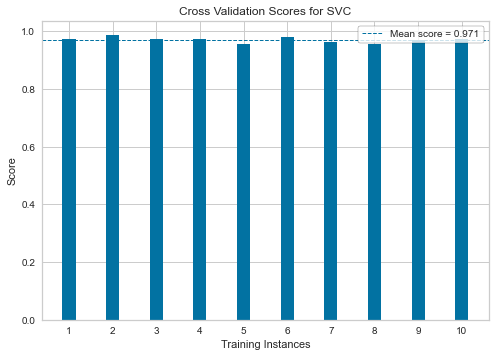

<AxesSubplot:title={'center':'Cross Validation Scores for SVC'}, xlabel='Training Instances', ylabel='Score'>

In [84]:
_, ax = plt.subplots()

# Create a cross-validation strategy
fold = StratifiedKFold(10)

# Create the cv score visualizer
oz = CVScores(
    SVC(C=2,decision_function_shape="ovo",gamma="auto",kernel="linear",random_state=1), ax=ax, cv=fold, scoring='accuracy'
)
oz.fit(X_train, Y_train)
oz.poof()

StratifiedKFold: Provides train/test indices to split data in train/test sets.

- <h> This cross-validation object is a variation of KFold that returns stratified folds. The folds are made by preserving the percentage of samples for each class.

- <h> Following barchart shows Cross Validation Scores for SVC with 10 fold. And average mean score is 0.971

In [85]:
svm_model=SVC(C=2,decision_function_shape="ovo",gamma="auto",kernel="linear",random_state=1)

# Accuracy of Training and testing of SVM model after tuning the SVM Model

In [86]:
svm_model.fit(X_train,Y_train)

SVC(C=2, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovo', degree=3, gamma='auto', kernel='linear',
    max_iter=-1, probability=False, random_state=1, shrinking=True, tol=0.001,
    verbose=False)

In [87]:
print("train_accuracy:",svm_model.score(X_train,Y_train))
print("test_accuracy: ", svm_model.score(X_test,Y_test))

train_accuracy: 0.975
test_accuracy:  0.98


# Conculasion 
## Before Feature selaction and Modeling done without Features Selection
### Cross validation Accuracy
catboost = 0.943750, Logistic= 0.968750, LDA= 0.956250, QDA= 0.928125, Gradient Boosting= 0.912500,
Xgboost= 0.918750, Lightgbm= 0.912500,Random Forest=0.896875,Decision Tree=0.850000,Support Vector=0.893750
### Test Accuracy
catboost = 0.9425, Logistic= 0.9775, LDA= 0.9450, QDA= 0.9400, Gradient Boosting= 0.9050,
Xgboost= 0.9025, Lightgbm= 0.9025,Random Forest=0.8875,Decision Tree=0.8275,Support Vector=0.8925

## After Feature selection and Modeling done with These selected Features
### Cross validation Accuracy
catboost = 0.950000, Logistic= 0.975000, LDA= 0.950000, QDA= 0.981250, Gradient Boosting= 0.915625,
Xgboost= 0.934375, Lightgbm= 0.918750,Random Forest=0.937500,Decision Tree=0.887500,Support Vector=0.953125
### Test Accuracy
catboost = 0.9500, Logistic= 0.9825, LDA= 0.9500, QDA= 0.9750, Gradient Boosting= 0.9050,
Xgboost= 0.9050, Lightgbm= 0.9200,Random Forest=0.9200,Decision Tree=0.8450,Support Vector=0.9375

### Final With SVM with Tuning and Feature selection
Train Accuracy: 0.975 and 
Test Accuracy:  0.98

Accuracy of model Incresed when we perfom Feature Selaction and again incresed when Tune our model

# Create PKL file

In [88]:
import joblib
joblib.dump(svm_model,'Cellphone_Price_Range_Prediction_Model.pkl')

['Cellphone_Price_Range_Prediction_Model.pkl']

##  
   We Train SVM For Cellphone Price Range Prediction.
   
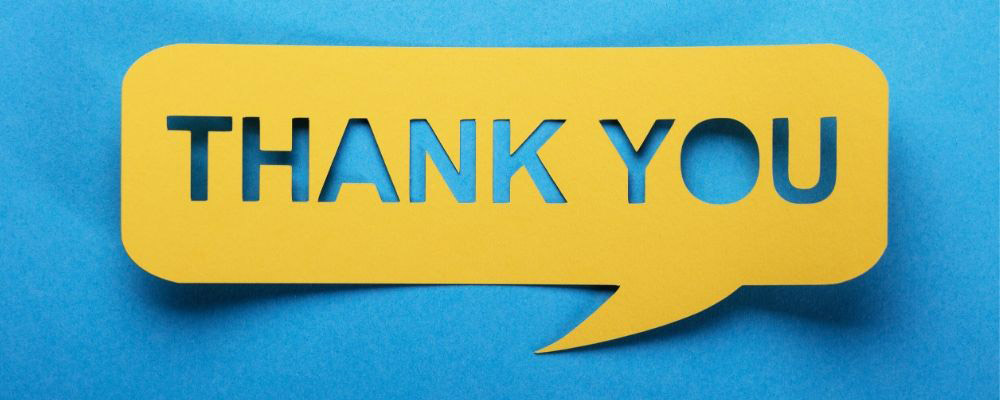